# Export Exposure: Analyzing Turkey's Food Safety Challenges in EU Trade


## Purpose of the Project
![haber logo](haber.png)
[link](https://www.bbc.com/turkce/haberler-dunya-61406244)

Recent news reports have raised concerns about the increasing number of Turkey's food exports being rejected at EU borders due to safety issues. This has sparked a broader discussion about the state of food safety in Turkey, especially considering the potential public health risks if these rejected products are reintroduced into the domestic market or exported elsewhere.

The purpose of this project is to analyze the data from the RASFF (Rapid Alert System for Food and Feed) database to determine whether Turkey has an elevated problem with food safety compared to other exporting countries. By systematically collecting and examining food safety alerts related to Turkey, this analysis aims to identify patterns, trends, and specific areas of concern. The ultimate goal is to draw a data-driven conclusion about the scope and severity of food safety issues in Turkey’s export market.


## **Overview of the Target Website**

### **Website Description**
The RASFF database is a publicly accessible web portal managed by the European Union. It provides detailed information on food safety alerts, including notifications of products that have been rejected at EU borders due to safety concerns.

### **Data Availability**
The site offers detailed records for each alert, including the product category, origin and notifying countries, type of risk, and date of notification. However, the data is paginated and displayed only 25 entries per page, requiring a systematic approach to scrape all the relevant information.

---------------------------------------------

## **Scraping Process**

### **Tools and Libraries Used**
The scraping process was conducted using Python, specifically utilizing the `selenium` library to navigate the website and extract data. The `pandas` library was used for organizing and storing the extracted data into a structured format.

### **Challenges and Solutions**
One of the key challenges was the website's paginated structure, which required navigating through multiple pages to collect all relevant data. Additionally, the site displayed country names as icons, which necessitated extracting and mapping these icons to actual country names. This was achieved by identifying the class attributes associated with the icons and using the `pycountry` library to map ISO country codes to full country names.

### **Detailed Process**
1. **Initialization:**
   - Set up the Selenium WebDriver and configured it to run in headless mode to improve performance.
   
2. **Navigation:**
   - Accessed the RASFF portal and identified the elements containing the relevant data.
   - Implemented a loop to navigate through each page and extract data from the table on each page.

3. **Data Extraction:**
   - Extracted key data points from each entry, including the reference number, product category, origin and notifying countries, validation date, and risk classification.
   - Handled the mapping of origin country codes by extracting class attributes from flag icons and using `pycountry` to convert these codes to full country names.

4. **Data Storage:**
   - Stored the extracted data in a pandas DataFrame and saved it to an Excel file for further analysis.

---------------------------------------------

## **Nature of the Scraped Data**

### **Data Structure**
The scraped data is organized into a structured format with columns representing various attributes of each food safety alert. These include reference numbers, product categories, origin and notifying countries, notification dates, and risk classifications.

### **Data Quality**
The data was generally well-structured, but certain fields, such as country names represented by icons, required additional processing to ensure accuracy. The use of `pycountry` ensured that country names were correctly identified and standardized.

### **Data Limitations**
While the data is comprehensive, it is limited to alerts that have been made public by the RASFF system. Additionally, the origin country information is based on the available flags, which may not always perfectly align with the actual origin of the products.

---------------------------------------------

## **Conclusion**

### **Summary of the Scraping Process**
The web scraping process successfully extracted detailed food safety alerts from the RASFF database, providing valuable insights into the risks associated with Turkey's food exports. The data was systematically collected and processed, resulting in a clean and structured dataset ready for further analysis.

### **Next Steps**
This dataset will now be used to conduct a thorough analysis of food safety trends, with a focus on identifying potential risks related to returned products and their impact on Turkey's food export market.


In [ ]:
# Scraping worked in jupyter notebook environment, different kernel
!pip install openpyxl
!pip install pycountry

from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
import pandas as pd
import pycountry
import time

# Set up Chrome options for headless mode and disable images
chrome_options = Options()
chrome_options.add_argument("--headless")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--blink-settings=imagesEnabled=false")  # Disable images

# Automatically install and manage the correct ChromeDriver version
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Navigate to the URL
url = 'https://webgate.ec.europa.eu/rasff-window/screen/search?searchQueries=eyJkYXRlIjp7InN0YXJ0UmFuZ2UiOiIiLCJlbmRSYW5nZSI6IiJ9LCJjb3VudHJpZXMiOnt9LCJ0eXBlIjp7fSwibm90aWZpY2F0aW9uU3RhdHVzIjp7Im5vdGlmaWNhdGlvblN0YXR1cyI6W1sxXV19LCJwcm9kdWN0Ijp7fSwicmlzayI6e30sInJlZmVyZW5jZSI6IiIsInN1YmplY3QiOiIiLCJwYWdlU2l6ZSI6MjV9'
driver.get(url)

# Wait for the elements to load
WebDriverWait(driver, 10).until(
    EC.presence_of_element_located((By.CLASS_NAME, 'nt-list-item'))
)

# Initialize a list to hold the data
all_data = []

# Function to scrape the relevant data from the current page
def scrape_data():
    items = driver.find_elements(By.CLASS_NAME, 'nt-list-item')
    for item in items:
        reference = item.find_element(By.CLASS_NAME, 'item-reference').text.strip()
        product_category = item.find_element(By.CLASS_NAME, 'item-product-category').text.strip()
        product_type = item.find_element(By.CLASS_NAME, 'item-product-type').text.strip()
        subject = item.find_element(By.CLASS_NAME, 'item-subject').text.strip()
        validation_date = item.find_element(By.CLASS_NAME, 'item-validation-date').text.strip()
        origin_country = item.find_element(By.CLASS_NAME, 'item-origin-country').text.strip()
        notifying_country = item.find_element(By.CLASS_NAME, 'item-notifying-country').text.strip()
        notification_classification = item.find_element(By.CLASS_NAME, 'item-notification-classification').text.strip()
        risk_decision = item.find_element(By.CLASS_NAME, 'item-risk-decision').text.strip()
        
        # Append the scraped data to the list
        all_data.append([reference, product_category, product_type, subject, validation_date, origin_country, notifying_country, notification_classification, risk_decision])
        print([reference, product_category, product_type, subject, validation_date, origin_country, notifying_country, notification_classification, risk_decision])  # Debugging print to verify data

# Scrape the first page
scrape_data()

# Loop through additional pages
page_count = 1
while True:  # Continue until there are no more pages
    try:
        # Scroll to the "Next page" button to bring it into view
        next_button = WebDriverWait(driver, 10).until(
            EC.element_to_be_clickable((By.CLASS_NAME, 'mat-mdc-paginator-navigation-next'))
        )
        driver.execute_script("arguments[0].scrollIntoView(true);", next_button)

        # Use JavaScript to click the "Next page" button
        driver.execute_script("arguments[0].click();", next_button)
        print(f"Clicking to page {page_count + 1}")  # Debugging print

        # Wait for the new page to load and items to be present
        WebDriverWait(driver, 10).until(
            EC.presence_of_all_elements_located((By.CLASS_NAME, 'nt-list-item'))
        )

        scrape_data()
        page_count += 1
    except Exception as e:
        print(f"Encountered an error: {e}")
        break

# Close the driver after scraping
driver.quit()

# Convert data to DataFrame and save
columns = ['Reference', 'Product Category', 'Product Type', 'Subject', 'Validation Date', 'Origin Country', 'Notifying Country', 'Notification Classification', 'Risk Decision']
df = pd.DataFrame(all_data, columns=columns)
print(df.head())  # Debug print to verify DataFrame content
df.to_csv('scraped_data_sample.csv', index=False)

print(f"Scraping completed. {len(all_data)} records saved.")






In [ ]:
excel_file_path = 'scraped_data_complete.xlsx'

# Save the DataFrame to an Excel file
df.to_excel(excel_file_path, index=False)

In [ ]:
# After spotting the website related problem, separately scraped the origin country info from flag icons, then mapped via pycountry.

# Function to get the full country name from the country code
def get_country_name_from_code(country_code):
    try:
        country = pycountry.countries.get(alpha_2=country_code.upper())
        return country.name if country else 'Unknown'
    except KeyError:
        return 'Unknown'

# Set up Chrome options for headless mode and disable images
chrome_options = Options()
chrome_options.add_argument("--headless")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--blink-settings=imagesEnabled=false")  # Disable images

# Automatically install and manage the correct ChromeDriver version
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Navigate to the URL
url = 'https://webgate.ec.europa.eu/rasff-window/screen/search?searchQueries=eyJkYXRlIjp7InN0YXJ0UmFuZ2UiOiIiLCJlbmRSYW5nZSI6IiJ9LCJjb3VudHJpZXMiOnt9LCJ0eXBlIjp7fSwibm90aWZpY2F0aW9uU3RhdHVzIjp7Im5vdGlmaWNhdGlvblN0YXR1cyI6W1sxXV19LCJwcm9kdWN0Ijp7fSwicmlzayI6e30sInJlZmVyZW5jZSI6IiIsInN1YmplY3QiOiIiLCJwYWdlU2l6ZSI6MjV9'
driver.get(url)

# Wait for the elements to load
WebDriverWait(driver, 10).until(
    EC.presence_of_element_located((By.CLASS_NAME, 'nt-list-item'))
)

# Initialize a list to hold the origin country data
origin_country_data = []

# Function to scrape the Origin Country data from the current page
def scrape_origin_country():
    items = driver.find_elements(By.CLASS_NAME, 'nt-list-item')
    for item in items:
        # Extract the country code from the class attribute of the <span> tag
        origin_country_element = item.find_element(By.CLASS_NAME, 'item-origin-country')
        flag_span = origin_country_element.find_element(By.TAG_NAME, 'span')
        country_code = flag_span.get_attribute('class').split('eui-flag-icon-')[-1].strip().split()[0]

        # Use pycountry to get the full country name from the country code
        country_name = get_country_name_from_code(country_code)
        
        # Append the country name to the list
        origin_country_data.append(country_name)
        print(f"Scraped Origin Country: {country_name}")  # Debugging print to verify data

# Scrape the first page
scrape_origin_country()

# Loop through additional pages
page_count = 1
while True:  # Continue until there are no more pages
    try:
        print(f"Processing page {page_count + 1}...")
        
        # Locate and click the next button
        next_button = WebDriverWait(driver, 10).until(
            EC.element_to_be_clickable((By.CLASS_NAME, 'mat-mdc-paginator-navigation-next'))
        )
        driver.execute_script("arguments[0].scrollIntoView(true);", next_button)
        driver.execute_script("arguments[0].click();", next_button)
        print(f"Clicked to page {page_count + 1}, waiting for data to load...")

        # Wait for new page data to load
        WebDriverWait(driver, 10).until(
            EC.presence_of_all_elements_located((By.CLASS_NAME, 'nt-list-item'))
        )

        # Scrape the origin country data from the new page
        scrape_origin_country()

        page_count += 1
        time.sleep(1)  # Optional: Add a small delay to reduce server load
    except Exception as e:
        print(f"Encountered an error: {e}")
        break

# Close the driver after scraping
driver.quit()

# Convert the list of origin countries to a DataFrame and save it as an Excel file
df_origin_countries = pd.DataFrame(origin_country_data, columns=['Origin Country'])
df_origin_countries.to_excel('origin_country_data.xlsx', index=False)

print(f"Scraping completed. {len(origin_country_data)} origin country records saved.")

In [ ]:
# Re-creating the dataframes from the priorly saved Excels
scraped_df = pd.read_excel('scraped_data_complete.xlsx')
origin_country_df = pd.read_excel('origin_country_data.xlsx')
# Replacing the faulty column with the after scraped country of origin
scraped_df['Origin Country'] = origin_country_df['Origin Country']
# Cleaning the charachters of Origin Country
scraped_df['Notifying Country'] = scraped_df['Notifying Country'].str.replace(r'\n \(Notif\)', '', regex=True)
# Whole scraped data before starting to the analysis
scraped_df.to_excel('scraped_data_whole.xlsx', index=False) # Scraped data ready for analysis

# **Discovering, Understanding and Cleaning the Data**
---------------------------------------------


In [ ]:
# Since in a new venv, installing the cornerstones here
#!pip install pandas
#!pip install openpyxl
#!pip install pickleshare for being able to use %store
#!pip install missingno matplotlib seaborn
#!pip install rake-nltk
#!pip install scikit-learn






In [1]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import re
from rake_nltk import Rake
import seaborn as sns
from wordcloud import WordCloud
import plotly.express as px
import numpy as np

In [2]:
df = pd.read_excel('xlsx\scraped_data_whole.xlsx')

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\1921142063.py:1: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_excel('xlsx\scraped_data_whole.xlsx')


In [3]:
# %store df storing the df to be able to retreive later

In [4]:
df.head()

,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision
0,2024.6079,Fish and fish products,food,Listeria monocytogenes in salmon trout from Po...,7 AUG 2024,Poland,Germany,information notification for attention,potentially serious
1,2024.6080,"Cocoa and cocoa preparations,...",food,"Mineral oil (MOAH) in decaf coffee, from Belgium",7 AUG 2024,Belgium,Netherlands,information notification for follow-up,potentially serious
2,2024.6078,Poultry meat and poultry meat...,food,Salmonella spp. in chicken kebab from Poland,7 AUG 2024,Poland,Poland,alert notification,serious
3,2024.6074,"Nuts, nut products and seeds",food,Aflatoxins in pistachios from the Islamic Repu...,7 AUG 2024,"Iran, Islamic Republic of",Germany,border rejection notification,serious
4,2024.6073,Meat and meat products (other...,food,Superación del LMR de Toltrazuril Sulfona en c...,7 AUG 2024,Spain,Spain,information notification for follow-up,potential risk


In [5]:
df.index = df.index + 1

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20696 entries, 1 to 20696
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Reference                    20696 non-null  float64
 1   Product Category             20693 non-null  object 
 2   Product Type                 20696 non-null  object 
 3   Subject                      20693 non-null  object 
 4   Validation Date              20696 non-null  object 
 5   Origin Country               20696 non-null  object 
 6   Notifying Country            20696 non-null  object 
 7   Notification Classification  20696 non-null  object 
 8   Risk Decision                20696 non-null  object 
dtypes: float64(1), object(8)
memory usage: 1.4+ MB


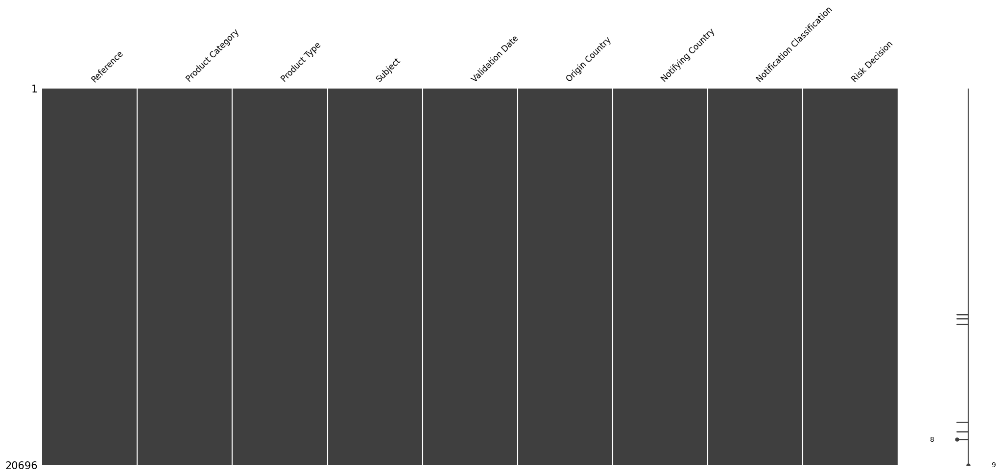

In [7]:
# Visualising missing values 
msno.matrix(df,fontsize = 12)
plt.show()

In [8]:
# Checking out the nulls
df.isnull().sum()

Reference                      0
Product Category               3
Product Type                   0
Subject                        3
Validation Date                0
Origin Country                 0
Notifying Country              0
Notification Classification    0
Risk Decision                  0
dtype: int64

In [9]:
# Pinpointing the rows containing nulls
null_rows = df[df.isnull().any(axis=1)]
null_rows

,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision
12423,2021.7050,NaN,food,Ongoing outbreak of Listeria monocytogenes ST388,22 DEC 2021,Unknown,European Commission,news,serious
12650,2021.6273,NaN,food,3 cattle without ear tags from Croatia,7 DEC 2021,Unknown,Italy,information notification for follow-up,undecided
12955,2021.6236,NaN,food,Dutch Strain linked to Salmonella enteritidis ...,18 NOV 2021,Unknown,Belgium,news,undecided
18336,2020.3979,Fish and fish products,food,NaN,29 SEP 2020,Viet Nam,United Kingdom,information notification for attention,undecided
18861,2020.3183,Meat and meat products (other...,food,NaN,6 AUG 2020,France,Belgium,information notification for follow-up,undecided
19284,2020.2474,Crustaceans and products thereof,food,NaN,17 JUN 2020,India,Belgium,border rejection notification,serious


### Checking the Reference Column

-----------------------------

In [10]:
# Checking whether the only column that we dont want to see any duplicates at all; [Reference]
duplicated_ref = df[df.duplicated(subset = 'Reference', keep = False)]
duplicated_ref


,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision


In [11]:
# Converting the 'Reference' column to the string data type
df['Reference'] = df['Reference'].astype('string')


In [12]:
# Checking the formatting of the Reference column
expected_format = r'^\d{4}\.\d{4}$|^\d{4}\.\d{3}$|^\d{4}\.\d{2}$|^\d{4}\.\d{1}$'
format_issues = ~df['Reference'].str.match(expected_format)
df['Reference'] = df['Reference'].str.strip()
df[format_issues]

,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision


### Checking the Product Category column

-----------------------------------------

In [13]:
# Filling up the nulls instead of dropping them, since they are still valid record for the Risk Decision analysis
df['Product Category'] = df['Product Category'].fillna('Unknown')

In [14]:
# Establishing standartized text
exceptions = ['and', 'or', 'of', 'in', 'on', 'the']

def custom_title_case(text):
    words = text.split()
    return ' '.join([word.capitalize() if word.lower() not in exceptions else word.lower() for word in words])

df['Product Category'] = df['Product Category'].apply(custom_title_case)
df['Product Category'] = df['Product Category'].str.strip()

In [15]:
# Changing dtype to category, since col is categorical data
df['Product Category'] = df['Product Category'].astype('category')

print(df['Product Category'].cat.categories)

Index(['Alcoholic Beverages', 'Animal By-products',
       'Bivalve Molluscs and Products...', 'Cephalopods and Products Thereof',
       'Cereals and Bakery Products', 'Cocoa and Cocoa Preparations,...',
       'Compound Feeds', 'Confectionery', 'Crustaceans and Products Thereof',
       'Dietetic Foods, Food...', 'Eggs and Egg Products', 'Fats and Oils',
       'Feed Additives', 'Feed Materials', 'Feed Premixtures',
       'Fish and Fish Products', 'Food Additives and Flavourings',
       'Food Contact Materials', 'Fruits and Vegetables', 'Gastropods',
       'Herbs and Spices', 'Honey and Royal Jelly', 'Ices and Desserts',
       'Live Animals', 'Meat and Meat Products (other...',
       'Milk and Milk Products', 'Natural Mineral Waters',
       'Non-alcoholic Beverages', 'Nuts, Nut Products and Seeds',
       'Other Food Product / Mixed', 'Pet Food',
       'Poultry Meat and Poultry Meat...', 'Prepared Dishes and Snacks',
       'Soups, Broths, Sauces And...', 'Unknown',
       'Wa

### Checking the Product Type column

------------------------------------

In [16]:
missing_values_count = df['Product Type'].isnull().sum()
missing_values_count

np.int64(0)

In [17]:
df['Product Type'] = df['Product Type'].str.lower()
df['Product Type'] = df['Product Type'].str.strip()
df['Product Type'] = df['Product Type'].astype('category')

print(df['Product Type'].cat.categories)

Index(['animals', 'feed', 'food', 'food contact material', 'other',
       'plants, plant products and other objects'],
      dtype='object')


### Checking the Subject column
Besides the cleaning and formatting of the column, also looking out ways to extract out valuable informations; regarding hazards, product names etc. Testing of different keyword extraction methods are tried here and with basic visualisations to conclude that the method is workable or not.

--------------------------------------------

In [18]:
missing_values_count = df['Subject'].isnull().sum()
missing_values_count

np.int64(3)

In [19]:
df['Subject'] = df['Subject'].fillna('Unknown')

In [20]:
df['Subject'].nunique()

17616

In [21]:
# Preprocessing the subject column for keyword extraction
df['Subject_prep'] = df['Subject'].str.lower()
df['Subject_prep'] = df['Subject_prep'].apply(lambda x: re.sub(r'[^a-z0-9\s]', '', x))
df['Subject_prep'] = df['Subject_prep'].str.strip()

#### Textword extraction via Rake

In [22]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MONSTER\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MONSTER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [23]:
rake = Rake()

# Function to extract keywords using RAKE
def extract_rake_keywords(text):
    rake.extract_keywords_from_text(text)
    return rake.get_ranked_phrases()

# Apply the function to the 'Subject' column
df['Keywords'] = df['Subject_prep'].apply(extract_rake_keywords)

# Display the results
print(df[['Subject_prep', 'Keywords']].head(10))

                                         Subject_prep  \
1   listeria monocytogenes in salmon trout from po...   
2       mineral oil moah in decaf coffee from belgium   
3         salmonella spp in chicken kebab from poland   
4   aflatoxins in pistachios from the islamic repu...   
5   superacin del lmr de toltrazuril sulfona en ca...   
6   przekroczenie ndp ochratoksyny a w rodzynkach ...   
7   improper official certificate for sesame seeds...   
8   consignment of various composite products cont...   
9           aflatoxin b1 in spice mixture from trkiye   
10  pesticide residues chlorpyrifos  in curry powd...   

                                             Keywords  
1      [salmon trout, listeria monocytogenes, poland]  
2           [mineral oil moah, decaf coffee, belgium]  
3             [salmonella spp, chicken kebab, poland]  
4    [islamic republic, pistachios, iran, aflatoxins]  
5   [superacin del lmr de toltrazuril sulfona en c...  
6   [w rodzynkach sutaskich exceedan

#### via TF-IDF 

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [25]:
# Combine all the subjects into a list
corpus = df['Subject_prep'].tolist()

# Initialize the TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features=100)  # Adjust max_features as needed

# Fit and transform the TF-IDF model
tfidf_matrix = vectorizer.fit_transform(corpus)

# Get feature names (i.e., the keywords)
feature_names = vectorizer.get_feature_names_out()

# Convert the TF-IDF matrix to a DataFrame for easier analysis
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)

# Add the TF-IDF results back to the original DataFrame
df_tfidf = pd.concat([df, tfidf_df], axis=1)

# Display the TF-IDF results
print(df_tfidf.head())

   Reference                  Product Category Product Type  \
1  2024.6079            Fish and Fish Products         food   
2   2024.608  Cocoa and Cocoa Preparations,...         food   
3  2024.6078  Poultry Meat and Poultry Meat...         food   
4  2024.6074      Nuts, Nut Products and Seeds         food   
5  2024.6073  Meat and Meat Products (other...         food   

                                             Subject Validation Date  \
1  Listeria monocytogenes in salmon trout from Po...      7 AUG 2024   
2   Mineral oil (MOAH) in decaf coffee, from Belgium      7 AUG 2024   
3       Salmonella spp. in chicken kebab from Poland      7 AUG 2024   
4  Aflatoxins in pistachios from the Islamic Repu...      7 AUG 2024   
5  Superación del LMR de Toltrazuril Sulfona en c...      7 AUG 2024   

              Origin Country Notifying Country  \
1                     Poland           Germany   
2                    Belgium       Netherlands   
3                     Poland          

#### Rake vs TF_IDF 
After checking out the extracted words side by side, Rake did better job in terms of identifying and sorting out the hazard related keywords, tdidf by its abilities did ruled out the non english sentences, but occasionally picked out the words. **VERDICT : Rake wins**

In [26]:
from collections import Counter

# Flatten the list of RAKE keywords to count their occurrences
all_rake_keywords = [keyword for sublist in df['Keywords'] for keyword in sublist]
rake_keyword_counts = Counter(all_rake_keywords)

# Get the sum of TF-IDF scores for each keyword
tfidf_keyword_counts = tfidf_df[feature_names].sum().sort_values(ascending=False)

# Display the most common RAKE keywords
print("Most common RAKE keywords:")
print(rake_keyword_counts.most_common(10))

# Display the top TF-IDF keywords
print("\nTop TF-IDF keywords:")
print(tfidf_keyword_counts.head(10))

Most common RAKE keywords:
[('turkey', 1194), ('poland', 1020), ('india', 891), ('salmonella', 850), ('netherlands', 843), ('aflatoxins', 839), ('china', 745), ('sesame seeds', 674), ('ethylene oxide', 631), ('salmonella spp', 599)]

Top TF-IDF keywords:
salmonella      1415.050646
food             857.657151
turkey           790.813481
frozen           658.811026
unauthorised     653.677211
chicken          625.726271
india            570.662056
poland           564.518943
china            560.017402
seeds            552.983335
dtype: float64


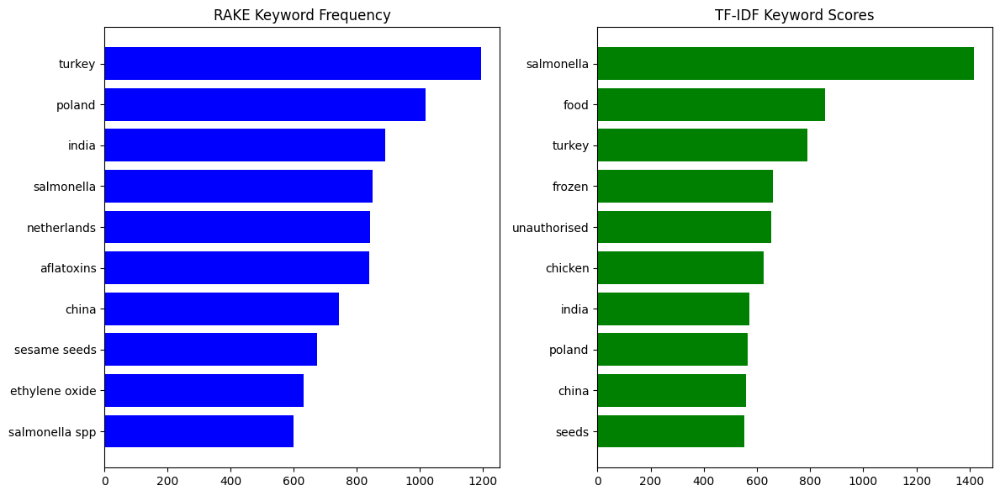

In [27]:
# Top 10 keywords from RAKE and TF-IDF
top_rake_keywords = [kw[0] for kw in rake_keyword_counts.most_common(10)]
top_tfidf_keywords = tfidf_keyword_counts.head(10).index.tolist()

# Compare RAKE vs. TF-IDF for the top 10 keywords
rake_values = [rake_keyword_counts[kw] for kw in top_rake_keywords]
tfidf_values = tfidf_keyword_counts[top_tfidf_keywords]

# Plot the comparison
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.barh(top_rake_keywords, rake_values, color='blue')
plt.title('RAKE Keyword Frequency')
plt.gca().invert_yaxis()

plt.subplot(1, 2, 2)
plt.barh(top_tfidf_keywords, tfidf_values, color='green')
plt.title('TF-IDF Keyword Scores')
plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

In [28]:
# Adding non-zero tfidf outputs as a column to the df
tfidf_array = tfidf_matrix.toarray()

# Function to extract and sort words by their TF-IDF score for each row
def get_sorted_tfidf_words(row):
    # Get the indices of non-zero elements (i.e., words with TF-IDF scores)
    non_zero_indices = row.nonzero()[0]
    
    # Create a list of tuples (word, score)
    words_scores = [(feature_names[i], row[i]) for i in non_zero_indices]
    
    # Sort the list by score in descending order
    sorted_words_scores = sorted(words_scores, key=lambda x: x[1], reverse=True)
    
    # Return just the words, joined by commas
    return ', '.join([word for word, score in sorted_words_scores])

# Apply the function to each row of the TF-IDF array
tfidf_keywords = [get_sorted_tfidf_words(row) for row in tfidf_array]

# Add the result as a new column to the DataFrame
df['TFIDF_Keywords'] = tfidf_keywords

# Display the resulting DataFrame with the new column
print(df[['Subject', 'TFIDF_Keywords']].head())

                                             Subject  \
1  Listeria monocytogenes in salmon trout from Po...   
2   Mineral oil (MOAH) in decaf coffee, from Belgium   
3       Salmonella spp. in chicken kebab from Poland   
4  Aflatoxins in pistachios from the Islamic Repu...   
5  Superación del LMR de Toltrazuril Sulfona en c...   

                     TFIDF_Keywords  
1   monocytogenes, listeria, poland  
2                      belgium, oil  
3  spp, poland, chicken, salmonella  
4  republic, pistachios, aflatoxins  
5                    mrl, en, fresh  


After viewing and comparing keywords(from the rake) and tfidf_keywords column, rake is concluded and the tfidf_keyword column is dropped.

In [29]:
df=df.drop(columns='TFIDF_Keywords')
df.columns

Index(['Reference', 'Product Category', 'Product Type', 'Subject',
       'Validation Date', 'Origin Country', 'Notifying Country',
       'Notification Classification', 'Risk Decision', 'Subject_prep',
       'Keywords'],
      dtype='object')

#### **Checking co-occurances of keywords with Türkiye**

To check out how would the keyword analysis works, printing out the most matched keywords with the keyword 'turkey', also including the differantiated typos.

------------------------------------------------------------

In [30]:
from itertools import combinations

In [31]:
# Create a DataFrame of co-occurrences to further check the analysis prospect of the Keywords extracted
keyword_combinations = [list(combinations(sorted(kw_list), 2)) for kw_list in df['Keywords']]
co_occurrence_counts = Counter([item for sublist in keyword_combinations for item in sublist])

# Display common co-occurrences
print("Common Keyword Co-occurrences:")
print(co_occurrence_counts.most_common(10))

Common Keyword Co-occurrences:
[(('ethylene oxide', 'sesame seeds'), 213), (('poland', 'salmonella enteritidis'), 193), (('black pepper', 'brazil'), 187), (('dried figs', 'turkey'), 170), (('aflatoxins', 'turkey'), 164), (('nigeria', 'sesame seeds'), 162), (('absence', 'sesame seeds'), 132), (('salmonella', 'sesame seeds'), 132), (('ethylene oxide', 'india'), 123), (('chlorpyrifosmethyl', 'turkey'), 118)]


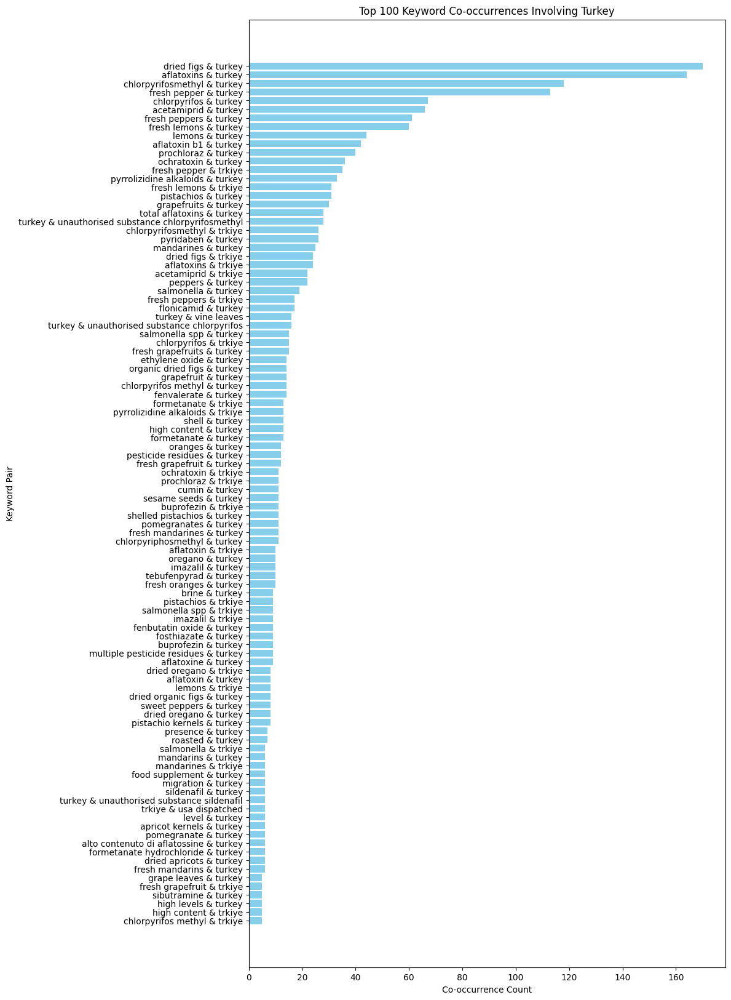

In [32]:
# Create a DataFrame of co-occurrences
keyword_combinations = [
    list(combinations(sorted(kw_list), 2)) 
    for kw_list in df['Keywords'] 
    if any(term in kw_list for term in ['turkey', 'türkiye', 'trkiye'])
]

# Flatten the list of co-occurrences and count them
co_occurrence_counts = Counter([item for sublist in keyword_combinations for item in sublist])

# Filter for co-occurrences that involve 'turkey', 'türkiye', or 'trkiye'
filtered_co_occurrences = {
    k: v for k, v in co_occurrence_counts.items() 
    if any(term in k for term in ['turkey', 'türkiye', 'trkiye'])
}

# Get the top 100 co-occurrences
top_100_co_occurrences = dict(sorted(filtered_co_occurrences.items(), key=lambda x: x[1], reverse=True)[:100])

# Extract the terms and their counts
terms = [' & '.join(k) for k in top_100_co_occurrences.keys()]
counts = list(top_100_co_occurrences.values())

# Visualize the top 50 co-occurrences
plt.figure(figsize=(10, 20))
plt.barh(terms, counts, color='skyblue')
plt.xlabel('Co-occurrence Count')
plt.ylabel('Keyword Pair')
plt.title('Top 100 Keyword Co-occurrences Involving Turkey')
plt.gca().invert_yaxis()  # Highest count on top
plt.show()


### Checking the Validation Date column

---------------------------------------------------

In [33]:
missing_values_count = df['Validation Date'].isnull().sum()
missing_values_count

np.int64(0)

In [34]:
# Checking whether column is consistent in terms of format
pattern = r'^\d{1,2} [A-Z]{3} \d{4}$'

format_check = ~df['Validation Date'].str.match(pattern)
df[format_check]

,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision,Subject_prep,Keywords


In [35]:
# Converted to datetime
df['Validation Date'] = pd.to_datetime(df['Validation Date'], format='%d %b %Y', errors='coerce')

### Checking the Origin Country column

Since the values for the Origin Country column was not available as text or object data type, countries were extracted by the country flag symbols, from their abbreviation embedded in the html, like US or TR etc. While most of the extractions were done correctly, there were plenty of 'Unknown' countries left which by their sheer number, could not be overlooked or dropped; that would affect the analysis. Upon investigating the Subject column, most of the countries name were repeated in the inscription regarding the notification, and by our extracted keyword column, the unknowns were replaced by them via matching the names by pycountry libraries official country names. After finding out there are still unknown values present, some of the country names had to be manually mapped to matched the pycountry's way of labeling, for example, Iran is listed as 'Iran, Islamic Republic of' and several countries sharing similar fate. After manual spotting-matching operation, Origin Column has been completely and correctly prepared for the analysis without any loss of data.


------------------------------------------------------

In [36]:
df['Origin Country'].value_counts()

Origin Country
Türkiye                                   2013
India                                     1446
Poland                                    1397
China                                     1306
France                                    1096
                                          ... 
Cabo Verde                                   1
Cuba                                         1
Greenland                                    1
Fiji                                         1
Korea, Democratic People's Republic of       1
Name: count, Length: 154, dtype: int64

In [37]:
import pycountry

In [38]:
valid_countries = set(country.name for country in pycountry.countries)


actual_countries = set(df['Origin Country'].unique())
outliers = actual_countries - valid_countries


print(f"Outlier countries: {outliers}")


df_outliers = df[df['Origin Country'].isin(outliers)]
df_outliers[df_outliers['Origin Country'] != 'Unknown'] # every outlier is named Unknown

Outlier countries: {'Unknown'}


,Reference,Product Category,Product Type,Subject,Validation Date,Origin Country,Notifying Country,Notification Classification,Risk Decision,Subject_prep,Keywords


In [39]:
countries_to_check = ['Kosovo', 'Vietnam', 'Iran', 'Moldova', 'Czech Republic', 
                      'Netherland', 'North Macedonia', 'UK', 'Laos']

# Function to find and print the official name in pycountry
def check_country_names(countries):
    for country in countries:
        # Check if country exists in pycountry and print its official name
        matching_countries = [c for c in pycountry.countries if country.lower() in c.name.lower()]
        if matching_countries:
            for c in matching_countries:
                print(f"{country} found as: {c.name}")
        else:
            print(f"{country} not found in pycountry")

check_country_names(countries_to_check)           

Kosovo not found in pycountry
Vietnam not found in pycountry
Iran found as: Iran, Islamic Republic of
Moldova found as: Moldova, Republic of
Czech Republic not found in pycountry
Netherland found as: Netherlands
North Macedonia found as: North Macedonia
UK found as: Ukraine
Laos not found in pycountry


In [40]:
# Get the set of valid country names from pycountry
country_names = {country.name.lower(): country.name for country in pycountry.countries}

# Add custom mappings for missing or misspelled country names
custom_country_mapping = {
    'kosovo': 'Kosovo',
    'vietnam': 'Viet Nam',
    'iran': 'Iran, Islamic Republic of',
    'moldova': 'Moldova, Republic of',
    'czech republic': 'Czechia',
    'netherland': 'Netherlands',
    'uk': 'United Kingdom',
    'laos': 'Laos',
    'nord macedonia': 'North Macedonia',
    'turkey': 'Türkiye'  # Handle common typo
}

# Combine the pycountry names with the custom mapping
country_names.update(custom_country_mapping)

# Function to find a country name in the subject text
def find_country_in_subject(subject):
    for country_key, country_name in country_names.items():
        if country_key in subject:
            return country_name  # Return the correctly capitalized country name
    return None

# Apply the function to update 'Origin Country' where it's 'Unknown'
df.loc[df['Origin Country']== 'Unknown', 'Origin Country'] = df.loc[df['Origin Country']== 'Unknown', 'Subject_prep'].apply(find_country_in_subject)
df = df[df['Origin Country'].notna()]

In [41]:
# Three of the Türkiye mappings were false flagged; mistook animal name turkey as country name, dropped after checking.
ids_to_drop = [4623, 10198, 19061]
df = df.drop(ids_to_drop)

df.reset_index(drop=True, inplace=True)
df.index = df.index + 1

### Checking the Notification Classification column

-----------------------------------

In [42]:
df['Notification Classification'].unique()

array(['information notification for attention',
       'information notification for follow-up', 'alert notification',
       'border rejection notification', 'news',
       'non-compliance notification'], dtype=object)

In [43]:
df['Notification Classification'].nunique()

6

In [44]:
df['Notification Classification'] = df['Notification Classification'].astype('category')

In [45]:
df['Notification Classification'].describe()

count                             20296
unique                                6
top       border rejection notification
freq                               6569
Name: Notification Classification, dtype: object

### Checking the Risk Decision column

----------------------------------

In [46]:
df['Risk Decision'].unique()

array(['potentially serious', 'serious', 'potential risk', 'not serious',
       'no risk', 'undecided'], dtype=object)

In [47]:
df['Risk Decision'] = df['Risk Decision'].astype('category')

In [48]:
df['Risk Decision'].value_counts()

Risk Decision
serious                11399
not serious             3152
undecided               2914
potential risk          1408
potentially serious     1118
no risk                  305
Name: count, dtype: int64

# **Analysis**
----------------------------------------------------------

## **Getting to Know The Data**

### **1.What is the general geographical distribution of notifications?**

Focusing on the country of origin column to observe the geographical distribution of notifications could serve as a strong starting point for getting acquainted with the data. This analysis will be visualized to allow for a concrete comparison of Turkey’s position relative to other countries. As the initial indicator of our analysis, it should be known that as an a priori belief, Turkey ranks first.

General import data (tonnage, quantity, or number of customs entries) was not accessible. However, table visuals from the **Monitoring EU Agri-Food Trade, Developments in 2023, Publication 2024** report have been included to provide insight into the overall distribution and where Turkey stands.

<div style="display: flex; justify-content: space-between;">
  <img src="top_15_import.png" alt="Top 15 Imports" style="width: 48%;">
  <img src="top_import_items.png" alt="Top Food Categories" style="width: 48%;">
</div>


In [49]:
import plotly.io as pio

pio.renderers.default = 'png'

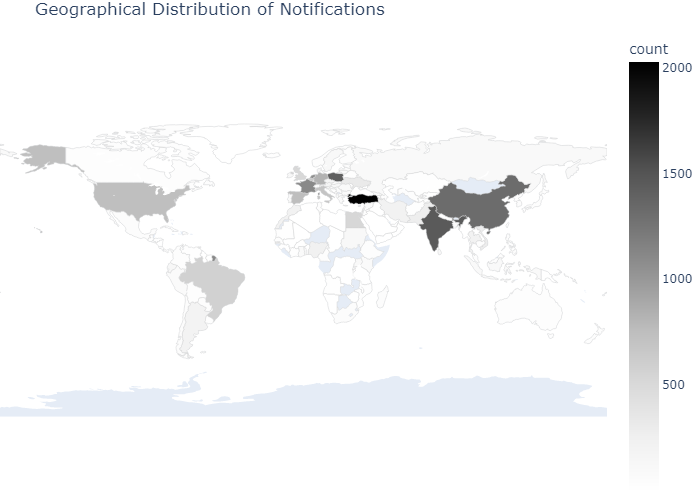

In [50]:
# Creating the choropleth map
country_counts = df['Origin Country'].value_counts().reset_index()
country_counts.columns = ['name', 'count']
country_counts['name'] = country_counts['name'].replace('Türkiye', 'Turkey')

fig = px.choropleth(country_counts, 
                    locations="name", 
                    locationmode="country names",
                    color="count", 
                    hover_name="name",
                    color_continuous_scale=px.colors.sequential.Greys,
                    title="Geographical Distribution of Notifications")

fig.update_layout(
    geo=dict(showframe=False, showcoastlines=False),
    margin={"r":0,"t":30,"l":0,"b":0}
)
fig.update_traces(marker_line_width=0.5, marker_line_color='lightgray')

fig.show()

### **2.Changes in notifications over time by risk decision and notification classification**

#### Plot 1: Number of Notifications Over Time by Risk Decision

1. **Overall Trend:**
   - There is a noticeable spike in notifications starting around 2020, which might be linked to a specific event or change in regulations or monitoring practices.
   - The most significant increase is in the "serious" category, which consistently leads in the number of notifications after 2020.

2. **Categories:**
   - **Serious:** This category dominates the number of notifications, especially after 2020, indicating a potential increase in the detection or reporting of serious risks.
   - **Potentially Serious:** The second highest category, showing a similar upward trend, though less pronounced than "serious."
   - **Other Categories:** "Not serious," "potential risk," "undecided," and "no risk" categories show relatively lower and more stable trends over time. However, they also experience an increase post-2020.

3. **Derivation:**
   - The significant rise in "serious" notifications around 2020 could suggest an increase in the identification of higher-risk issues or a change in the threshold for categorizing risks.
   - The upward trends across all categories might indicate enhanced vigilance, better reporting systems, or possibly an increase in issues detected during this period.

#### Plot 2: Number of Notifications Over Time by Notification Classification

1. **Overall Trend:**
   - Similar to the Risk Decision plot, there is a significant rise in notifications from 2020 onwards across most classifications.

2. **Categories:**
   - **Border Rejection Notification:** This category sees the highest number of notifications post-2020, suggesting increased rejections at borders, possibly due to stricter checks or increased non-compliance.
   - **Alert Notification:** Also sees a significant increase, indicating more urgent or high-priority notifications.
   - **Information Notifications:** Both "for attention" and "for follow-up" show an upward trend, indicating a greater need for information sharing or follow-up actions.
   - **Other Categories:** "News" and "non-compliance notification" categories have fewer notifications but still follow a rising trend.

3. **Derivation:**
   - The spike in border rejection notifications may point to stricter import/export controls, increased non-compliance with regulations, or better enforcement mechanisms.
   - The rising trend in alert notifications suggests an increased incidence of urgent risks or threats being identified.
   - The overall trend points towards increased regulatory scrutiny or a response to a specific external factor starting in 2020.

#### Cross-Analysis:
- Both plots show a significant increase in notifications starting in 2020, particularly in serious risks and border rejections. This could correlate with external events such as the global COVID-19 pandemic, which might have led to more stringent controls, increased monitoring, or changes in the global supply chain.
- The prominence of "serious" risk and "border rejection" notifications suggests that post-2020, there was a greater emphasis on managing higher-risk issues and ensuring compliance with regulations at borders.

#### Additional Observation:
- In the Risk Decision plot, the **"potentially serious"** classification started to show a more distinct presence in 2023. Before 2023, this category had a relatively lower presence, but starting in 2023, there is a noticeable increase in the number of notifications classified as "potentially serious." This may be due to changes in how risks are assessed or reported, new guidelines, or evolving standards that have led to reclassifying incidents under this category.


C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\1053444349.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\1053444349.py:27: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



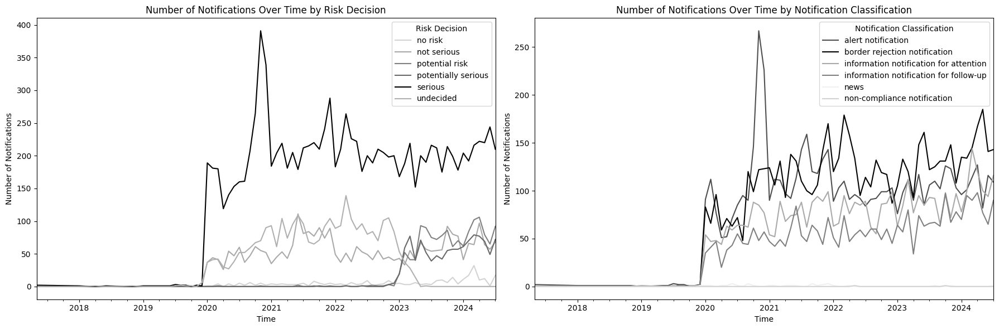

In [51]:
# Custom color palettes
custom_palette = {
    'no risk': '#d3d3d3',  # Light gray
    'not serious': '#a9a9a9',  # Medium gray
    'potential risk': '#808080',  # Darker gray
    'potentially serious': '#696969',  # Even darker gray
    'serious': '#000000',  # Black
    'undecided': '#b0b0b0'  # Slightly darker gray than 'no risk', but lighter than 'serious'
}

custom_palette2 = {
    'border rejection notification': '#000000',  # Darkest gray (black)
    'alert notification': '#4f4f4f',  # Dark gray
    'information notification for follow-up': '#808080',  # Medium dark gray
    'information notification for attention': '#a9a9a9',  # Medium gray
    'non-compliance notification': '#d3d3d3',  # Light gray
    'news': '#f0f0f0'  # Lightest gray
}

cutoff_date = '2024-08-01'  # Adjust this date based on where to cut off for avoiding totaling at the end of the lines

# Filter the DataFrame to only include data up to the cutoff date
df_filtered = df[df['Validation Date'] < cutoff_date]

# Group by time and risk decision
time_series_data_risk = df_filtered.groupby([df_filtered['Validation Date'].dt.to_period("M"), 'Risk Decision']).size().unstack(fill_value=0)
time_series_data_classification = df_filtered.groupby([df_filtered['Validation Date'].dt.to_period("M"), 'Notification Classification']).size().unstack(fill_value=0)

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))  # 1 row, 2 columns

# Plot 1: Number of Notifications Over Time by Risk Decision
time_series_data_risk.plot(ax=axs[0], kind='line', color=[custom_palette[col] for col in time_series_data_risk.columns])
axs[0].set_title("Number of Notifications Over Time by Risk Decision")
axs[0].set_xlabel("Time")
axs[0].set_ylabel("Number of Notifications")

# Plot 2: Number of Notifications Over Time by Notification Classification
time_series_data_classification.plot(ax=axs[1], kind='line', color=[custom_palette2[col] for col in time_series_data_classification.columns])
axs[1].set_title("Number of Notifications Over Time by Notification Classification")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Number of Notifications")

# Show the combined plot
plt.tight_layout()  # Adjust spacing between plots
plt.show()

### 3.Which product types fall into which notification classifications, proportionally?

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\869022743.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

c:\Users\MONSTER\Desktop\RASFF project\.venv\Lib\site-packages\plotly\express\_core.py:1706: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

c:\Users\MONSTER\Desktop\RASFF project\.venv\Lib\site-packages\plotly\express\_core.py:1706: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



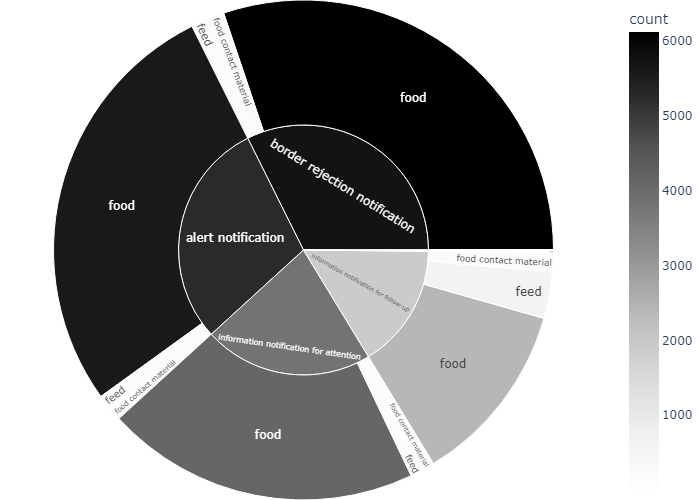

In [52]:
notprod_count = df.groupby(['Notification Classification', 'Product Type']).size().reset_index(name='count')
notprod_count = notprod_count[notprod_count['count'] > 0]

fig = px.sunburst(notprod_count, path=['Notification Classification', 'Product Type'], 
                  values='count', color='count', 
                  color_continuous_scale='Greys')
fig.update_layout(margin=dict(t=0, l=0, r=0, b=0))
fig.show()

### 4.Which risk decision classification is most commonly associated with each product category?

#### Observations:

1. **High-Risk Categories:**
   - **Fruits and Vegetables:** This category has the highest number of "serious" risk decisions (1,955), indicating that a significant portion of the notifications in this category are of serious concern.
   - **Herbs and Spices:** This category also shows a high number of "serious" risk decisions (973), suggesting it is another area with significant food safety concerns.
   - **Fish and Fish Products:** This category has a considerable number of "serious" risk decisions (628), which highlights it as another critical area for food safety.
   - **Nuts, Nut Products, and Seeds:** This category stands out with the highest number of "serious" risk decisions (2,034), making it a major focus for risk management in food safety.

2. **Potentially Serious and Other Risks:**
   - **Dietetic Foods, Food Supplements:** This category has a substantial number of "potentially serious" (96) and "serious" (577) risk decisions, which may indicate that products in this category are often flagged for risks that could escalate.
   - **Fish and Fish Products:** Besides the "serious" risks, there is also a noticeable number of "potentially serious" risk decisions (37).

3. **Less Frequent Risk Categories:**
   - Categories like **Gastropods, Live Animals,** and **Water For Human Consumption** have very few or no entries across most risk decisions, indicating these categories might be less frequently monitored or less prone to risk.

4. **Undecided Risks:**
   - There are considerable numbers of "undecided" risk decisions in categories like **Fruits and Vegetables** (856), **Dietetic Foods** (396), and **Herbs and Spices** (128). This might suggest that in these categories, a significant number of cases require further investigation before a definitive risk decision can be made.

5. **No Risk and Not Serious:**
   - Some categories, such as **Fruits and Vegetables** (101) and **Herbs and Spices** (29), also have entries under "no risk," though these numbers are relatively low compared to the "serious" and "potentially serious" decisions.
   - **Cereals and Bakery Products** have a notable number of "not serious" risk decisions (197), indicating that while risks are present, they may not often be classified as severe.

#### Derivations:

1. **Focus Areas:**
   - The heatmap highlights **Nuts, Nut Products, and Seeds, Fruits and Vegetables, Herbs and Spices,** and **Fish and Fish Products** as categories that require significant attention due to the high number of serious risk decisions. These categories might be subjected to stricter regulations, more frequent inspections, or more stringent safety measures.

2. **Risk Management:**
   - The presence of large numbers of "serious" and "potentially serious" risk decisions in certain categories suggests that these areas are crucial for risk management strategies. There may be a need for better control measures, improved quality assurance processes, or more detailed regulatory oversight in these categories.

3. **Further Investigation:**
   - The substantial number of "undecided" risk decisions in categories like **Fruits and Vegetables** and **Dietetic Foods** indicates areas where additional investigation or more precise risk assessment criteria might be necessary.

4. **Regulatory Implications:**
   - The data suggests that certain product categories, particularly those with high numbers of "serious" risk decisions, might be under more regulatory scrutiny. This could impact businesses operating in these sectors, as they might face more rigorous compliance requirements.

#### Conclusion:

The heatmap provides a clear visual representation of which product categories are associated with the highest risk decisions, emphasizing the need for focused risk management in specific areas. Categories like **Nuts, Nut Products, and Seeds, Fruits and Vegetables, Herbs and Spices,** and **Fish and Fish Products** are particularly critical, and they should be prioritized for safety measures and regulatory attention.


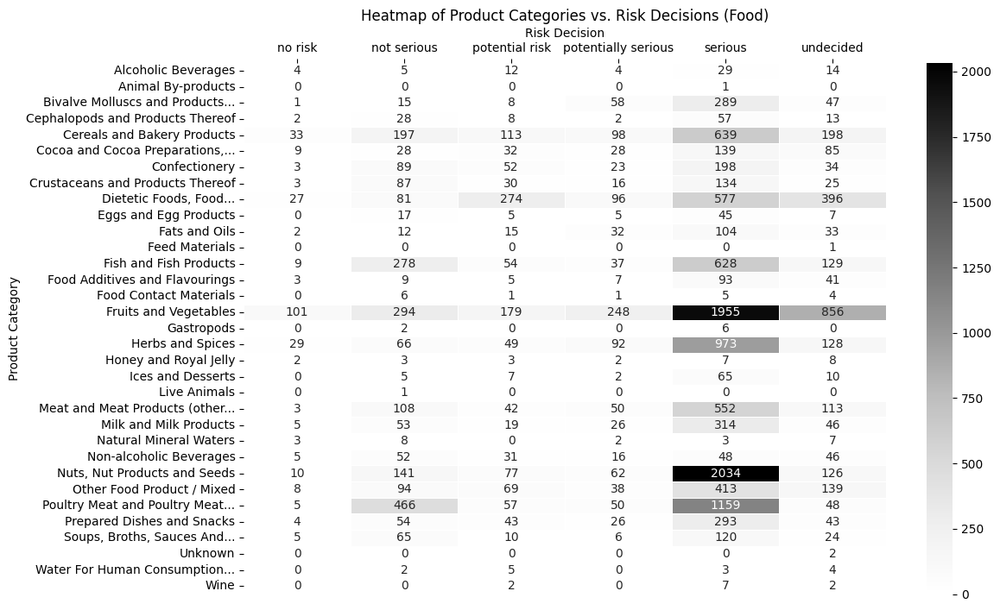

In [53]:
food_df = df[df['Product Type'] == 'food']
heatmap_data = pd.crosstab(food_df['Product Category'], food_df['Risk Decision'])

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='Greys', annot=True, fmt='d', linewidths=.5)
plt.title("Heatmap of Product Categories vs. Risk Decisions (Food)")

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')


plt.show()

### 5.Which notification classification is most commonly associated with each product category?

#### Observations:

1. **High-Notification Categories:**
   - **Fruits and Vegetables:** This category has the highest number of "border rejection notifications" (1,974) and "information notification for follow-up" (837). This suggests that this category faces significant issues at border checks, likely due to non-compliance with regulations or safety standards.
   - **Nuts, Nut Products, and Seeds:** This category also has a high number of "border rejection notifications" (1,496) and a notable count of "information notification for follow-up" (282), indicating similar challenges as seen with Fruits and Vegetables.
   - **Poultry Meat and Poultry Meat Products:** This category has significant numbers in both "alert notifications" (604) and "information notification for follow-up" (742), pointing towards concerns that require immediate attention and follow-up actions.

2. **Alert Notifications:**
   - Categories such as **Dietetic Foods, Food Supplements** (391), **Herbs and Spices** (410), **Fish and Fish Products** (303), and **Meat and Meat Products (other than poultry)** (392) also have substantial numbers of "alert notifications." This indicates a widespread presence of urgent or high-priority notifications in these categories.

3. **Border Rejection Notifications:**
   - Apart from Fruits and Vegetables and Nuts, other categories with high "border rejection notifications" include **Fish and Fish Products** (334) and **Herbs and Spices** (667). These categories might be facing challenges related to regulatory compliance during import/export processes.

4. **Information Notifications:**
   - **Dietetic Foods, Food Supplements** (524) and **Meat and Meat Products (other than poultry)** (236) have high counts of "information notification for attention," indicating these products often require close monitoring and attention.
   - **Cereals and Bakery Products** (240) also have a noticeable count of "information notification for attention," suggesting the need for careful oversight.

5. **Less Frequent Categories:**
   - Categories like **Gastropods, Live Animals,** and **Water For Human Consumption** have very few or no entries across most notification classifications, indicating these categories might be less frequently monitored or less prone to notification issues.

6. **News and Non-Compliance Notifications:**
   - These categories show very few notifications across the board, suggesting that most issues are identified and managed under the other classifications rather than being publicly highlighted or flagged for non-compliance.

#### Derivations:

1. **Focus Areas for Improvement:**
   - The heatmap highlights **Fruits and Vegetables, Nuts, Nut Products, and Seeds,** and **Poultry Meat and Poultry Meat Products** as categories that require significant attention due to the high number of border rejections and alert notifications. These categories might benefit from enhanced quality control measures and stricter adherence to safety standards to reduce these notifications.
   - **Herbs and Spices** also stand out as needing better regulatory compliance, given the high number of border rejection notifications.

2. **Risk Management and Regulatory Focus:**
   - The substantial number of border rejection notifications in certain categories suggests that these areas are critical for regulatory focus. Authorities might need to enforce stricter import/export controls, and businesses may need to improve compliance to avoid rejections.
   - The high number of alert notifications in categories like **Dietetic Foods, Food Supplements** and **Poultry Meat** indicates the need for urgent attention to potential risks, which may involve quick corrective actions.

3. **Resource Allocation:**
   - The data suggests that regulatory agencies might need to allocate more resources to monitor and manage categories with high notification counts. This could involve more frequent inspections, better enforcement of standards, and possibly targeted interventions in supply chains.

4. **Trend Monitoring:**
   - The prevalence of information notifications, particularly for follow-up, indicates ongoing issues that need continuous monitoring. Categories with high numbers of such notifications might benefit from more proactive risk management strategies.

#### Conclusion:

This heatmap underscores the importance of targeted risk management and regulatory focus on specific product categories within the food industry. **Fruits and Vegetables, Nuts, Nut Products, and Seeds,** and **Poultry Meat and Poultry Meat Products** stand out as categories that require significant attention to reduce border rejections and alert notifications. Enhanced regulatory measures, better compliance, and continuous monitoring could help mitigate the risks and improve safety outcomes in these categories.


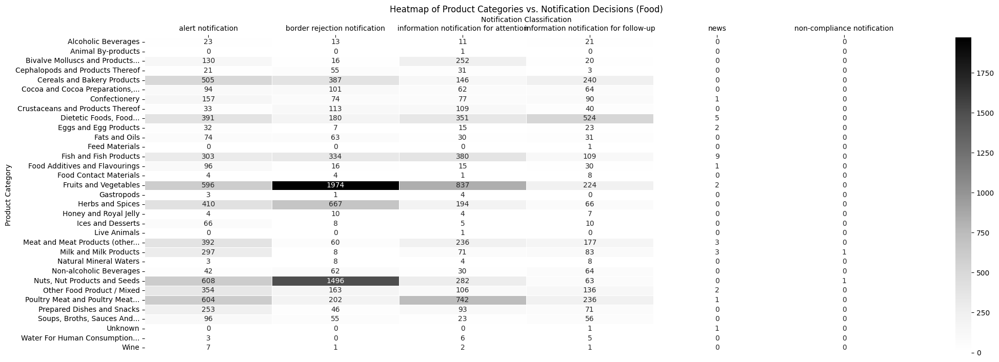

In [54]:
food_df = df[df['Product Type'] == 'food']
heatmap_data = pd.crosstab(food_df['Product Category'], food_df['Notification Classification'])

plt.figure(figsize=(24, 8))
sns.heatmap(heatmap_data, cmap='Greys', annot=True, fmt='d', linewidths=.5)
plt.title("Heatmap of Product Categories vs. Notification Decisions (Food)")

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')



plt.show()

### 6.Which hazards are the most frequent reasons of notification across all?

Hazard terms have been collected in order from the most frequently repeated keywords related to the food category, paying attention to spelling variations and whether they appear within a compound word. Different types of salmonella and aflatoxins, which are mentioned in various forms, have been classified separately since they indicate scientific differences.

Here are the mentioned substances and their ranking by severity:

#### 1. **Aflatoxins**
   - **Severity**: Extremely High
   - **Reason**: Aflatoxins, particularly Aflatoxin B1, are among the most potent carcinogens, primarily causing liver cancer. They are highly toxic even at low levels and a significant public health concern, especially in regions with inadequate food storage.

#### 2. **Ethylene Oxide**
   - **Severity**: Very High
   - **Reason**: A known human carcinogen, ethylene oxide is linked to cancers such as leukemia and lymphoma and can cause mutagenic effects at low exposure levels.

#### 3. **Chlorpyrifos**
   - **Severity**: High
   - **Reason**: This pesticide is highly neurotoxic, particularly to children, leading to developmental and cognitive issues. It has been banned or restricted in many regions due to its severe health risks.

#### 4. **Ochratoxin**
   - **Severity**: High
   - **Reason**: A nephrotoxic mycotoxin linked to kidney damage and potentially to cancer, especially in regions with high exposure through contaminated food products.

#### 5. **Lead**
   - **Severity**: High
   - **Reason**: Lead is a pervasive neurotoxin, particularly harmful to children. It causes irreversible brain damage and has severe long-term health impacts, even at low exposure levels.

#### 6. **Mercury**
   - **Severity**: High
   - **Reason**: Mercury is a potent neurotoxin that can cause severe developmental issues in fetuses and children, and neurological problems in adults. It is especially dangerous when bioaccumulated in the food chain.

#### 7. **Listeria monocytogenes**
   - **Severity**: High
   - **Reason**: Causes listeriosis, a serious infection with high mortality rates, particularly dangerous for pregnant women, newborns, and immunocompromised individuals.

#### 8. **Salmonella (General)**
   - **Severity**: Moderate
   - **Reason**: Salmonella causes common foodborne illnesses with symptoms such as diarrhea, fever, and abdominal cramps. While serious, particularly for vulnerable groups, it is usually treatable and less severe than chronic toxins.

#### 9. **Salmonella Enteritidis**
   - **Severity**: Moderate
   - **Reason**: A specific strain of Salmonella, it causes severe foodborne illness associated with eggs and poultry, leading to hospitalization and potentially death in severe cases.

#### 10. **Salmonella Typhimurium**
   - **Severity**: Moderate
   - **Reason**: Another specific strain of Salmonella, commonly associated with foodborne illnesses. It can cause severe gastrointestinal issues but is generally treatable.

#### 11. **Salmonella Infantis**
   - **Severity**: Moderate
   - **Reason**: This strain of Salmonella is less common but still a significant cause of foodborne illness, particularly in infants and young children.

#### 12. **Pesticide Residues**
   - **Severity**: Moderate
   - **Reason**: Residues from various pesticides can be harmful, especially with chronic exposure. While the specific effects depend on the pesticide, they generally pose moderate to high risks depending on concentration and exposure.

#### 13. **Pyrrolizidine Alkaloids**
   - **Severity**: Moderate
   - **Reason**: These are toxic compounds found in certain plants that can cause liver damage and potentially cancer when consumed in significant quantities.

#### 14. **Cadmium**
   - **Severity**: Moderate
   - **Reason**: Cadmium is a toxic heavy metal that can cause kidney damage and bone demineralization. Chronic exposure may also lead to cancer.

#### 15. **Norovirus**
   - **Severity**: Moderate
   - **Reason**: A highly contagious virus causing gastroenteritis. While usually not fatal, it leads to severe symptoms, particularly in vulnerable populations.

#### 16. **Acetamiprid**
   - **Severity**: Moderate
   - **Reason**: A neonicotinoid pesticide that is less toxic than older pesticides but still poses risks, particularly to the nervous system and reproductive health with long-term exposure.

#### 17. **Histamine**
   - **Severity**: Low to Moderate
   - **Reason**: High levels of histamine in food can cause "scombroid poisoning," with symptoms like rash, diarrhea, and vomiting. Though uncomfortable, it is usually not life-threatening.

#### 18. **2-Chloroethanol**
   - **Severity**: Low to Moderate
   - **Reason**: A chemical used in various industrial processes, it can be harmful if ingested or inhaled, with potential effects on the liver and kidneys, but generally less severe than other toxins.

#### 19. **Tricyclazole**
   - **Severity**: Low to Moderate
   - **Reason**: A fungicide with low acute toxicity, but long-term exposure could pose risks. However, it is generally considered less harmful compared to other substances on this list.


In [55]:
pd.set_option('display.max_rows', 10) 
pd.set_option('display.max_columns', None)

**Picking the frequent term words**

In [56]:
all_keywords = df['Keywords'].explode()

# Count the frequency of each keyword
keyword_counts = Counter(all_keywords)

# Convert the counts to a DataFrame for easier analysis and sorting
keyword_counts_df = pd.DataFrame(keyword_counts.items(), columns=['Keyword', 'Count']).sort_values(by='Count', ascending=False)

# Step 3: List out the top 50 or 100 most frequent keywords
top_keywords_df = keyword_counts_df.head(100)
top_keywords_df.head(50)

,Keyword,Count
91,turkey,1194
2,poland,1020
81,india,891
114,netherlands,843
169,salmonella,840
...,...,...
9,pistachios,165
550,usa,162
21,mrl,162
121,unauthorised use,162


**Defining the target keyword map**

In [57]:
# Define the target keywords and special handling rules
target_keywords = {
    'salmonella': ['salmonella', 'salmonella spp'],  # General salmonella
    'aflatoxins': ['aflatoxins', 'aflatoxin'],  # Exclude 'aflatoxin b1'
    'aflatoxin b1': ['aflatoxin b1'],  # Separate strain
    'ethylene oxide': ['ethylene oxide'],
    'listeria monocytogenes': ['listeria monocytogenes'],
    'chlorpyrifos': ['chlorpyrifos'],
    'chlorpyrifosmethyl': ['chlorpyrifosmethyl'],
    'cadmium': ['cadmium'],
    'pesticide residues': ['pesticide residues', 'pesticides residues'],
    'ochratoxin': ['ochratoxin'],
    'mercury': ['mercury'],
    'norovirus': ['norovirus'],
    'acetamiprid': ['acetamiprid'],
    'lead': ['lead'],
    'pyrrolizidine alkaloids': ['pyrrolizidine alkaloids'],
    'histamine': ['histamine'],
    '2chloroethanol': ['2chloroethanol'],
    'tricyclazole': ['tricyclazole']
}

In [58]:
# Function to aggregate keywords with specific handling for strains
def aggregate_keywords_v4(keywords):
    consolidated_keywords = []
    for keyword in keywords:
        found = False
        
        # Special handling for Salmonella strains
        if 'salmonella enteritidis' in keyword:
            consolidated_keywords.append('salmonella enteritidis')
            continue
        elif 'salmonella infantis' in keyword:
            consolidated_keywords.append('salmonella infantis')
            continue
        elif 'salmonella typhimurium' in keyword:
            consolidated_keywords.append('salmonella typhimurium')
            continue
        elif 'salmonella' in keyword and ('enteritidis' not in keyword and 'infantis' not in keyword and 'typhimurium' not in keyword):
            consolidated_keywords.append('salmonella')
            continue
        
        # Special handling for Aflatoxins
        if 'aflatoxin b1' in keyword:
            consolidated_keywords.append('aflatoxin b1')
            continue
        elif 'aflatoxin' in keyword:
            consolidated_keywords.append('aflatoxins')
            continue
        
        # General keyword matching based on the mapping
        for target, patterns in target_keywords.items():
            if any(pattern in keyword for pattern in patterns):
                consolidated_keywords.append(target)
                found = True
                break
        
        # If no match found, keep the original keyword
        if not found:
            consolidated_keywords.append(keyword)
    
    return consolidated_keywords

filtered_df = df[df['Product Type'] == 'food']

# Apply the aggregation function to the Keywords column
filtered_df['Aggregated Keywords'] = filtered_df['Keywords'].apply(aggregate_keywords_v4)

# Explode the Aggregated Keywords to create a flat list of all keywords
all_aggregated_keywords = filtered_df['Aggregated Keywords'].explode()

# Count the frequency of each aggregated keyword
aggregated_keyword_counts = all_aggregated_keywords.value_counts()

# Display the top 50 aggregated keywords
print(aggregated_keyword_counts.head(50))

Aggregated Keywords
salmonella      2072
aflatoxins      1537
turkey          1172
chlorpyrifos    1023
poland           966
                ... 
mrl              156
iran             153
oranges          150
morocco          147
detection        143
Name: count, Length: 50, dtype: int64


C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\4130516410.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
filtered_df_copy = filtered_df

In [60]:
target_keywords_salm_filter = {
    'salmonella': ['salmonella', 'salmonella spp'],
    'aflatoxins': ['aflatoxins', 'aflatoxin'],  # Exclude 'aflatoxin b1'
    'aflatoxin b1': ['aflatoxin b1'],  # Separate strain
    'ethylene oxide': ['ethylene oxide'],
    'listeria monocytogenes': ['listeria monocytogenes'],
    'chlorpyrifos': ['chlorpyrifos'],
    'chlorpyrifosmethyl': ['chlorpyrifosmethyl'],
    'salmonella enteritidis': ['salmonella enteritidis'],
    'salmonella infantis': ['salmonella infantis'],
    'cadmium': ['cadmium'],
    'pesticide residues': ['pesticide residues', 'pesticides residues'],
    'ochratoxin': ['ochratoxin'],
    'mercury': ['mercury'],
    'norovirus': ['norovirus'],
    'acetamiprid': ['acetamiprid'],
    'salmonella typhimurium': ['salmonella typhimurium'],
    'lead': ['lead'],
    'pyrrolizidine alkaloids': ['pyrrolizidine alkaloids'],
    'histamine': ['histamine'],
    '2chloroethanol': ['2chloroethanol'],
    'tricyclazole': ['tricyclazole']
}

In [61]:
filtered_aggregated_keyword_counts = aggregated_keyword_counts[aggregated_keyword_counts.index.isin(target_keywords_salm_filter.keys())]

keyword_counts_sfa = filtered_aggregated_keyword_counts.sort_values(ascending=False)

# Display the sorted and filtered keyword counts
print(keyword_counts_sfa)

Aggregated Keywords
salmonella                2072
aflatoxins                1537
chlorpyrifos              1023
ethylene oxide             932
listeria monocytogenes     537
                          ... 
salmonella typhimurium     135
histamine                  116
2chloroethanol             107
lead                        97
tricyclazole                93
Name: count, Length: 20, dtype: int64


### What are the hazard frequencies of top 20 keywords by top 10 notified countries? 

#### Observations:

1. **Dominant Hazards:**
   - **Salmonella:** This hazard is most frequently associated with products from **Poland (466)**, **Brazil (393)**, and **India (94)**, indicating that salmonella is a significant issue for food exports from these countries.
   - **Aflatoxins:** **Türkiye (346)** and **Egypt (263)** have the highest number of notifications related to aflatoxins, making it a critical concern for these countries.
   - **Chlorpyrifos:** This pesticide is frequently found in products from **Türkiye (423)** and **India (91)**, suggesting potential issues with pesticide use in these countries.
   - **Ethylene Oxide:** **India (417)** and **France (147)** show high frequencies of this hazard, indicating its relevance in food safety concerns for these countries.

2. **Country-Specific Issues:**
   - **Poland:** Apart from salmonella, Poland also has significant issues with **salmonella enteritidis (357)** and **salmonella infantis (131)**, both of which are specific strains of the bacteria, pointing to broader problems with salmonella contamination in the country.
   - **India:** In addition to ethylene oxide, India has a noticeable frequency of **pesticide residues (72)** and **chlorpyrifos (91)**, indicating potential challenges with pesticide contamination.
   - **Egypt:** Apart from aflatoxins, **2-chloroethanol (40)** also appears as a significant hazard, which may be related to chemical contamination in food products.

3. **Hazard Distribution:**
   - **Listeria Monocytogenes:** France (130) and Poland (66) are particularly associated with this hazard, indicating it might be a localized issue in these countries.
   - **Mercury:** **Spain (113)** stands out with a high number of mercury-related notifications, suggesting potential contamination in seafood or other products.
   - **Norovirus:** This hazard is most frequently associated with **France (127)**, which might be linked to hygiene issues in food handling.

4. **Less Frequent Hazards:**
   - Hazards like **acetampirid**, **tricyclazole**, and **pyrrolizidine alkaloids** are less frequently reported but still show some presence in specific countries, such as **Türkiye (128 acetampirid)** and **India (62 tricyclazole)**.

#### Derivations:

1. **Country-Specific Risk Management:**
   - Countries like **Poland, Brazil, Türkiye,** and **India** might need to prioritize specific food safety risks like salmonella, aflatoxins, and pesticide residues. These countries could benefit from targeted interventions to mitigate these hazards.
   - **Egypt** and **India** should focus on chemical contamination issues, especially concerning aflatoxins and ethylene oxide, which are prominent hazards in their exports.

2. **Regulatory Focus:**
   - The high frequency of certain hazards in specific countries suggests the need for stricter regulatory controls, particularly in areas like pesticide usage (chlorpyrifos) and bacterial contamination (salmonella).
   - **Spain** might require stricter monitoring of mercury levels in seafood or other products, given its prominence in the country's notifications.

3. **Global Trade Implications:**
   - The distribution of hazards across countries highlights the importance of international cooperation in food safety standards, as certain hazards are more prevalent in specific regions. For example, **ethylene oxide** in India and **aflatoxins** in Türkiye and Egypt.
   - Importing countries might focus their inspection efforts on these specific hazards when dealing with exports from the identified high-risk countries.

4. **Potential Areas for Further Investigation:**
   - The prevalence of **pesticide residues** and **chemical contaminants** in some countries suggests areas where further investigation and possibly stricter regulations might be necessary to ensure food safety.
   - The notable frequency of specific salmonella strains in **Poland** points to a need for better control measures in poultry or other susceptible food products.

#### Conclusion:

This heatmap effectively highlights the primary food safety hazards associated with specific countries. Countries like **Poland, Türkiye, India,** and **Egypt** should consider enhancing their food safety measures and regulatory frameworks to address the highlighted hazards. The data underscores the need for targeted risk management strategies in global food trade, focusing on mitigating the most prevalent hazards associated with each country's exports.


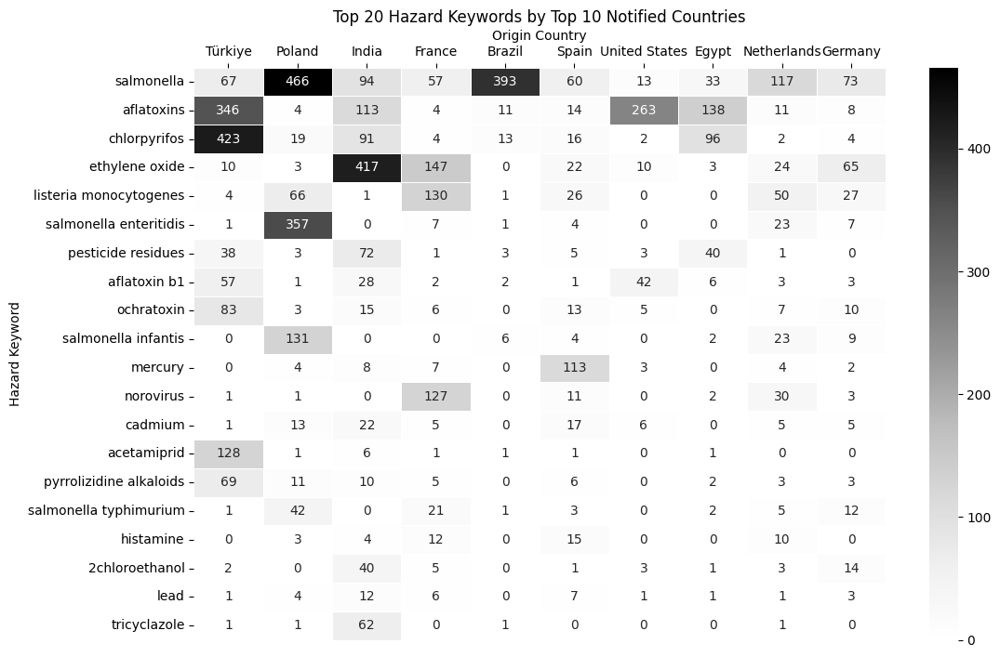

In [62]:
# Step 1: Extract top 20 keywords from keyword_counts_sfa
top_20_keywords = keyword_counts_sfa.index.tolist()

# Step 2: Filter DataFrame to include only rows with the top 20 keywords
filtered_df = filtered_df[filtered_df['Aggregated Keywords'].apply(lambda x: any(keyword in top_20_keywords for keyword in x))]

# Step 3: Determine the top 10 notified origin countries
top_countries = filtered_df['Origin Country'].value_counts().head(10).index.tolist()

# Step 4: Create a pivot table
pivot_table = filtered_df.explode('Aggregated Keywords').pivot_table(
    index='Aggregated Keywords', 
    columns='Origin Country', 
    aggfunc='size', 
    fill_value=0
)

# Step 5: Filter the pivot table to include only the top 20 keywords and top 10 countries
pivot_table = pivot_table.loc[top_20_keywords, top_countries]

# Step 6: Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap="Greys", annot=True, fmt="d", linewidths=.5)
plt.title('Top 20 Hazard Keywords by Top 10 Notified Countries')
plt.xlabel('Origin Country')
plt.ylabel('Hazard Keyword')

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')

plt.show()

#### Percentages of the occurances by the top 10 countries

In [63]:
# Define the keywords and countries to check
keywords_to_check = top_20_keywords  # This is your list of top 20 keywords
countries_to_check = top_countries   # This is your list of top 10 countries

# Loop through each keyword and country to check the consistency
for keyword in keywords_to_check:
    for country in countries_to_check:
        # Filter the DataFrame for the current keyword and country
        keyword_country_count = filtered_df[
            (filtered_df['Aggregated Keywords'].apply(lambda x: keyword in x)) &
            (filtered_df['Origin Country'] == country)
        ].shape[0]

        # Get the total count of the keyword in the entire filtered DataFrame
        total_keyword_count = filtered_df[
            filtered_df['Aggregated Keywords'].apply(lambda x: keyword in x)
        ].shape[0]

        # Calculate the percentage of occurrences related to the current country
        if total_keyword_count > 0:
            percentage = (keyword_country_count / total_keyword_count) * 100
        else:
            percentage = 0
        
        # Print the results for this keyword-country pair
        print(f"Keyword: '{keyword}', Country: '{country}'")
        print(f" - Total occurrences in this country: {keyword_country_count}")
        print(f" - Total occurrences overall: {total_keyword_count}")
        print(f" - Percentage related to this country: {percentage:.2f}%\n")

Keyword: 'salmonella', Country: 'Türkiye'
 - Total occurrences in this country: 63
 - Total occurrences overall: 1957
 - Percentage related to this country: 3.22%

Keyword: 'salmonella', Country: 'Poland'
 - Total occurrences in this country: 446
 - Total occurrences overall: 1957
 - Percentage related to this country: 22.79%

Keyword: 'salmonella', Country: 'India'
 - Total occurrences in this country: 89
 - Total occurrences overall: 1957
 - Percentage related to this country: 4.55%

Keyword: 'salmonella', Country: 'France'
 - Total occurrences in this country: 57
 - Total occurrences overall: 1957
 - Percentage related to this country: 2.91%

Keyword: 'salmonella', Country: 'Brazil'
 - Total occurrences in this country: 353
 - Total occurrences overall: 1957
 - Percentage related to this country: 18.04%

Keyword: 'salmonella', Country: 'Spain'
 - Total occurrences in this country: 55
 - Total occurrences overall: 1957
 - Percentage related to this country: 2.81%

Keyword: 'salmonell

### Which notificaton categories does the hazards fall into most?

#### Observations:

1. **High-Frequency Hazards:**
   - **Salmonella:** This hazard has a very high frequency in both **border rejection notifications (1,217)** and **alert notifications (593)**. This indicates that salmonella is a significant concern, often leading to immediate alerts and border rejections.
   - **Aflatoxins:** Similarly, aflatoxins show high frequencies in **border rejection notifications (1,217)** and **alert notifications (168)**, marking it as a critical food safety concern.
   - **Chlorpyrifos:** This pesticide shows a strong presence in **border rejection notifications (512)** and **alert notifications (195)**, indicating its frequent detection at borders.
   - **Ethylene Oxide:** This chemical is heavily represented in **alert notifications (661)**, reflecting its significant risk in food safety.

2. **Notification Distribution:**
   - **Salmonella Enteritidis** and **Listeria Monocytogenes** are notable for having high counts in **information notifications for follow-up** (227 and 128, respectively). This suggests ongoing concerns that require further investigation or action after the initial notification.
   - **Acetamiprid** and **Pesticide Residues** show high frequencies in **border rejection notifications** (151 and 224, respectively), indicating frequent regulatory non-compliance at borders.
   - **Mercury** and **Cadmium** have notable frequencies across several notification classifications, including **alert notifications, border rejections,** and **information notifications,** reflecting concerns about heavy metal contamination.

3. **Less Frequent Hazards:**
   - **Tricyclazole, Acetamiprid,** and **Pyrrolizidine Alkaloids** are less frequently reported across all classifications, but they still appear under **border rejection notifications** and **information notifications** for some cases.
   - **Lead** and **2-Chloroethanol** are more spread out across different notification types, indicating occasional detection but not at critical levels.

#### Derivations:

1. **Risk Management Focus:**
   - The heatmap suggests that **Salmonella, Aflatoxins, Chlorpyrifos,** and **Ethylene Oxide** are primary concerns that should be prioritized in risk management strategies, given their high frequency across multiple notification types.
   - Border rejections due to **pesticides** and **chemical residues** indicate a need for stricter control and monitoring at points of entry, as these contaminants are often detected during import inspections.

2. **Regulatory Implications:**
   - The high frequency of certain hazards in border rejections highlights the importance of reinforcing regulations and conducting thorough inspections at borders, especially for products from regions with known issues.
   - The consistent presence of heavy metals like **Mercury** and **Cadmium** in food products suggests that these areas might require more stringent monitoring and regulatory enforcement.

3. **Further Investigation:**
   - The presence of **information notifications for follow-up** for hazards like **Listeria Monocytogenes** and **Salmonella Enteritidis** suggests that these issues often require additional actions post-notification, potentially indicating complex or persistent problems.
   - **Ethylene Oxide**'s significant representation in alert notifications might warrant further investigation into its sources and methods for controlling its presence in food products.

#### Conclusion:

This heatmap emphasizes the critical need for targeted interventions in food safety, particularly focusing on high-frequency hazards like **Salmonella, Aflatoxins,** and **Chlorpyrifos.** These issues not only lead to immediate alerts and border rejections but also pose ongoing challenges that require continuous monitoring and follow-up actions. Regulatory bodies should prioritize these hazards in their food safety protocols to mitigate risks and ensure compliance with international standards.


C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\1228133909.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



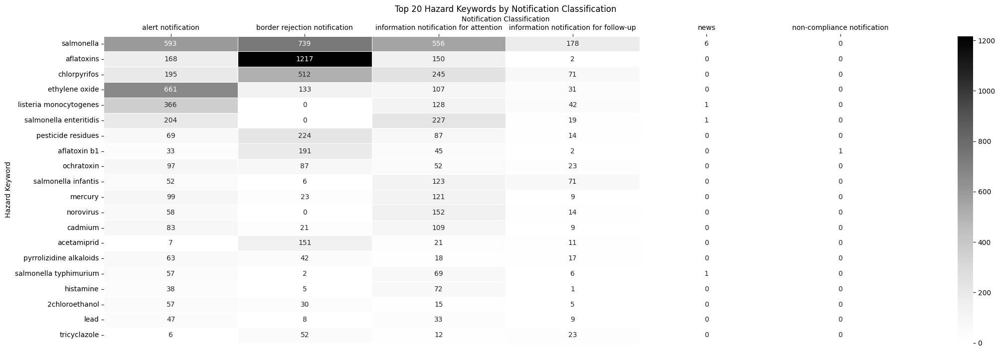

In [64]:
# Group by notification classification and keyword, and count occurrences
classification_keyword_distribution = filtered_df.explode('Aggregated Keywords').groupby(['Aggregated Keywords', 'Notification Classification']).size().unstack().fillna(0)

# Filter the pivot table to include only the top 20 keywords
classification_keyword_distribution = classification_keyword_distribution.loc[top_20_keywords]

# Plot the heatmap for Notification Classification vs. Keywords
plt.figure(figsize=(26, 8))
sns.heatmap(classification_keyword_distribution, cmap="Greys", annot=True, fmt="d", linewidths=.5)
plt.title('Top 20 Hazard Keywords by Notification Classification')
plt.xlabel('Notification Classification')
plt.ylabel('Hazard Keyword')

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.xticks(rotation=0)

plt.show()

### Hazard keywords by Risk Decision

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\1555729353.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



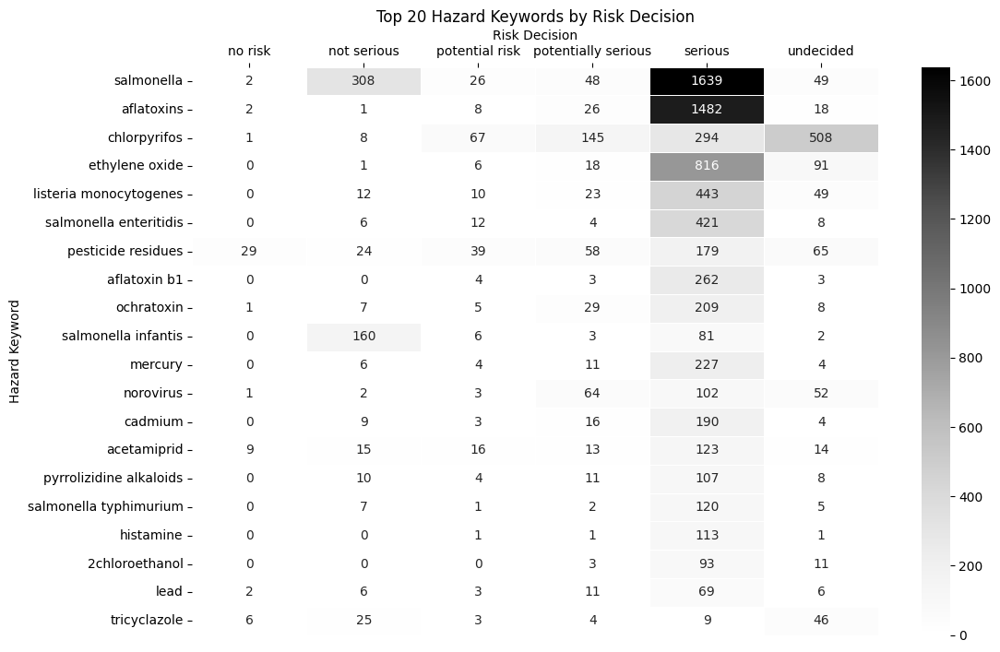

In [65]:
# Group by risk decision and keyword, and count occurrences
risk_decision_keyword_distribution = filtered_df.explode('Aggregated Keywords').groupby(['Aggregated Keywords', 'Risk Decision']).size().unstack().fillna(0)

# Filter the pivot table to include only the top 20 keywords
risk_decision_keyword_distribution = risk_decision_keyword_distribution.loc[top_20_keywords]

# Plot the heatmap for Risk Decision vs. Keywords
plt.figure(figsize=(12, 8))
sns.heatmap(risk_decision_keyword_distribution, cmap="Greys", annot=True, fmt="d", linewidths=.5)
plt.title('Top 20 Hazard Keywords by Risk Decision')
plt.xlabel('Risk Decision')
plt.ylabel('Hazard Keyword')

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.xticks(rotation=0)

plt.show()

### Hazards and their most matched product categories 

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\3623375480.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



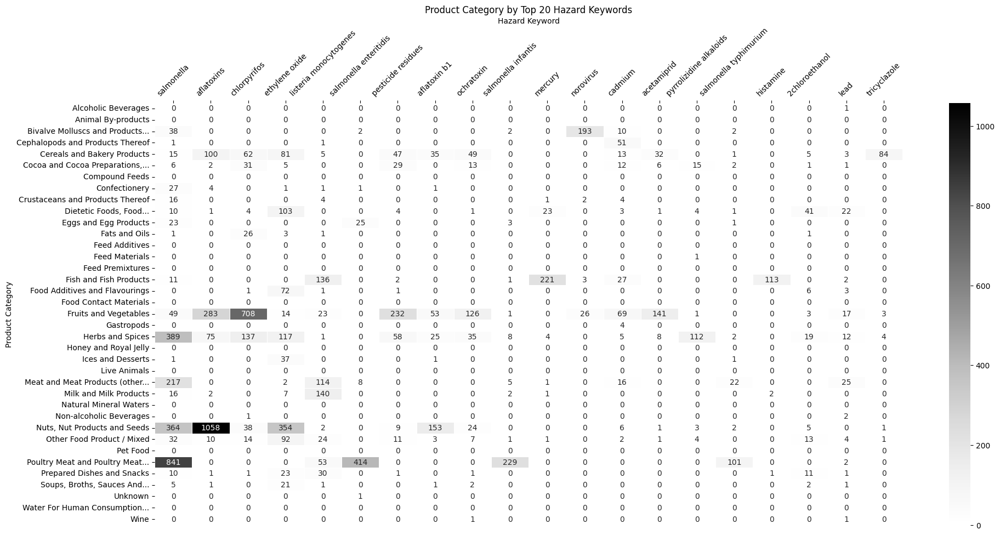

In [66]:
product_category_keyword_distribution = filtered_df.explode('Aggregated Keywords').groupby(['Product Category', 'Aggregated Keywords']).size().unstack().fillna(0)

# Filter the pivot table to include only the top 20 keywords (now as columns)
product_category_keyword_distribution = product_category_keyword_distribution[top_20_keywords]

# Plot the heatmap for Product Category vs. Keywords with horizontal labels
plt.figure(figsize=(22, 10))  # Adjust the figure size if needed
sns.heatmap(product_category_keyword_distribution, cmap="Greys", annot=True, fmt="d", linewidths=.5)
plt.title('Product Category by Top 20 Hazard Keywords')
plt.xlabel('Hazard Keyword')
plt.ylabel('Product Category')


plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.xticks(rotation=45)

plt.show()

## Where does the Turke... *Türkiye fit in?

In [67]:
custom_palette_grayscale = {
    'no risk': '#d3d3d3',  # Light gray
    'not serious': '#a9a9a9',  # Medium gray
    'potential risk': '#808080',  # Darker gray
    'potentially serious': '#696969',  # Even darker gray
    'serious': '#000000',  # Black
    'undecided': '#b0b0b0'  # Slightly darker gray than 'no risk', but lighter than 'serious'
}

custom_palette_lblue = {
    'no risk': '#b3cde0',          # Light blue
    'undecided': '#6497b1',        # Medium blue
    'not serious': '#005b96',      # Dark blue
    'potential risk': '#03396c',   # Very dark blue
    'potentially serious': '#011f4b',  # Almost black blue
    'serious': '#000000',          # Black
}

custom_palette_red = {
    'no risk': '#ffb3b3',          # Light red
    'undecided': '#ff6666',        # Medium red
    'not serious': '#ff1a1a',      # Dark red
    'potential risk': '#b30000',   # Very dark red
    'potentially serious': '#800000',  # Almost black red
    'serious': '#4d0000',          # Darkest red
}

custom_palette2_red = {
    'news': '#ffb3b3',          # Light red
    'non-compliance notification': '#ff6666',        # Medium red
    'information notification for attention': '#ff1a1a',      # Dark red
    'information notification for follow-up': '#b30000',   # Very dark red
    'alert notification': '#800000',  # Almost black red
    'border rejection notification': '#4d0000',          # Darkest red
}

ordered_columns_risk = ['no risk',
     'undecided',
     'not serious',
    'potential risk',
     'potentially serious',
    'serious']

ordered_columns_notif = ['border rejection notification',
    'alert notification',
    'information notification for follow-up',
    'information notification for attention',
    'non-compliance notification',
    'news']

### **1.Where does Türkiye stand in risk decisions among top 10 most notified countries?**

Turkey ranks first by a wide margin among other countries, both in the notification ranking and in the serious risk classification. It is worth noting that Turkey ranks 6th in Europe's total agri-food imports. We also observe that some countries that made it into the top 10 in the import rankings are not seen in this table. This situation suggests that the products exported by Turkey may have a higher potential to pose a risk. It has become necessary to test whether this assumption holds true in further analyses.

In [68]:
import matplotlib.patches as mpatches

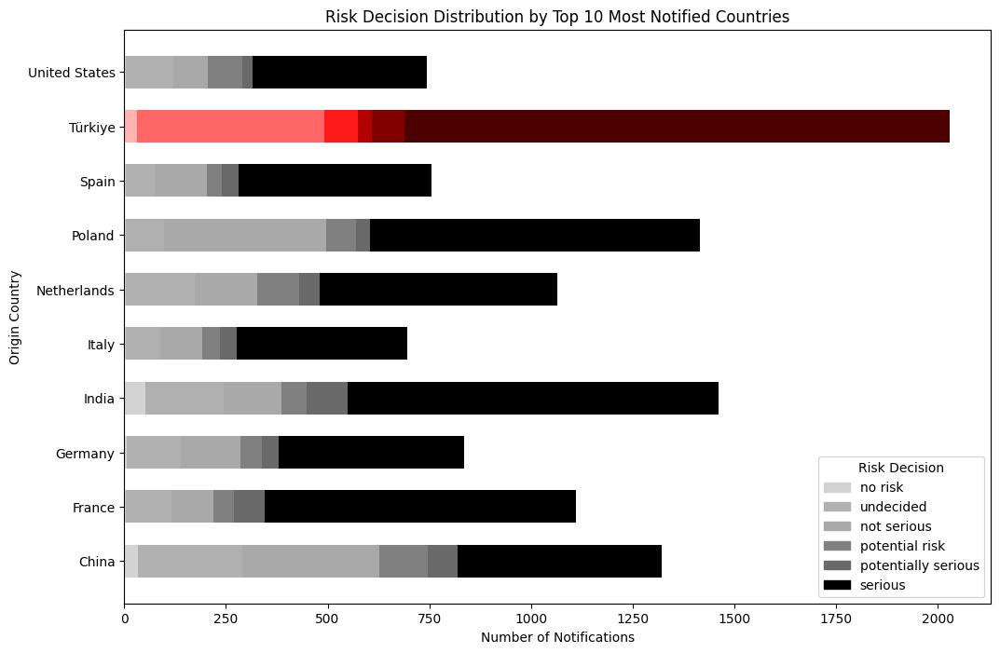

In [69]:
top_10_countries = df['Origin Country'].value_counts().head(10).index
filtered_df = df[df['Origin Country'].isin(top_10_countries)]

pivot_data = pd.crosstab(index=filtered_df['Origin Country'], 
                         columns=filtered_df['Risk Decision'])

plot_df = pivot_data.copy()

# Create a custom color column based on whether the country is Türkiye
plot_df['color'] = plot_df.index.map(lambda x: [custom_palette_red[col] if x == 'Türkiye' else custom_palette_grayscale[col] for col in ordered_columns_risk])

fig, ax = plt.subplots(figsize=(12, 8))

# Iterate over each row (country)
for country in plot_df.index:
    # Calculate cumulative positions for stacking
    rights = plot_df.loc[country, ordered_columns_risk].cumsum()
    lefts = rights.shift(fill_value=0)
    
    # Plot each bar segment with its corresponding color
    ax.barh(country, plot_df.loc[country, ordered_columns_risk], left=lefts, 
            color=plot_df.loc[country, 'color'],height=0.6) 


ax.set_xlim(0, pivot_data.sum(axis=1).max() * 1.05)

# Add title and labels
plt.title("Risk Decision Distribution by Top 10 Most Notified Countries")
plt.xlabel("Number of Notifications")
plt.ylabel("Origin Country")
legend_handles_risk = [mpatches.Patch(color=custom_palette_grayscale[col], label=col) for col in ordered_columns_risk]
plt.legend(handles=legend_handles_risk, title='Risk Decision')


# Display the plot with the default legend
plt.show()

#### Contingency and  z-test for the distribution including all countries: risk decision
- **Türkiye** shows a significant difference in the risk decision distribution compared to other countries.
- When compared to the rest of the top 9 countries on the top 10 list, **Türkiye** also displays a significant difference.
- In pairwise z-tests:
  - **Türkiye** shows a significant difference in the proportion of serious risk labels, except when compared to **France** and **Spain**.

In [70]:
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest

In [71]:
full_pivot_data_risk = pd.crosstab(index=df['Origin Country'], columns=df['Risk Decision'])

# Create a contingency table
turkey_data = full_pivot_data_risk.loc['Türkiye']  # Data for Turkey
other_countries_data = full_pivot_data_risk.drop('Türkiye').sum()  # Sum data for all other countries

# Combine into a contingency table
contingency_table = pd.DataFrame({
    'Türkiye': turkey_data,
    'Other Countries': other_countries_data
})

# Display the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table.T)

# Print the results
print(f"\nChi-Square Statistic: {chi2}")
print(f"p-value: {p}")

# Interpretation
if p < 0.05:
    print("There is a significant difference in the risk decision distribution for Turkey compared to other countries.")
else:
    print("There is no significant difference in the risk decision distribution for Turkey compared to other countries.")

Contingency Table:
                     Türkiye  Other Countries
Risk Decision                                
no risk                   31              274
not serious               83             3069
potential risk            35             1373
potentially serious       81             1037
serious                 1339            10060
undecided                460             2454

Chi-Square Statistic: 434.9751207282793
p-value: 8.547909805790201e-92
There is a significant difference in the risk decision distribution for Turkey compared to other countries.


In [72]:
serious_df = df[df['Risk Decision'] == 'serious']
# Create a pivot table for the filtered data
serious_pivot_data = pd.crosstab(index=serious_df['Origin Country'], columns=serious_df['Risk Decision'])

# Create a contingency table
turkey_serious_data = serious_pivot_data.loc['Türkiye']  # Serious risk data for Turkey
other_countries_serious_data = serious_pivot_data.drop('Türkiye').sum()  # Sum of serious risks for all other countries

# Calculate the proportions
total_turkey = turkey_serious_data.sum()  # Total serious labels for Turkey
total_other = other_countries_serious_data.sum()  # Total serious labels for other countries

total_notifications_turkey = df[df['Origin Country'] == 'Türkiye'].shape[0]
total_notifications_other = df[df['Origin Country'] != 'Türkiye'].shape[0]

prop_turkey = total_turkey / total_notifications_turkey
prop_other = total_other / total_notifications_other

print(f"Proportion of Serious Labels for Turkey: {prop_turkey}")
print(f"Proportion of Serious Labels for Other Countries: {prop_other}")

Proportion of Serious Labels for Turkey: 0.6599310004928536
Proportion of Serious Labels for Other Countries: 0.5507198773745005


In [73]:
# Calculate the serious risk proportions for Turkey and other top 9 countries combined
top_10_countries = df['Origin Country'].value_counts().head(10).index
filtered_df = df[df['Origin Country'].isin(top_10_countries)]
serious_df_top10 = filtered_df[filtered_df['Risk Decision'] == 'serious']

# Proportion for Turkey
total_turkey_serious = serious_df_top10[serious_df_top10['Origin Country'] == 'Türkiye'].shape[0]
total_turkey_notifications = filtered_df[filtered_df['Origin Country'] == 'Türkiye'].shape[0]

# Proportion for other top 9 countries
total_others_serious = serious_df_top10[serious_df_top10['Origin Country'] != 'Türkiye'].shape[0]
total_others_notifications = filtered_df[filtered_df['Origin Country'] != 'Türkiye'].shape[0]

# Perform the Z-test
counts = np.array([total_turkey_serious, total_others_serious])
nobs = np.array([total_turkey_notifications, total_others_notifications])

zstat, pval = proportions_ztest(counts, nobs)

# Print the results
print(f"Z-Statistic: {zstat}")
print(f"p-value: {pval}")

if pval < 0.05:
    print("There is a significant difference in the proportion of serious risk labels for Turkey compared to the other top 9 countries.")
else:
    print("There is no significant difference in the proportion of serious risk labels for Turkey compared to the other top 9 countries.")

Z-Statistic: 7.542165637935197
p-value: 4.622301104667576e-14
There is a significant difference in the proportion of serious risk labels for Turkey compared to the other top 9 countries.


In [74]:
# Perform pairwise Z-tests between Turkey and each of the other top 9 countries
for country in top_10_countries:
    if country != 'Türkiye':
        country_serious = serious_df_top10[serious_df_top10['Origin Country'] == country].shape[0]
        country_total = filtered_df[filtered_df['Origin Country'] == country].shape[0]
        
        # Perform Z-test
        counts = np.array([total_turkey_serious, country_serious])
        nobs = np.array([total_turkey_notifications, country_total])
        
        zstat, pval = proportions_ztest(counts, nobs)
        
        print(f"\nComparison: Turkey vs. {country}")
        print(f"Z-Statistic: {zstat}")
        print(f"p-value: {pval}")
        
        if pval < 0.05:
            print(f"There is a significant difference in the proportion of serious risk labels between Turkey and {country}.")
        else:
            print(f"There is no significant difference in the proportion of serious risk labels between Turkey and {country}.")


Comparison: Turkey vs. India
Z-Statistic: 2.215669076008472
p-value: 0.026714174264675466
There is a significant difference in the proportion of serious risk labels between Turkey and India.

Comparison: Turkey vs. Poland
Z-Statistic: 5.198574203961613
p-value: 2.008229556183696e-07
There is a significant difference in the proportion of serious risk labels between Turkey and Poland.

Comparison: Turkey vs. China
Z-Statistic: 15.8910943385676
p-value: 7.304122725392023e-57
There is a significant difference in the proportion of serious risk labels between Turkey and China.

Comparison: Turkey vs. France
Z-Statistic: -1.6153377686417898
p-value: 0.10623756882934056
There is no significant difference in the proportion of serious risk labels between Turkey and France.

Comparison: Turkey vs. Netherlands
Z-Statistic: 6.10041699635255
p-value: 1.05792107772646e-09
There is a significant difference in the proportion of serious risk labels between Turkey and Netherlands.

Comparison: Turkey vs

### **2.Where does Türkiye stand in rejections among top 10 most notified non-eu countries?**

It is observed that the number of border rejections for Turkey's products is also by far the highest. In this case, it would be more appropriate to compare with top countries outside the European Union, as border rejection notifications naturally do not occur in intra-EU trade.

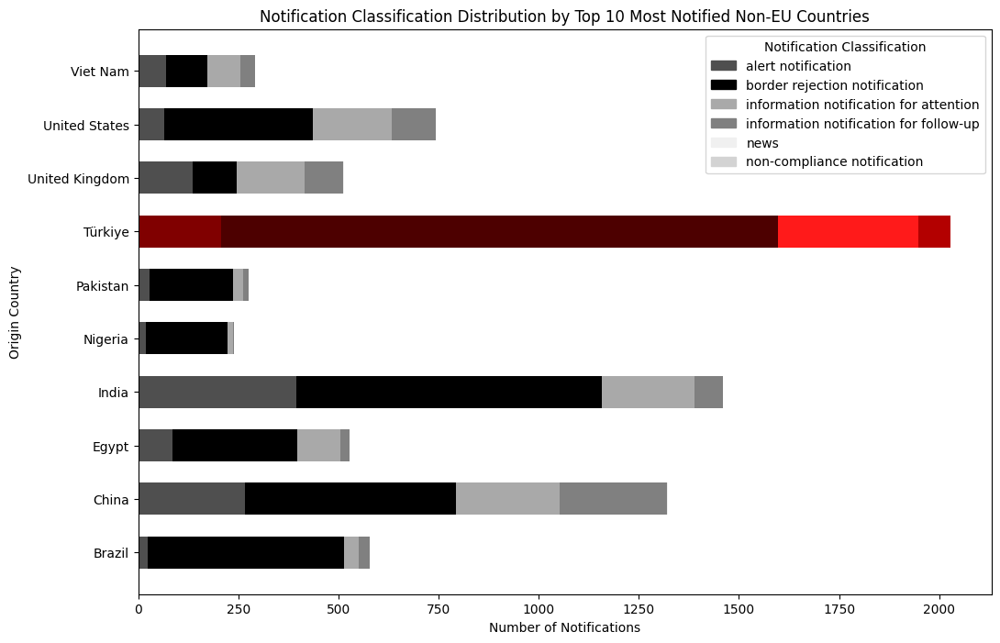

In [75]:
top10_non_eu = ['Türkiye','India','China','United States','Brazil','Egypt','United Kingdom','Viet Nam','Pakistan','Nigeria']
filtered_df_non_eu = df[df['Origin Country'].isin(top10_non_eu)]

# Create a pivot table
pivot_data = pd.crosstab(index=filtered_df_non_eu['Origin Country'], 
                         columns=filtered_df_non_eu['Notification Classification'])

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Iterate over each row (country)
for country in pivot_data.index:
    # Calculate cumulative positions for stacking
    rights = pivot_data.loc[country].cumsum()
    lefts = rights.shift(fill_value=0)
    
    # Determine the color scheme
    if country == 'Türkiye':
        colors = [custom_palette2_red[col] for col in pivot_data.columns]
    else:
        colors = [custom_palette2[col] for col in pivot_data.columns]
    
    # Plot each bar segment with its corresponding color
    ax.barh(country, pivot_data.loc[country], left=lefts, color=colors, height=0.6)

ax.set_xlim(0, pivot_data.sum(axis=1).max() * 1.05)

# Add title and labels
plt.title("Notification Classification Distribution by Top 10 Most Notified Non-EU Countries")
plt.xlabel("Number of Notifications")
plt.ylabel("Origin Country")

# Manually create the legend handles using the grayscale palette
legend_handles_notif = [mpatches.Patch(color=custom_palette2[col], label=col) for col in pivot_data.columns]

# Add the custom legend
plt.legend(handles=legend_handles_notif, title="Notification Classification")

# Show the plot
plt.show()

#### Contingency and  z-test for the distribution including all countries: notification classification
- **Türkiye** shows significant difference in the Notification Classification distribution compared to other countries.
- **Türkiye** shows significant differences in the proportion of border rejection notifications between each top 10 non eu pairs.

In [76]:
# Create a pivot table for the Notification Classification category
notification_pivot_data = pd.crosstab(index=df['Origin Country'], columns=df['Notification Classification'])

# Create a contingency table
turkey_notification_data = notification_pivot_data.loc['Türkiye']  # Notification classification data for Turkey
other_countries_notification_data = notification_pivot_data.drop('Türkiye').sum()  # Sum data for all other countries

# Combine into a contingency table
contingency_table_notification = pd.DataFrame({
    'Turkey': turkey_notification_data,
    'Other Countries': other_countries_notification_data
})

# Display the contingency table
print("Contingency Table for Notification Classification:")
print(contingency_table_notification)

Contingency Table for Notification Classification:
                                        Turkey  Other Countries
Notification Classification                                    
alert notification                         208             5762
border rejection notification             1389             5180
information notification for attention     350             4100
information notification for follow-up      82             3191
news                                         0               32
non-compliance notification                  0                2


In [77]:
# Perform the Chi-Square test
chi2_notification, p_notification, dof_notification, expected_notification = chi2_contingency(contingency_table_notification.T)

# Print the results
print(f"\nChi-Square Statistic for Notification Classification: {chi2_notification}")
print(f"p-value for Notification Classification: {p_notification}")

# Interpretation
if p_notification < 0.05:
    print("There is a significant difference in the Notification Classification distribution for Turkey compared to other countries.")
else:
    print("There is no significant difference in the Notification Classification distribution for Turkey compared to other countries.")


Chi-Square Statistic for Notification Classification: 1419.1532175267141
p-value for Notification Classification: 9.740355538243664e-305
There is a significant difference in the Notification Classification distribution for Turkey compared to other countries.


In [78]:
border_rejection_df_non_eu = filtered_df_non_eu[filtered_df_non_eu['Notification Classification'] == 'border rejection notification']

# Calculate the proportion for Turkey
turkey_border_rejection = border_rejection_df_non_eu[border_rejection_df_non_eu['Origin Country'] == 'Türkiye'].shape[0]
total_turkey_notifications_non_eu = filtered_df_non_eu[filtered_df_non_eu['Origin Country'] == 'Türkiye'].shape[0]

# Perform pairwise Z-tests between Turkey and each of the other top 9 non-EU countries
for country in top10_non_eu:
    if country != 'Türkiye':
        country_border_rejection = border_rejection_df_non_eu[border_rejection_df_non_eu['Origin Country'] == country].shape[0]
        country_total = filtered_df_non_eu[filtered_df_non_eu['Origin Country'] == country].shape[0]
        
        # Perform Z-test
        counts = np.array([turkey_border_rejection, country_border_rejection])
        nobs = np.array([total_turkey_notifications_non_eu, country_total])
        
        zstat, pval = proportions_ztest(counts, nobs)
        
        print(f"\nComparison: Turkey vs. {country}")
        print(f"Z-Statistic: {zstat}")
        print(f"p-value: {pval}")
        
        if pval < 0.05:
            print(f"There is a significant difference in the proportion of border rejection notifications between Turkey and {country}.")
        else:
            print(f"There is no significant difference in the proportion of border rejection notifications between Turkey and {country}.")


Comparison: Turkey vs. India
Z-Statistic: 9.730268298496599
p-value: 2.24001352866879e-22
There is a significant difference in the proportion of border rejection notifications between Turkey and India.

Comparison: Turkey vs. China
Z-Statistic: 16.390698153761083
p-value: 2.2287012726910522e-60
There is a significant difference in the proportion of border rejection notifications between Turkey and China.

Comparison: Turkey vs. United States
Z-Statistic: 9.03625838300522
p-value: 1.6212617915231395e-19
There is a significant difference in the proportion of border rejection notifications between Turkey and United States.

Comparison: Turkey vs. Brazil
Z-Statistic: -7.799543341557261
p-value: 6.213159829902381e-15
There is a significant difference in the proportion of border rejection notifications between Turkey and Brazil.

Comparison: Turkey vs. Egypt
Z-Statistic: 3.9816614241231334
p-value: 6.843521860991224e-05
There is a significant difference in the proportion of border rejection

### **3.Which product categories from Türkiye notified by the officials most?**

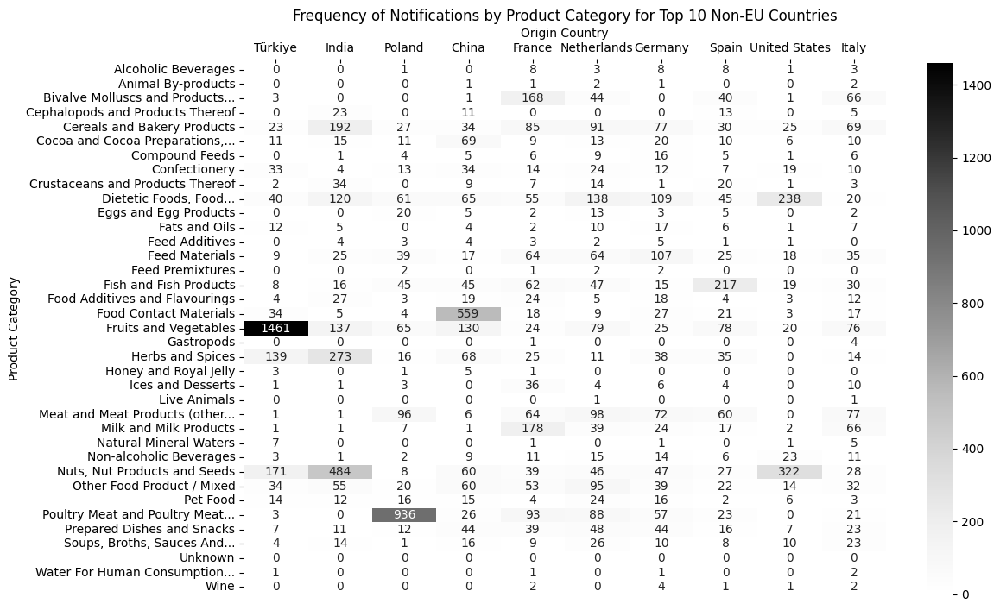

In [79]:
# Create a pivot table for the Product Category
product_pivot_data = pd.crosstab(index=df['Product Category'], columns=df['Origin Country'])

# Filter the pivot table to include only the top 10 countries
product_pivot_data_top10 = product_pivot_data[top_10_countries]

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(product_pivot_data_top10, cmap="Greys", annot=True, fmt="d")
plt.title("Frequency of Notifications by Product Category for Top 10 Non-EU Countries")
plt.xlabel("Origin Country")
plt.ylabel("Product Category")

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')

plt.show()

In [80]:
top_10_countries_list = top_10_countries.tolist()
# Aggregate the data by product category and country
category_counts = df.groupby(['Product Category', 'Origin Country']).size().unstack(fill_value=0)

# Sort the categories by total notifications
category_counts['Total'] = category_counts.sum(axis=1)
category_counts = category_counts.sort_values('Total', ascending=False)

# Plot the top 10 product categories
top_categories = category_counts.head(10).index
category_counts_top10 = category_counts.loc[top_categories, top_10_countries_list]

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\167662836.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### Proportion of notifications by product categories for top 10 countries

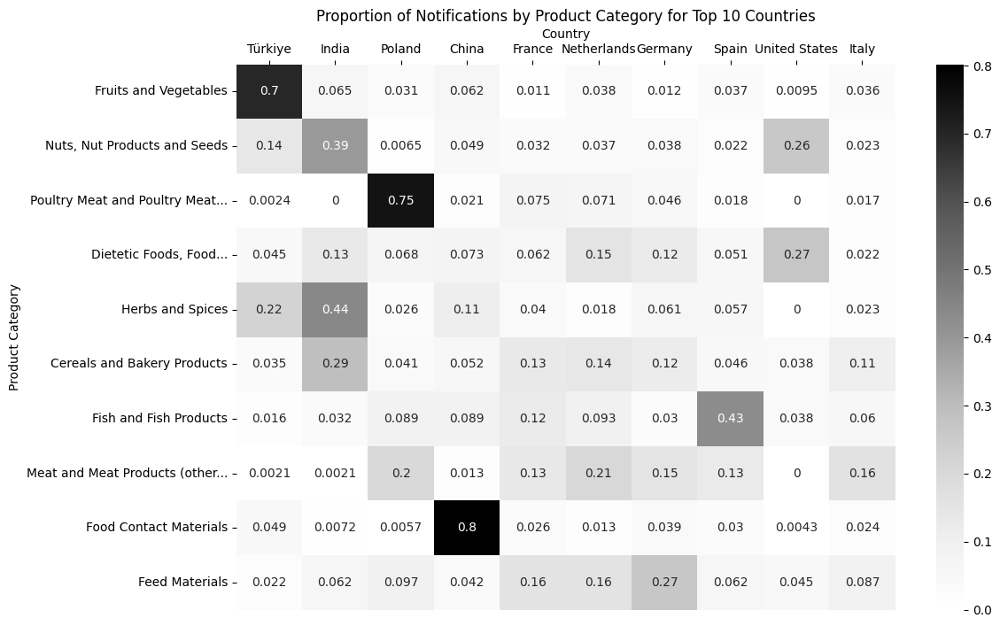

In [81]:
# Calculate the proportion of notifications for each product category
proportion_df = category_counts_top10.div(category_counts_top10.sum(axis=1), axis=0)

# Heatmap of Turkey's share of notifications
plt.figure(figsize=(12, 8))
sns.heatmap(proportion_df, annot=True, cmap='Greys')
plt.title("Proportion of Notifications by Product Category for Top 10 Countries")
plt.xlabel("Country")
plt.ylabel("Product Category")

plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')

plt.show()

### **4.How does Türkiye's seasonal decomposition of notification trends looks like?**
**Regarding the general notification trend:**
1. **Sharp Increase in Notifications:**  
  The data indicates a sharp increase in notifications starting around 2018, peaking in 2020. This may reflect changes in regulations, reporting practices, or actual increases in the underlying issues being reported.

2. **Stabilization Post-2020:**  
  After 2020, the trend stabilizes at a higher level, suggesting that the notification system or the issues it tracks have reached a new equilibrium.

3. **Consistent Seasonality:**  
  The seasonal patterns are consistent across the years, indicating that certain months or periods regularly experience higher or lower notifications, which could be tied to specific seasonal factors.

4. **Irregularities:**  
  The residual component shows that while the trend and seasonality explain most of the data, there were some irregularities, especially during the 2019-2020 period, that may warrant further investigation.

  --------------------------------------

**Regarding the notification trend among top 10:**
1. **Significant Fluctuations**:  
   Turkey's border rejection notifications have shown significant fluctuations, particularly around the 2019-2020 period, followed by a decline. This is more pronounced compared to most other countries.

2. **Strong Seasonal Component**:  
   Turkey has a clear seasonal pattern in its border rejection notifications, similar to other countries like India, China, and Vietnam, though the exact timing and amplitude of these patterns differ.

3. **Trend Reversal**:  
   While several countries show a steady or increasing trend, Turkey's trend peaked and then declined, which might indicate specific interventions or changes in circumstances that affected border rejections.

4. **Comparative Volatility**:  
   Turkey's data is more volatile with significant residuals, indicating the presence of factors that led to unexpected deviations from the trend and seasonality, more so than in some other countries like Brazil or Egypt.

--------------------------------------    

**Regarding the border rejection trend:**
1. **Significant Fluctuations**:  
   Turkey's border rejection notifications have shown significant fluctuations, particularly around the 2019-2020 period, followed by a decline. This is more pronounced compared to most other countries.

2. **Strong Seasonal Component**:  
   Turkey has a clear seasonal pattern in its border rejection notifications, similar to other countries like India, China, and Vietnam, though the exact timing and amplitude of these patterns differ.

3. **Trend Reversal**:  
   While several countries show a steady or increasing trend, Turkey's trend peaked and then declined, which might indicate specific interventions or changes in circumstances that affected border rejections.

4. **Comparative Volatility**:  
   Turkey's data is more volatile with significant residuals, indicating the presence of factors that led to unexpected deviations from the trend and seasonality, more so than in some other countries like Brazil or Egypt.

----------------------------------------------

#### Analysis of Other Countries' Trends:

1. **General Observation of Trends:**
   - Many of the other top 10 notified countries (both EU and non-EU) display similar patterns with noticeable peaks around late 2019 to mid-2020.
   - This timeframe coincides with the onset of the COVID-19 pandemic, which had widespread effects on global trade, supply chains, and regulatory practices.

2. **Comparative Analysis:**

   - **EU Countries (Top 10 Most Notified):**
     - Countries like **Poland, France, and Spain** show a significant increase in notifications around the same time as Turkey, specifically late 2019 to mid-2020.
     - This suggests that these countries, too, were likely affected by heightened scrutiny or supply chain disruptions due to the pandemic.

   - **Non-EU Countries (Top 10 Border Rejection Notifications):**
     - Countries like **India, Brazil, and the United States** also exhibit peaks during the same period. For example, India shows a clear upward trend in notifications starting around late 2019.
     - Similarly, **Brazil** and **Egypt** have trends that peak around this period, which could be attributed to global disruptions rather than internal, persistent issues.

3. **Hazard Distribution:**
   - The hazards linked to the peaks in other countries are similar to those seen in Turkey, such as **Salmonella, Aflatoxins, and Pesticide Residues**. This commonality across different countries further suggests that the spikes in notifications are not unique to Turkey but are instead part of a broader pattern.

**Conclusion:**

- **External Factor Hypothesis Validity:**
  - The hypothesis that external factors, particularly the COVID-19 pandemic, influenced the rise in notifications during late 2019 to mid-2020 holds true for other countries as well.
  - The similar timing of peaks in notifications across multiple countries indicates that these were likely driven by external global factors rather than issues isolated to any one country.

- **Persistent Problems vs. External Factors:**
  - While some countries, including Turkey, may have underlying persistent problems with certain hazards, the peaks observed around the late 2019 to mid-2020 period seem to be more reflective of global disruptions rather than intrinsic, ongoing issues within these countries.
  - This suggests that while some food safety challenges may be ongoing, the significant increases in notifications during this period were likely exacerbated by the pandemic and its impact on global trade and regulatory practices.


In [82]:
from statsmodels.tsa.seasonal import seasonal_decompose

#### **Seasonal decomposition of general notification trend**

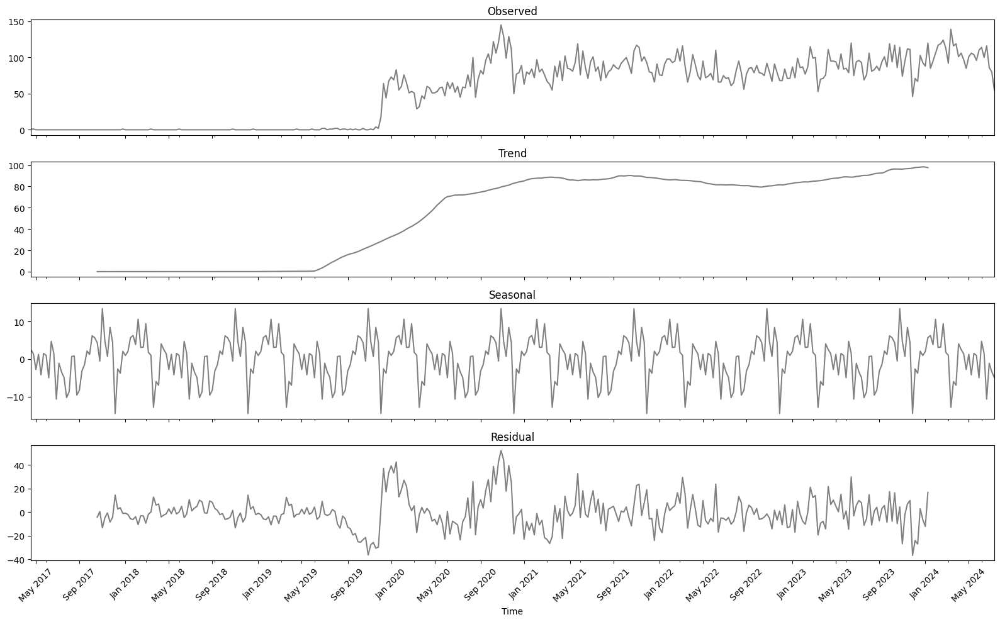

In [83]:
weekly_data = df.set_index('Validation Date').resample('W').size()

result_weekly = seasonal_decompose(weekly_data, model='additive', period=52)

fig, axes = plt.subplots(4, 1, figsize=(16, 10), sharex=True)

# Change the line color to grey
result_weekly.observed.plot(ax=axes[0], color='grey', title='Observed')
result_weekly.trend.plot(ax=axes[1], color='grey', title='Trend')
result_weekly.seasonal.plot(ax=axes[2], color='grey', title='Seasonal')
result_weekly.resid.plot(ax=axes[3], color='grey', title='Residual')

# Set the x-axis ticks to show some of the month names clearly
for ax in axes:
    ax.set_xlabel('Time')
    ax.set_xticks(pd.date_range(start=weekly_data.index.min(), 
                                end=weekly_data.index.max(), 
                                freq='4ME'))  # Every 3 months for clarity
    ax.set_xticklabels(pd.date_range(start=weekly_data.index.min(), 
                                     end=weekly_data.index.max(), 
                                     freq='4ME').strftime('%b %Y'), rotation=45)

plt.tight_layout()
plt.show()

#### **Seasonal decomposition comparison of top 10 countries notifications**

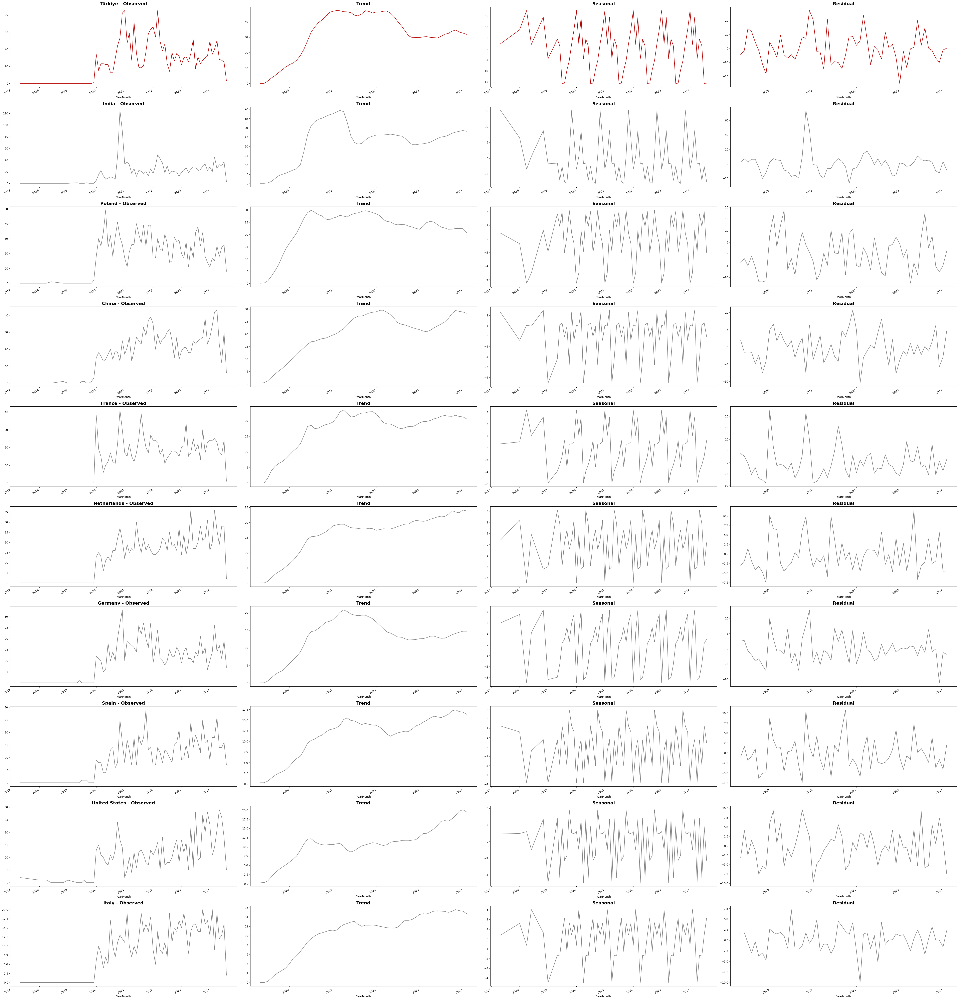

In [84]:
df['YearMonth'] = df['Validation Date'].dt.to_period('M').dt.to_timestamp()
notifications_by_month_country = df.groupby(['YearMonth', 'Origin Country']).size().unstack(fill_value=0)

top_10_data = notifications_by_month_country[top_10_countries_list]

top_10_countries = top_10_data.columns  

# Set up the grid for subplots with an elongated width
fig, axes = plt.subplots(len(top_10_countries), 4, figsize=(48, len(top_10_countries) * 5))

for i, country in enumerate(top_10_countries):
    country_data = top_10_data[country]
    
    # Perform seasonal decomposition
    result = seasonal_decompose(country_data, model='additive', period=12)
    
    # Determine color: red for Turkey, grey for others
    color = '#b30000' if country == 'Türkiye' else 'grey'
    
    # Plot each component in the appropriate subplot with the chosen color
    result.observed.plot(ax=axes[i, 0], color=color)
    axes[i, 0].set_title(f'{country} - Observed', fontsize=16, fontweight='bold')
    
    result.trend.plot(ax=axes[i, 1], color=color)
    axes[i, 1].set_title('Trend', fontsize=16, fontweight='bold')
    
    result.seasonal.plot(ax=axes[i, 2], color=color)
    axes[i, 2].set_title('Seasonal', fontsize=16, fontweight='bold')
    
    result.resid.plot(ax=axes[i, 3], color=color)
    axes[i, 3].set_title('Residual', fontsize=16, fontweight='bold')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

#### Border rejection trends across the top 10 non-eu countries



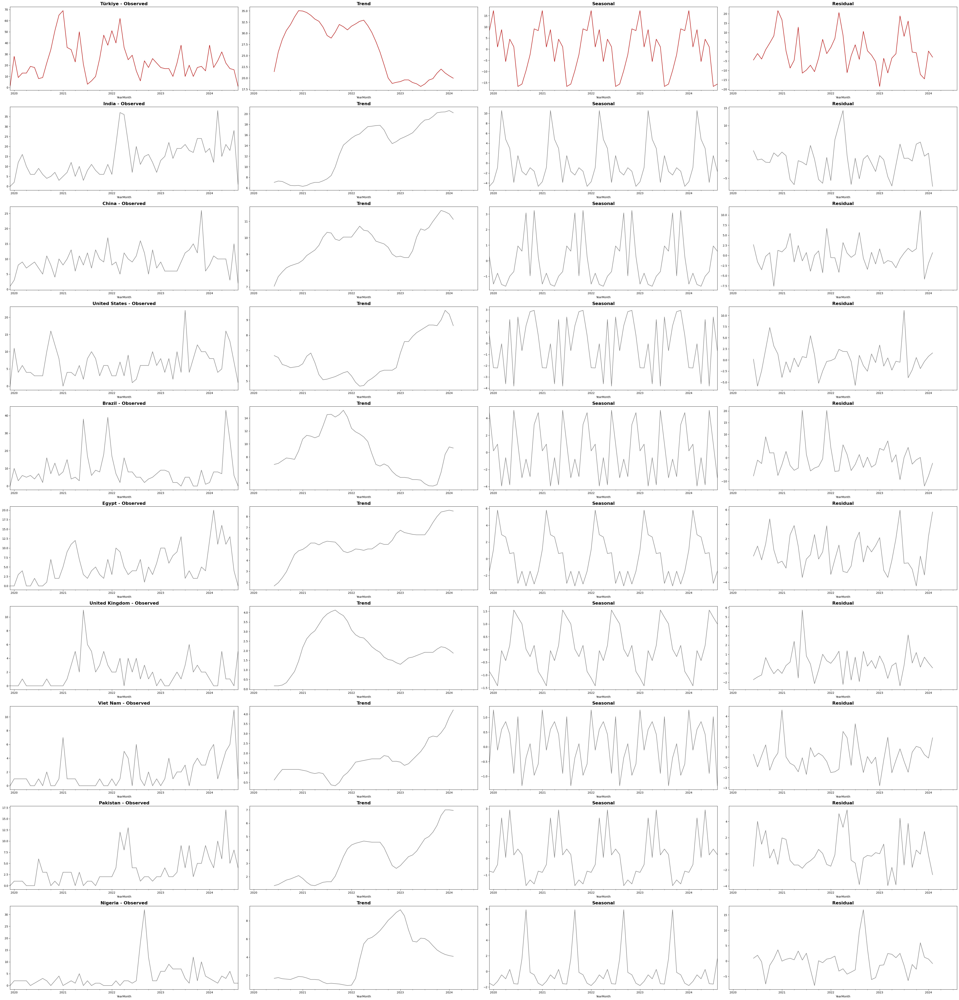

In [85]:
# Filter for Border Rejection notifications
border_rejection_df = df[df['Notification Classification'] == 'border rejection notification']

# Filter the DataFrame to only include the top 10 non-EU countries
border_rejection_df = border_rejection_df[border_rejection_df['Origin Country'].isin(top10_non_eu)]

# Group by 'Origin Country' and 'YearMonth', then unstack
monthly_grouped = border_rejection_df.groupby(['Origin Country', 'YearMonth']).size().unstack(fill_value=0)

# Perform seasonal decomposition and plot
top_10_countries = monthly_grouped.columns 

# Set up the grid for subplots with an elongated width
fig, axes = plt.subplots(len(top10_non_eu), 4, figsize=(48, len(top10_non_eu) * 5))

for i, country in enumerate(top10_non_eu):
    country_data = monthly_grouped.loc[country]
    
    # Perform seasonal decomposition
    result = seasonal_decompose(country_data, model='additive', period=12)
    
    # Determine color: red for Turkey, grey for others
    color = '#b30000' if country == 'Türkiye' else 'grey'
    
    # Plot each component in the appropriate subplot with the chosen color
    result.observed.plot(ax=axes[i, 0], color=color)
    axes[i, 0].set_title(f'{country} - Observed', fontsize=16, fontweight='bold')
    
    result.trend.plot(ax=axes[i, 1], color=color)
    axes[i, 1].set_title('Trend', fontsize=16, fontweight='bold')
    
    result.seasonal.plot(ax=axes[i, 2], color=color)
    axes[i, 2].set_title('Seasonal', fontsize=16, fontweight='bold')
    
    result.resid.plot(ax=axes[i, 3], color=color)
    axes[i, 3].set_title('Residual', fontsize=16, fontweight='bold')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

### **5.Which hazards are associated with Türkiye's rejected notifications?**

#### Rejected hazard categories

In [86]:
# Filter for border rejection notifications
reject_df = filtered_df_copy[(filtered_df_copy['Notification Classification'] == 'border rejection notification') & 
                                (filtered_df_copy['Origin Country'] == 'Türkiye')]

# Explode the 'Aggregated Keywords' column to flatten the lists
exploded_keywords_df = reject_df.explode('Aggregated Keywords')

# Filter the exploded DataFrame to only include rows where 'Aggregated Keywords' is in 'top_20_keywords'
filtered_keywords_df = exploded_keywords_df[exploded_keywords_df['Aggregated Keywords'].isin(top_20_keywords)]

# Count the most common keywords
serious_hazard_keywords = filtered_keywords_df['Aggregated Keywords'].value_counts().head(10)

print(serious_hazard_keywords)

Aggregated Keywords
chlorpyrifos               303
aflatoxins                 300
acetamiprid                111
aflatoxin b1                50
ochratoxin                  43
pyrrolizidine alkaloids     41
salmonella                  28
pesticide residues          28
Name: count, dtype: int64


#### Hazard categories of all notification kind

In [87]:
notification_df = filtered_df_copy[filtered_df_copy['Origin Country'] == 'Türkiye']

exploded_keywords_notif_df = notification_df.explode('Aggregated Keywords')

filtered_notification_words = exploded_keywords_notif_df[exploded_keywords_notif_df['Aggregated Keywords'].isin(top_20_keywords)]

notification_keywords = filtered_notification_words['Aggregated Keywords'].value_counts().head(10)

print(notification_keywords)

Aggregated Keywords
chlorpyrifos               423
aflatoxins                 346
acetamiprid                128
ochratoxin                  83
pyrrolizidine alkaloids     69
salmonella                  67
aflatoxin b1                57
pesticide residues          38
ethylene oxide              10
listeria monocytogenes       4
Name: count, dtype: int64


In [88]:
# Align the indices of both series to ensure the calculations are accurate
aligned_keywords = notification_keywords.align(serious_hazard_keywords, fill_value=0)

# Calculate the percentage of rejected occurrences for each keyword
percentage_rejected = (aligned_keywords[1] / aligned_keywords[0]) * 100

# Sort the results by the percentage of rejection
percentage_rejected_sorted = percentage_rejected.sort_values(ascending=False)

# Display the results
print("Keywords and their rejection percentages:")
print(percentage_rejected_sorted)

Keywords and their rejection percentages:
Aggregated Keywords
aflatoxin b1               87.719298
acetamiprid                86.718750
aflatoxins                 86.705202
pesticide residues         73.684211
chlorpyrifos               71.631206
pyrrolizidine alkaloids    59.420290
ochratoxin                 51.807229
salmonella                 41.791045
listeria monocytogenes      0.000000
ethylene oxide              0.000000
Name: count, dtype: float64


#### Which product names and hazards are associated?

Here is the table for the matched products sorted by frequency:

| Hazard                    | Product Name                                              |
|---------------------------|-----------------------------------------------------------|
| chlorpyrifos              | [lemon, pepper, grapefruit, mandarin, orange]             |
| aflatoxins                | [figs, pistachio]                                         |
| acetamiprid               | [pepper, pomegranate, grape]                              |
| ochratoxin                | [figs, mullberries, sultana]                              |
| pyrrolizidine alkaloids   | [oregano, cumin]                                          |
| salmonella                | [sesame, bay leaves, tahini, helva, pine nuts, pistachio] |
| aflatoxin b1              | [figs, pistachio]                                         |


In [89]:
kwords_for_turkey = ['chlorpyrifos','aflatoxins','acetamiprid','ochratoxin','pyrrolizidine alkaloids','salmonella','aflatoxin b1']

In [90]:
filtered_df_copy_tr = filtered_df_copy[filtered_df_copy['Origin Country'] == 'Türkiye']

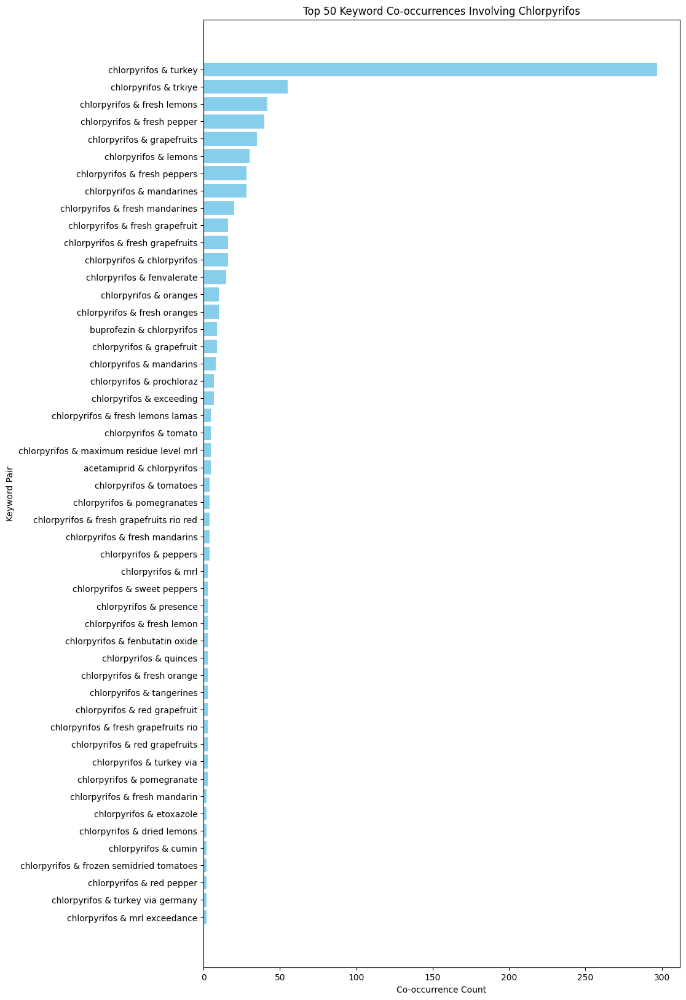

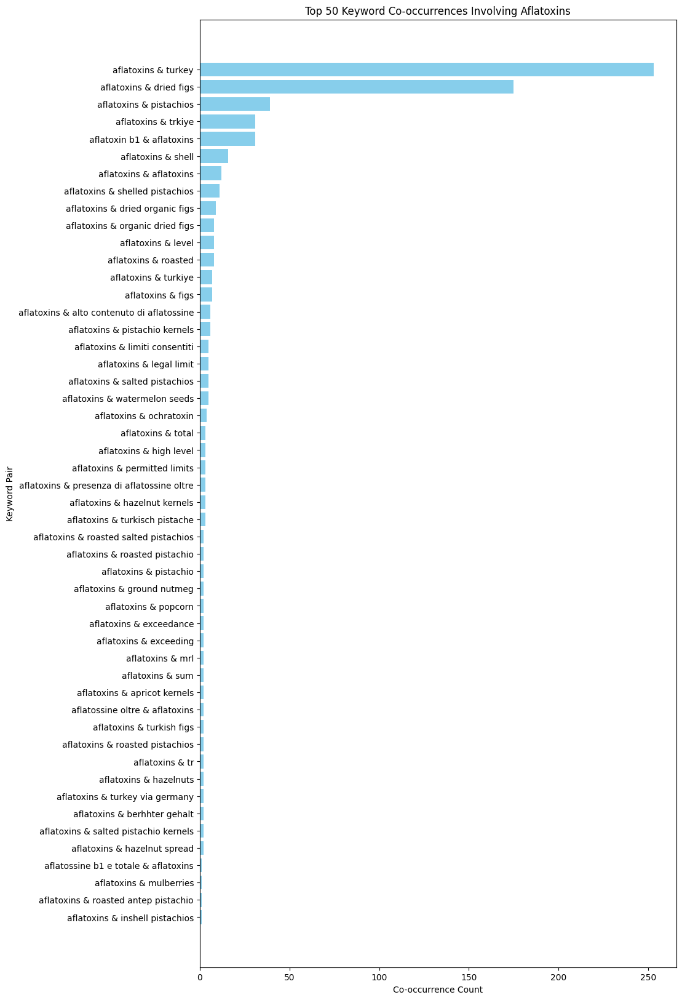

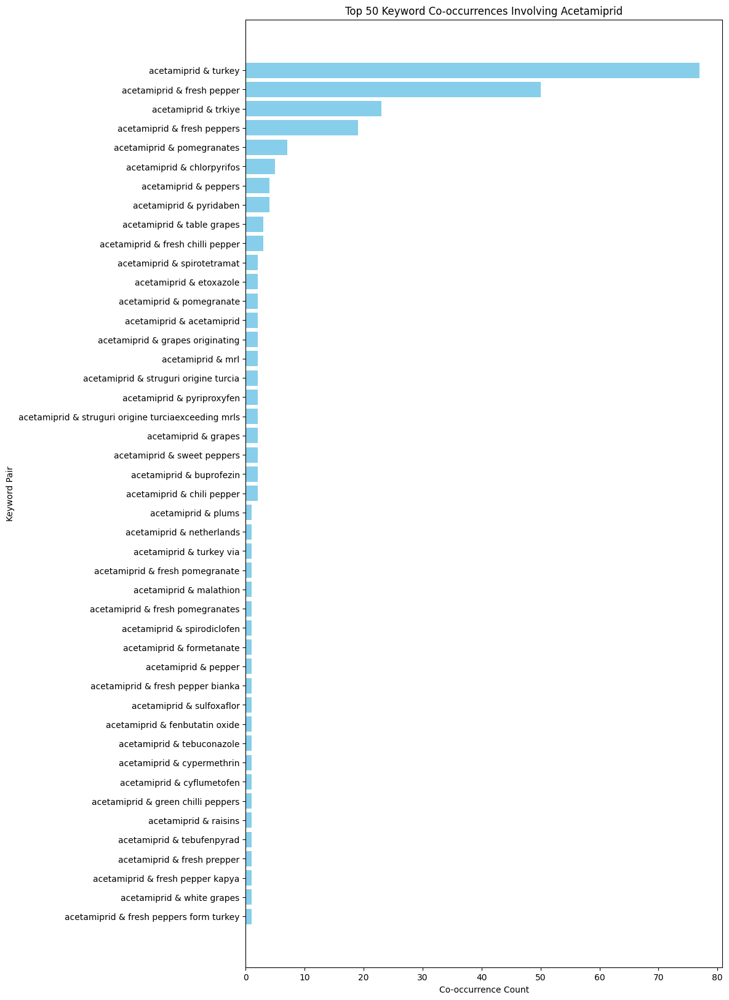

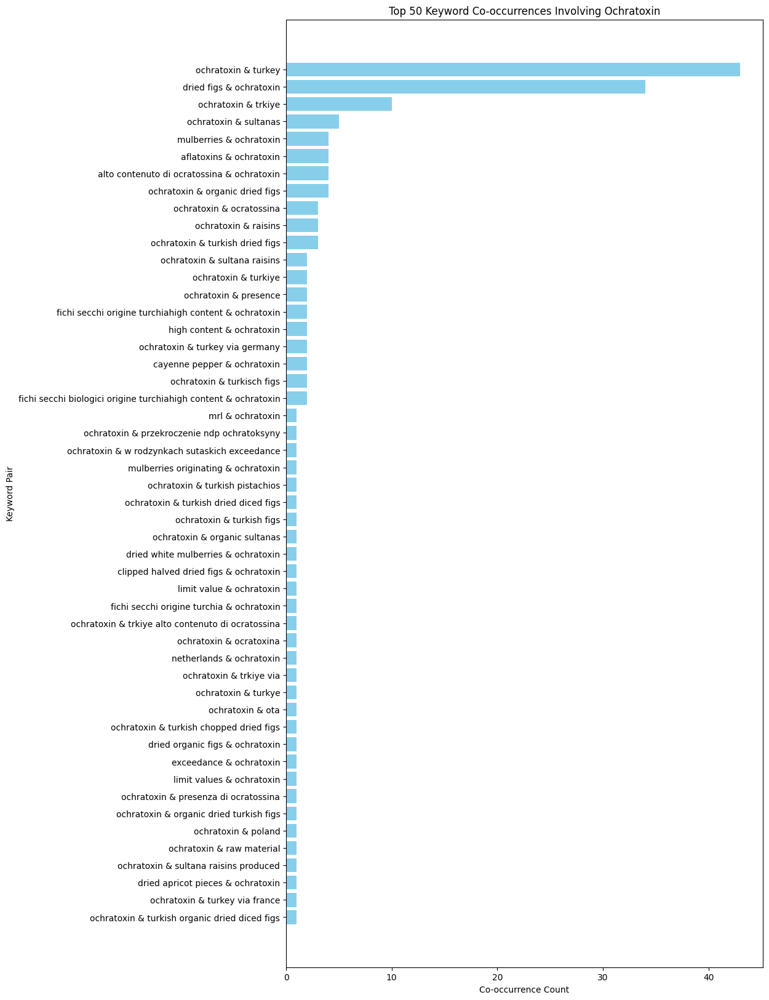

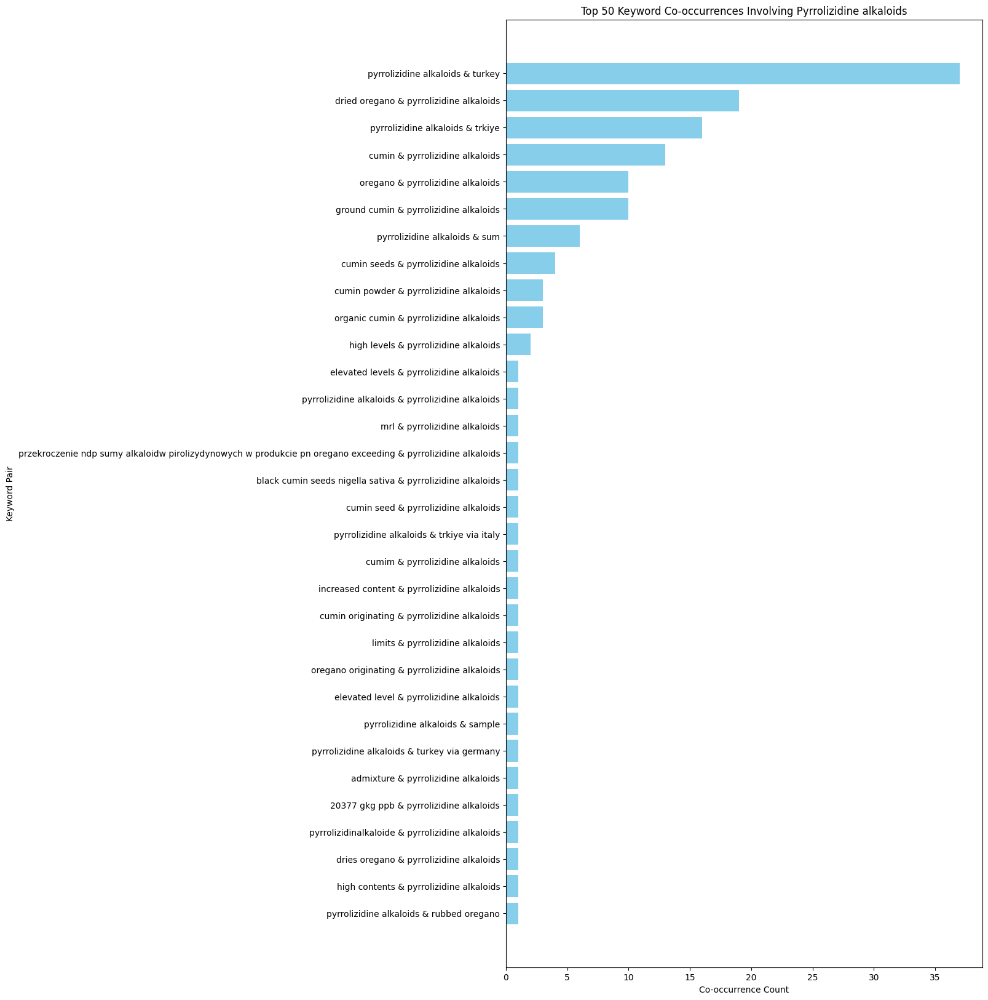

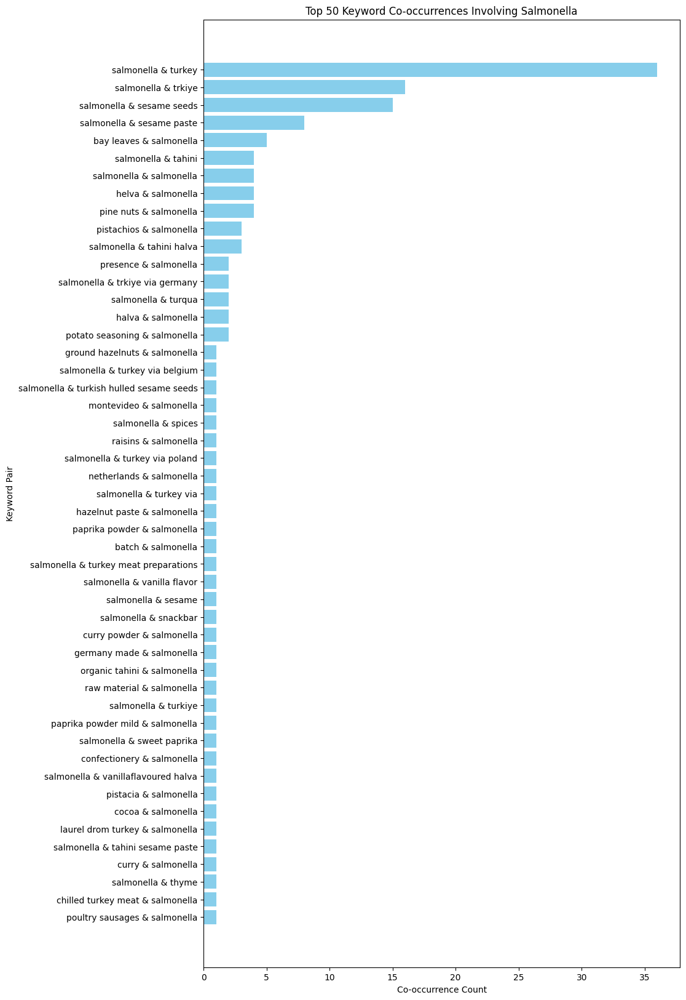

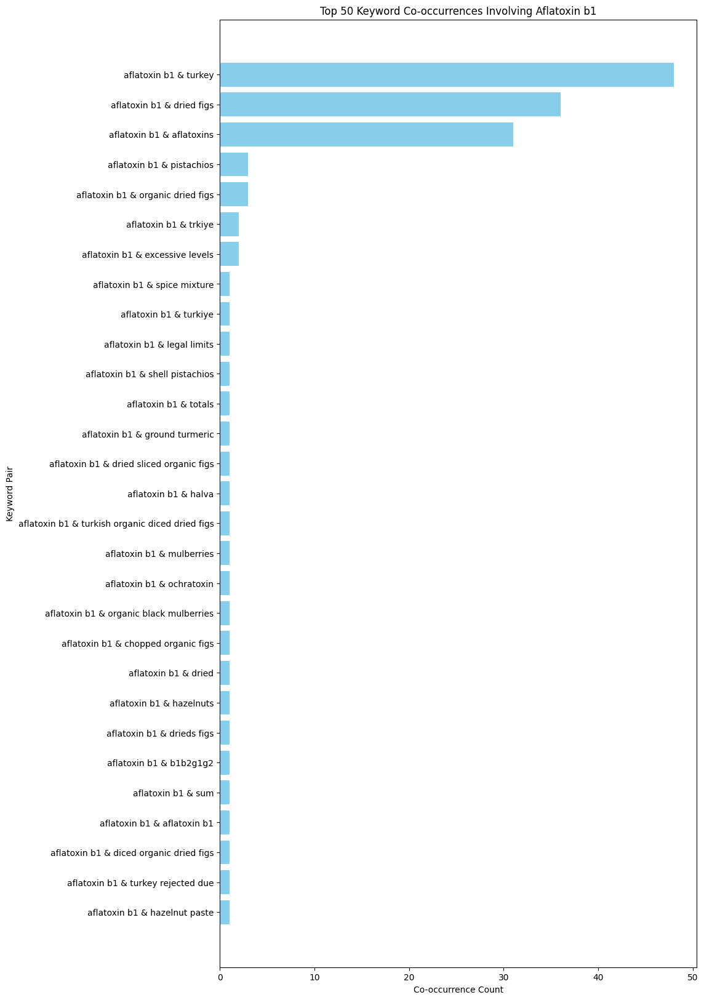

In [91]:
# Create a DataFrame of co-occurrences for each hazard keyword
for hazard in kwords_for_turkey:
    # Create a list of keyword combinations where the hazard is present
    keyword_combinations = [
        list(combinations(sorted(kw_list), 2)) 
        for kw_list in filtered_df_copy_tr['Aggregated Keywords'] 
        if any(term in kw_list for term in [hazard])
    ]
    
    # Flatten the list of co-occurrences and count them
    co_occurrence_counts = Counter([item for sublist in keyword_combinations for item in sublist])
    
    # Filter for co-occurrences that involve the current hazard keyword
    filtered_co_occurrences = {
        k: v for k, v in co_occurrence_counts.items() 
        if any(term in k for term in [hazard])
    }
    
    # Get the top 100 co-occurrences for the current hazard
    top_50_co_occurrences = dict(sorted(filtered_co_occurrences.items(), key=lambda x: x[1], reverse=True)[:50])
    
    # Extract the terms and their counts
    terms = [' & '.join(k) for k in top_50_co_occurrences.keys()]
    counts = list(top_50_co_occurrences.values())
    
    # Visualize the top 50 co-occurrences for the current hazard
    plt.figure(figsize=(10, 20))
    plt.barh(terms, counts, color='skyblue')
    plt.xlabel('Co-occurrence Count')
    plt.ylabel('Keyword Pair')
    plt.title(f'Top 50 Keyword Co-occurrences Involving {hazard.capitalize()}')
    plt.gca().invert_yaxis()  # Highest count on top
    plt.show()

In [92]:
hazard_name_dict = {'chlorpyrifos':['lemon','pepper','grapefruit','mandarin','orange'],
                     'aflatoxins':['figs','pistachio'],
                     'acetamiprid':['pepper','pomegranate','grape'],
                     'ochratoxin':['figs','mullberies','sultana'],
                     'pyrrolizidine alkaloids':['oregano','cumin'],
                     'salmonella':['sesame','bay leaves','tahini','helva','pine nuts','pistachio'],
                     'aflatoxin b1':['figs','pistachio']}

# Create a DataFrame from the list of rows
hazard_and_products = pd.DataFrame(list(hazard_name_dict.items()), columns=['Hazard', 'Product Name'])

print(hazard_and_products)

                    Hazard                                       Product Name
0             chlorpyrifos      [lemon, pepper, grapefruit, mandarin, orange]
1               aflatoxins                                  [figs, pistachio]
2              acetamiprid                       [pepper, pomegranate, grape]
3               ochratoxin                        [figs, mullberies, sultana]
4  pyrrolizidine alkaloids                                   [oregano, cumin]
5               salmonella  [sesame, bay leaves, tahini, helva, pine nuts,...
6             aflatoxin b1                                  [figs, pistachio]


### **6.Türkiye's hazard distributions during peak & stable periods**

In this section, the aim is to observe Turkey's hazard distribution compared to other criteria and to identify its normal and abnormal performance distributions. In the seasonal decomposition analysis, it was observed that Turkey had two peaks in close timeframes, followed by a stable contribution to notifications up to the present. By separating these peak periods from the stable periods, the goal was to identify the hazards that most contributed to the peak periods.

The first peak period, which may be associated with COVID-19, was defined as the period between June 1 2020, and May 31 2021. The second peak period was defined as the period between September 1 2021 and May 31 2022 based solely on observation without any hypothesis or cause-and-effect relationship. The remaining timeframe was defined as the stable period.

1. Stable Period
- During the stable period, a distribution in line with the general trend was observed, except for a difference in salmonella, likely caused by the range of traded products.

- From this, it can be inferred that the peak periods had a greater impact on Turkey's contribution to notifications.

2. Peaking Period 1
- In the first peak period, increases in chlorpyrifos and aflatoxin were more prominent for Turkey. During this period, Turkey accounted for almost half of the aflatoxin distribution and significantly contributed to the final counts of chlorpyrifos and acetamiprid hazards.

- The observation of an aflatoxin spike in other countries during this period may indicate that delays in storage and transportation, caused by the impact of COVID-19 on the supply chain, played a role.

3. Peaking Period 2
- In the second peak period, which is not tied to any hypothesis or cause, an increase in aflatoxin and chlorpyrifos was also observed. While the aflatoxin spike was more prominent for other countries, the detection of chlorpyrifos reached its highest point for Turkey.

- The significant deviation of chlorpyrifos detection from the general distribution can be considered the main cause of this period’s peak.

4. Conclusion
- In conclusion, it can be observed that Turkey continues to consistently face aflatoxin issues, while the chlorpyrifos hazard remains observable. However, the sharp increase in chlorpyrifos observed during the peak periods has significantly decreased. Whether this decrease is due to Turkey's regulations or the EU's decision to stop importing chlorpyrifos-related products from Turkey is a subject for further analysis.


In [93]:
"""# Filter for Turkey data
turkey_data = filtered_df_copy[filtered_df_copy['Origin Country'] == 'Türkiye']

# Define the peaking and stable periods
peaking_period_1 = turkey_data[turkey_data['Validation Date'].between('2020-06-01', '2021-05-31')]
peaking_period_2 = turkey_data[turkey_data['Validation Date'].between('2021-09-01', '2022-05-31')]
stable_period = turkey_data[(turkey_data['Validation Date'] < '2020-06-01') | 
                            (turkey_data['Validation Date'] > '2022-05-31')]

# Count border rejection notifications for each period
peaking_rejections_1 = peaking_period_1[peaking_period_1['Notification Classification'] == 'border rejection notification'].shape[0]
peaking_rejections_2 = peaking_period_2[peaking_period_2['Notification Classification'] == 'border rejection notification'].shape[0]
stable_rejections = stable_period[stable_period['Notification Classification'] == 'border rejection notification'].shape[0]

print(f"Border Rejection Notifications during Peaking Period 1 (2020-06 to 2021-05): {peaking_rejections_1}")
print(f"Border Rejection Notifications during Peaking Period 2 (2021-09 to 2022-05): {peaking_rejections_2}")
print(f"Border Rejection Notifications during Stable Period: {stable_rejections}")

# Define the hazard keywords of interest
hazard_keywords_of_interest = ['chlorpyrifos','aflatoxins','acetamiprid','ochratoxin','pyrrolizidine alkaloids','salmonella','aflatoxin b1']

# Function to filter and count hazard keywords during a specific period
def count_hazard_keywords(df, keywords):
    exploded_df = df.explode('Aggregated Keywords')
    filtered_df = exploded_df[exploded_df['Aggregated Keywords'].isin(keywords)]
    return filtered_df['Aggregated Keywords'].value_counts()

# Count hazard keywords during each period
hazard_distribution_peaking_1 = count_hazard_keywords(peaking_period_1, hazard_keywords_of_interest)
hazard_distribution_peaking_2 = count_hazard_keywords(peaking_period_2, hazard_keywords_of_interest)
hazard_distribution_stable = count_hazard_keywords(stable_period, hazard_keywords_of_interest)

# Display the distributions
print("Hazard Distribution during Peaking Period 1 (2020-06 to 2021-05):")
print(hazard_distribution_peaking_1)

print("\nHazard Distribution during Peaking Period 2 (2021-09 to 2022-05):")
print(hazard_distribution_peaking_2)

print("\nHazard Distribution during Stable Period:")
print(hazard_distribution_stable)


plt.figure(figsize=(12, 6))
hazard_distribution_peaking_1.plot(kind='bar', alpha=0.5, color='red', label='Peaking Period 1')
hazard_distribution_peaking_2.plot(kind='bar', alpha=0.5, color='orange', label='Peaking Period 2')
hazard_distribution_stable.plot(kind='bar', alpha=0.5, color='blue', label='Stable Period')
plt.legend()
plt.title('Comparison of Hazard Distributions for Specific Keywords')
plt.xlabel('Hazard Keywords')
plt.ylabel('Frequency')
plt.show()

# Total counts of hazards in each period
total_hazards_peaking_1 = hazard_distribution_peaking_1.sum()
total_hazards_peaking_2 = hazard_distribution_peaking_2.sum()
total_hazards_stable = hazard_distribution_stable.sum()

# Combine the data into a DataFrame for easy plotting
hazard_proportions = pd.DataFrame({
    'Period': ['Peaking Period 1', 'Peaking Period 2', 'Stable Period'],
    'Count': [total_hazards_peaking_1, total_hazards_peaking_2, total_hazards_stable]
})

# Plotting the hazard proportions
plt.figure(figsize=(8, 6))
plt.bar(hazard_proportions['Period'], hazard_proportions['Count'], color=['grey', 'grey', 'grey'])
plt.title('Proportion of Hazards in Peaking Zones vs. Stable Period')
plt.xlabel('Period')
plt.ylabel('Total Hazard Count')
plt.show()

# Filter for border rejection notifications in the stable period
stable_rejections_df = stable_period[stable_period['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications during the stable period
stable_hazard_distribution = count_hazard_keywords(stable_rejections_df, hazard_keywords_of_interest)

# Visualize the distribution
plt.figure(figsize=(10, 6))
stable_hazard_distribution.plot(kind='bar', color='grey')
plt.title('Hazard Distribution in Border Rejection Notifications During Stable Period')
plt.xlabel('Hazard Keywords')
plt.ylabel('Frequency')
plt.show()

# Filter data for other countries during the stable period
stable_period_others = filtered_df_copy[(filtered_df_copy['Validation Date'] < '2020-06-01') | 
                                        (filtered_df_copy['Validation Date'] > '2022-05-31')]
stable_period_others = stable_period_others[stable_period_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during the stable period
stable_rejections_others_df = stable_period_others[stable_period_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during the stable period
stable_hazard_distribution_others = count_hazard_keywords(stable_rejections_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Filter data for other countries during Peaking Period 1
peaking_period_1_others = filtered_df_copy[filtered_df_copy['Validation Date'].between('2020-06-01', '2021-05-31')]
peaking_period_1_others = peaking_period_1_others[peaking_period_1_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during Peaking Period 1
peaking_rejections_1_others_df = peaking_period_1_others[peaking_period_1_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during Peaking Period 1
peaking_hazard_distribution_1_others = count_hazard_keywords(peaking_rejections_1_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Filter data for other countries during Peaking Period 2
peaking_period_2_others = filtered_df_copy[filtered_df_copy['Validation Date'].between('2021-09-01', '2022-05-31')]
peaking_period_2_others = peaking_period_2_others[peaking_period_2_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during Peaking Period 2
peaking_rejections_2_others_df = peaking_period_2_others[peaking_period_2_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during Peaking Period 2
peaking_hazard_distribution_2_others = count_hazard_keywords(peaking_rejections_2_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Combine Turkey's peaking data
combined_peaking_turkey = hazard_distribution_peaking_1.add(hazard_distribution_peaking_2, fill_value=0)

# Combine other countries' peaking data
combined_peaking_others = peaking_hazard_distribution_1_others.add(peaking_hazard_distribution_2_others, fill_value=0)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Create a figure with 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Comparison of Hazard Distributions in Border Rejection Notifications During Stable Period
stable_hazard_distribution.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey', ax=axs[0, 0])
stable_hazard_distribution_others.plot(kind='bar', alpha=0.5, color='grey', label='Other Countries', ax=axs[0, 0])
axs[0, 0].legend()
axs[0, 0].set_title('Stable Period')
axs[0, 0].set_xlabel('Hazard Keywords')
axs[0, 0].set_ylabel('Frequency')

# Plot 2: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 1
hazard_distribution_peaking_1.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Peaking Period 1', ax=axs[0, 1])
peaking_hazard_distribution_1_others.plot(kind='bar', alpha=0.5, color='grey', label='Other Countries - Peaking Period 1', ax=axs[0, 1])
axs[0, 1].legend()
axs[0, 1].set_title('Peaking Period 1')
axs[0, 1].set_xlabel('Hazard Keywords')
axs[0, 1].set_ylabel('Frequency')

# Plot 3: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 2
hazard_distribution_peaking_2.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Peaking Period 2', ax=axs[1, 0])
peaking_hazard_distribution_2_others.plot(kind='bar', alpha=0.5, color='grey', label='Other Countries - Peaking Period 2', ax=axs[1, 0])
axs[1, 0].legend()
axs[1, 0].set_title('Peaking Period 2')
axs[1, 0].set_xlabel('Hazard Keywords')
axs[1, 0].set_ylabel('Frequency')

# Plot 4: Comparison of Hazard Distributions in Border Rejection Notifications During Combined Peaking Periods
combined_peaking_turkey.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Combined Peaking Periods', ax=axs[1, 1])
combined_peaking_others.plot(kind='bar', alpha=0.5, color='grey', label='Other Countries - Combined Peaking Periods', ax=axs[1, 1])
axs[1, 1].legend()
axs[1, 1].set_title('Combined Peaking Periods')
axs[1, 1].set_xlabel('Hazard Keywords')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

# Filter data for top 10 non-EU countries during the stable period
stable_period_top10 = stable_period_others[stable_period_others['Origin Country'].isin(top10_non_eu)]

# Filter data for top 10 non-EU countries during Peaking Period 1
peaking_period_1_top10 = peaking_period_1_others[peaking_period_1_others['Origin Country'].isin(top10_non_eu)]

# Filter data for top 10 non-EU countries during Peaking Period 2
peaking_period_2_top10 = peaking_period_2_others[peaking_period_2_others['Origin Country'].isin(top10_non_eu)]

# Count hazard keywords in border rejection notifications for top 10 non-EU countries during each period
stable_hazard_distribution_top10 = count_hazard_keywords(stable_period_top10, hazard_keywords_of_interest)
peaking_hazard_distribution_1_top10 = count_hazard_keywords(peaking_period_1_top10, hazard_keywords_of_interest)
peaking_hazard_distribution_2_top10 = count_hazard_keywords(peaking_period_2_top10, hazard_keywords_of_interest)

# Combine Turkey's peaking data
combined_peaking_turkey = hazard_distribution_peaking_1.add(hazard_distribution_peaking_2, fill_value=0)

# Combine top 10 non-EU countries' peaking data
combined_peaking_top10 = peaking_hazard_distribution_1_top10.add(peaking_hazard_distribution_2_top10, fill_value=0)

# Create a figure with 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Comparison of Hazard Distributions in Border Rejection Notifications During Stable Period
stable_hazard_distribution.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Stable Period', ax=axs[0, 0])
stable_hazard_distribution_top10.plot(kind='bar', alpha=0.5, color='grey', label='Top 10 Non-EU Countries - Stable Period', ax=axs[0, 0])
axs[0, 0].legend()
axs[0, 0].set_title('Stable Period')
axs[0, 0].set_xlabel('Hazard Keywords')
axs[0, 0].set_ylabel('Frequency')

# Plot 2: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 1
hazard_distribution_peaking_1.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Peaking Period 1', ax=axs[0, 1])
peaking_hazard_distribution_1_top10.plot(kind='bar', alpha=0.5, color='grey', label='Top 10 Non-EU Countries - Peaking Period 1', ax=axs[0, 1])
axs[0, 1].legend()
axs[0, 1].set_title('Peaking Period 1')
axs[0, 1].set_xlabel('Hazard Keywords')
axs[0, 1].set_ylabel('Frequency')

# Plot 3: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 2
hazard_distribution_peaking_2.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Peaking Period 2', ax=axs[1, 0])
peaking_hazard_distribution_2_top10.plot(kind='bar', alpha=0.5, color='grey', label='Top 10 Non-EU Countries - Peaking Period 2', ax=axs[1, 0])
axs[1, 0].legend()
axs[1, 0].set_title('Peaking Period 2')
axs[1, 0].set_xlabel('Hazard Keywords')
axs[1, 0].set_ylabel('Frequency')

# Plot 4: Comparison of Hazard Distributions in Border Rejection Notifications During Combined Peaking Periods
combined_peaking_turkey.plot(kind='bar', alpha=0.5, color='#b30000', label='Turkey - Combined Peaking Periods', ax=axs[1, 1])
combined_peaking_top10.plot(kind='bar', alpha=0.5, color='grey', label='Top 10 Non-EU Countries - Combined Peaking Periods', ax=axs[1, 1])
axs[1, 1].legend()
axs[1, 1].set_title('Combined Peaking Periods')
axs[1, 1].set_xlabel('Hazard Keywords')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()"""

'# Filter for Turkey data\nturkey_data = filtered_df_copy[filtered_df_copy[\'Origin Country\'] == \'Türkiye\']\n\n# Define the peaking and stable periods\npeaking_period_1 = turkey_data[turkey_data[\'Validation Date\'].between(\'2020-06-01\', \'2021-05-31\')]\npeaking_period_2 = turkey_data[turkey_data[\'Validation Date\'].between(\'2021-09-01\', \'2022-05-31\')]\nstable_period = turkey_data[(turkey_data[\'Validation Date\'] < \'2020-06-01\') | \n                            (turkey_data[\'Validation Date\'] > \'2022-05-31\')]\n\n# Count border rejection notifications for each period\npeaking_rejections_1 = peaking_period_1[peaking_period_1[\'Notification Classification\'] == \'border rejection notification\'].shape[0]\npeaking_rejections_2 = peaking_period_2[peaking_period_2[\'Notification Classification\'] == \'border rejection notification\'].shape[0]\nstable_rejections = stable_period[stable_period[\'Notification Classification\'] == \'border rejection notification\'].shape[0]\n\npr

#### **Border rejection counts for each period**

In [94]:
# Defining the periods and rejection counts for each period
# Filter for Turkey data
turkey_data = filtered_df_copy[filtered_df_copy['Origin Country'] == 'Türkiye']

# Define the peaking and stable periods
peaking_period_1 = turkey_data[turkey_data['Validation Date'].between('2020-06-01', '2021-05-31')]
peaking_period_2 = turkey_data[turkey_data['Validation Date'].between('2021-09-01', '2022-05-31')]
stable_period = turkey_data[(turkey_data['Validation Date'] < '2020-06-01') | 
                            (turkey_data['Validation Date'] > '2022-05-31')]

# Count border rejection notifications for each period
peaking_rejections_1 = peaking_period_1[peaking_period_1['Notification Classification'] == 'border rejection notification'].shape[0]
peaking_rejections_2 = peaking_period_2[peaking_period_2['Notification Classification'] == 'border rejection notification'].shape[0]
stable_rejections = stable_period[stable_period['Notification Classification'] == 'border rejection notification'].shape[0]

print(f"Border Rejection Notifications during Peaking Period 1 (2020-06 to 2021-05): {peaking_rejections_1}")
print(f"Border Rejection Notifications during Peaking Period 2 (2021-09 to 2022-05): {peaking_rejections_2}")
print(f"Border Rejection Notifications during Stable Period: {stable_rejections}")

Border Rejection Notifications during Peaking Period 1 (2020-06 to 2021-05): 414
Border Rejection Notifications during Peaking Period 2 (2021-09 to 2022-05): 333
Border Rejection Notifications during Stable Period: 586


#### **Hazard distributions for each period**

Hazard Distribution during Peaking Period 1 (2020-06 to 2021-05):
Aggregated Keywords
aflatoxins                 91
chlorpyrifos               90
acetamiprid                37
ochratoxin                 12
pyrrolizidine alkaloids    11
aflatoxin b1               11
salmonella                  7
Name: count, dtype: int64

Hazard Distribution during Peaking Period 2 (2021-09 to 2022-05):
Aggregated Keywords
chlorpyrifos               199
aflatoxins                  80
acetamiprid                 35
ochratoxin                  12
pyrrolizidine alkaloids     10
aflatoxin b1                 8
salmonella                   2
Name: count, dtype: int64

Hazard Distribution during Stable Period:
Aggregated Keywords
aflatoxins                 171
chlorpyrifos               120
ochratoxin                  58
salmonella                  56
acetamiprid                 48
pyrrolizidine alkaloids     47
aflatoxin b1                38
Name: count, dtype: int64


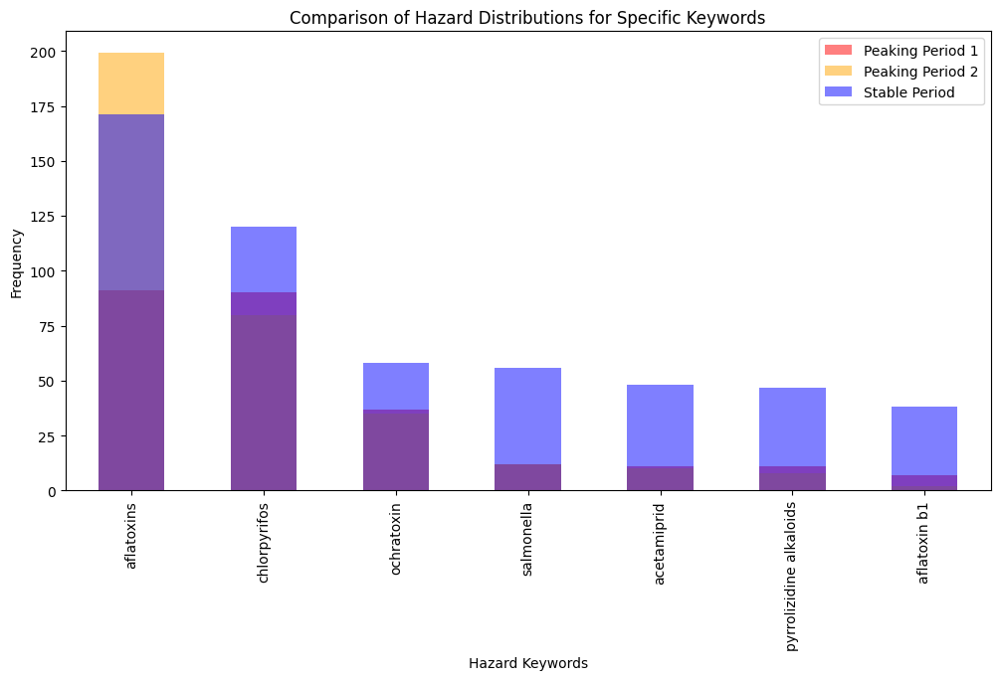

In [95]:
# Define the hazard keywords of interest
hazard_keywords_of_interest = ['chlorpyrifos','aflatoxins','acetamiprid','ochratoxin','pyrrolizidine alkaloids','salmonella','aflatoxin b1']

# Function to filter and count hazard keywords during a specific period
def count_hazard_keywords(df, keywords):
    exploded_df = df.explode('Aggregated Keywords')
    filtered_df = exploded_df[exploded_df['Aggregated Keywords'].isin(keywords)]
    return filtered_df['Aggregated Keywords'].value_counts()

# Count hazard keywords during each period
hazard_distribution_peaking_1 = count_hazard_keywords(peaking_period_1, hazard_keywords_of_interest)
hazard_distribution_peaking_2 = count_hazard_keywords(peaking_period_2, hazard_keywords_of_interest)
hazard_distribution_stable = count_hazard_keywords(stable_period, hazard_keywords_of_interest)

# Display the distributions
print("Hazard Distribution during Peaking Period 1 (2020-06 to 2021-05):")
print(hazard_distribution_peaking_1)

print("\nHazard Distribution during Peaking Period 2 (2021-09 to 2022-05):")
print(hazard_distribution_peaking_2)

print("\nHazard Distribution during Stable Period:")
print(hazard_distribution_stable)


plt.figure(figsize=(12, 6))
hazard_distribution_peaking_1.plot(kind='bar', alpha=0.5, color='red', label='Peaking Period 1')
hazard_distribution_peaking_2.plot(kind='bar', alpha=0.5, color='orange', label='Peaking Period 2')
hazard_distribution_stable.plot(kind='bar', alpha=0.5, color='blue', label='Stable Period')
plt.legend()
plt.title('Comparison of Hazard Distributions for Specific Keywords')
plt.xlabel('Hazard Keywords')
plt.ylabel('Frequency')
plt.show()


#### **Total counts of hazards in each period**

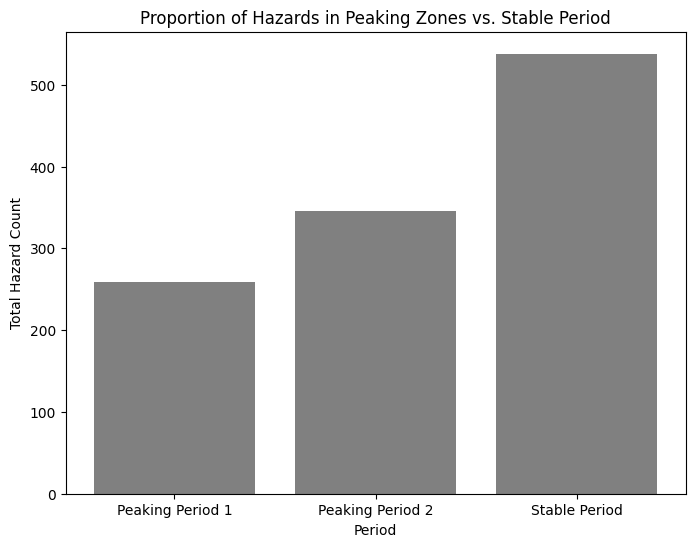

In [96]:
# Total counts of hazards in each period
total_hazards_peaking_1 = hazard_distribution_peaking_1.sum()
total_hazards_peaking_2 = hazard_distribution_peaking_2.sum()
total_hazards_stable = hazard_distribution_stable.sum()

# Combine the data into a DataFrame for easy plotting
hazard_proportions = pd.DataFrame({
    'Period': ['Peaking Period 1', 'Peaking Period 2', 'Stable Period'],
    'Count': [total_hazards_peaking_1, total_hazards_peaking_2, total_hazards_stable]
})

# Plotting the hazard proportions
plt.figure(figsize=(8, 6))
plt.bar(hazard_proportions['Period'], hazard_proportions['Count'], color=['grey', 'grey', 'grey'])
plt.title('Proportion of Hazards in Peaking Zones vs. Stable Period')
plt.xlabel('Period')
plt.ylabel('Total Hazard Count')
plt.show()

#### **Hazard distribution during stable period**

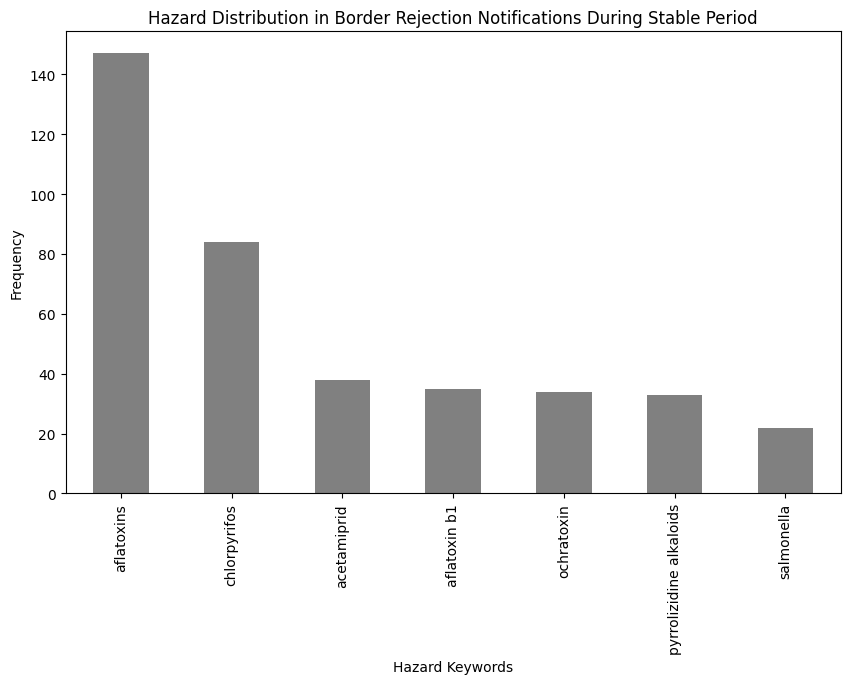

In [97]:
# Filter for border rejection notifications in the stable period
stable_rejections_df = stable_period[stable_period['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications during the stable period
stable_hazard_distribution = count_hazard_keywords(stable_rejections_df, hazard_keywords_of_interest)

# Visualize the distribution
plt.figure(figsize=(10, 6))
stable_hazard_distribution.plot(kind='bar', color='grey')
plt.title('Hazard Distribution in Border Rejection Notifications During Stable Period')
plt.xlabel('Hazard Keywords')
plt.ylabel('Frequency')
plt.show()

#### **Hazard distributions of border rejection notifications; Türkiye vs. Other Countries for each period**

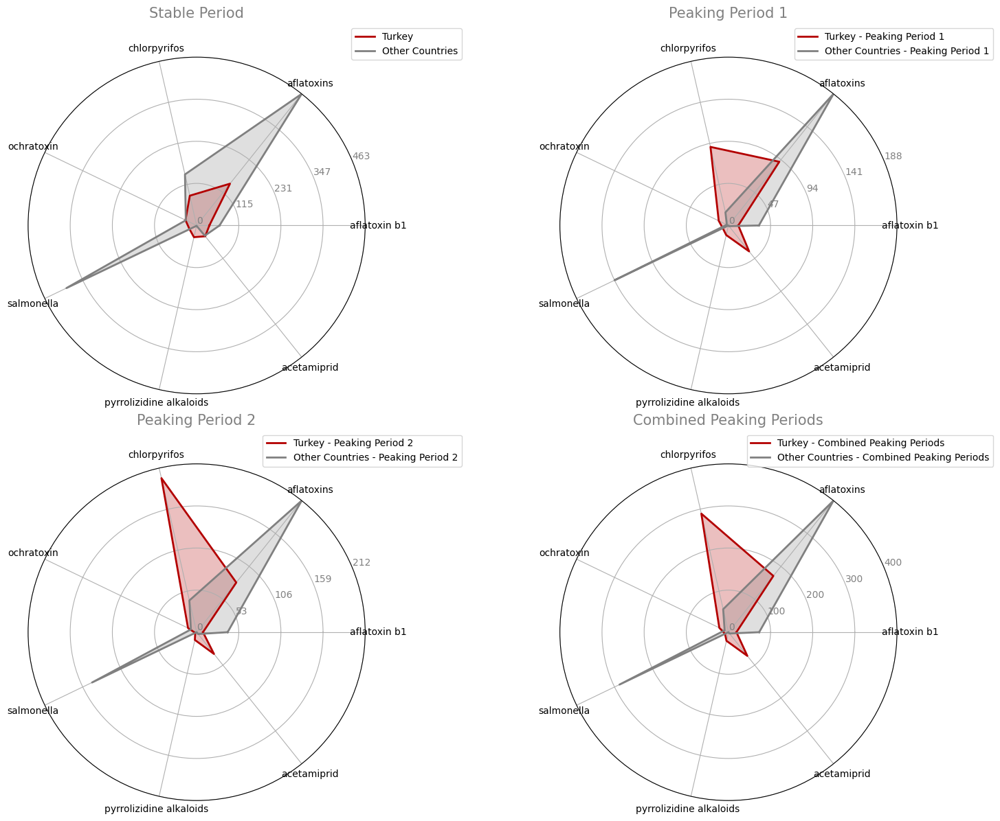

In [98]:
# Filter data for other countries during the stable period
stable_period_others = filtered_df_copy[(filtered_df_copy['Validation Date'] < '2020-06-01') | 
                                        (filtered_df_copy['Validation Date'] > '2022-05-31')]
stable_period_others = stable_period_others[stable_period_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during the stable period
stable_rejections_others_df = stable_period_others[stable_period_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during the stable period
stable_hazard_distribution_others = count_hazard_keywords(stable_rejections_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Filter data for other countries during Peaking Period 1
peaking_period_1_others = filtered_df_copy[filtered_df_copy['Validation Date'].between('2020-06-01', '2021-05-31')]
peaking_period_1_others = peaking_period_1_others[peaking_period_1_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during Peaking Period 1
peaking_rejections_1_others_df = peaking_period_1_others[peaking_period_1_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during Peaking Period 1
peaking_hazard_distribution_1_others = count_hazard_keywords(peaking_rejections_1_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Filter data for other countries during Peaking Period 2
peaking_period_2_others = filtered_df_copy[filtered_df_copy['Validation Date'].between('2021-09-01', '2022-05-31')]
peaking_period_2_others = peaking_period_2_others[peaking_period_2_others['Origin Country'] != 'Türkiye']

# Filter for border rejection notifications in other countries during Peaking Period 2
peaking_rejections_2_others_df = peaking_period_2_others[peaking_period_2_others['Notification Classification'] == 'border rejection notification']

# Count hazard keywords in border rejection notifications for other countries during Peaking Period 2
peaking_hazard_distribution_2_others = count_hazard_keywords(peaking_rejections_2_others_df, hazard_keywords_of_interest)

# ---------------------------------------------------------------------------------------------------------------------------------------------------

# Combine Turkey's peaking data
combined_peaking_turkey = hazard_distribution_peaking_1.add(hazard_distribution_peaking_2, fill_value=0)

# Combine other countries' peaking data
combined_peaking_others = peaking_hazard_distribution_1_others.add(peaking_hazard_distribution_2_others, fill_value=0)

# ---------------------------------------------------------------------------------------------------------------------------------------------------
# CORRECT REINDEXING OPERATION
common_order_severity = ['aflatoxin b1','aflatoxins','chlorpyrifos','ochratoxin','salmonella','pyrrolizidine alkaloids','acetamiprid']

hazard_distribution_peaking_1 = hazard_distribution_peaking_1.reindex(common_order_severity, fill_value=0)
hazard_distribution_peaking_2 = hazard_distribution_peaking_2.reindex(common_order_severity, fill_value=0)
stable_hazard_distribution = stable_hazard_distribution.reindex(common_order_severity, fill_value=0)
combined_peaking_turkey = combined_peaking_turkey.reindex(common_order_severity, fill_value=0)
stable_hazard_distribution_others = stable_hazard_distribution_others.reindex(common_order_severity, fill_value=0)
peaking_hazard_distribution_1_others = peaking_hazard_distribution_1_others.reindex(common_order_severity, fill_value=0)
peaking_hazard_distribution_2_others = peaking_hazard_distribution_2_others.reindex(common_order_severity, fill_value=0)
combined_peaking_others = combined_peaking_others.reindex(common_order_severity, fill_value=0)

# Define a function to create a radar chart
def create_radar_chart(ax, data, labels, title, color, label_name):
    # Number of variables we're plotting
    num_vars = len(labels)

    # Split the circle into even parts and save the angles for each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # The radar chart is circular, so we need to "complete the loop" and append the start angle to the end
    data = np.concatenate((data, [data[0]]))
    angles += angles[:1]

    # Draw the outline of the radar chart
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid', label=label_name)
    ax.fill(angles, data, color=color, alpha=0.25)

    # Fix the labels to match the number of variables
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title of the radar chart
    ax.set_title(title, size=15, color=color, y=1.1)

    # Set the range of the radar chart
    ax.set_ylim(0, max(data))

    # Hide the radial labels
    ax.set_yticklabels([])

    # Set radial axis labels
    max_value = max(data)
    ax.set_yticks(np.linspace(0, max_value, num=5))
    ax.set_yticklabels([f'{int(x)}' for x in np.linspace(0, max_value, num=5)], color="grey", size=10)


# Create a figure with 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw=dict(polar=True))

# Plot 1: Radar chart for Stable Period
create_radar_chart(axs[0, 0], stable_hazard_distribution.values, stable_hazard_distribution.index, 'Stable Period', '#b30000', 'Turkey')
create_radar_chart(axs[0, 0], stable_hazard_distribution_others.values, stable_hazard_distribution_others.index, 'Stable Period', 'grey', 'Other Countries')

# Plot 2: Radar chart for Peaking Period 1
create_radar_chart(axs[0, 1], hazard_distribution_peaking_1.values, hazard_distribution_peaking_1.index, 'Peaking Period 1', '#b30000', 'Turkey - Peaking Period 1')
create_radar_chart(axs[0, 1], peaking_hazard_distribution_1_others.values, peaking_hazard_distribution_1_others.index, 'Peaking Period 1', 'grey', 'Other Countries - Peaking Period 1')

# Plot 3: Radar chart for Peaking Period 2
create_radar_chart(axs[1, 0], hazard_distribution_peaking_2.values, hazard_distribution_peaking_2.index, 'Peaking Period 2', '#b30000', 'Turkey - Peaking Period 2')
create_radar_chart(axs[1, 0], peaking_hazard_distribution_2_others.values, peaking_hazard_distribution_2_others.index, 'Peaking Period 2', 'grey', 'Other Countries - Peaking Period 2')

# Plot 4: Radar chart for Combined Peaking Periods
create_radar_chart(axs[1, 1], combined_peaking_turkey.values, combined_peaking_turkey.index, 'Combined Peaking Periods', '#b30000', 'Turkey - Combined Peaking Periods')
create_radar_chart(axs[1, 1], combined_peaking_others.values, combined_peaking_others.index, 'Combined Peaking Periods', 'grey', 'Other Countries - Combined Peaking Periods')

# Add legends
for ax in axs.flatten():
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

# Adjust layout
plt.tight_layout()
plt.show()


#### **Hazard distributions for border rejection notifications; Türkiye vs. Top 10 Non EU countries for each period**

In [99]:
top10_non_eu.remove('Türkiye')

In [100]:
# Filter data for top 10 non-EU countries during the stable period
stable_period_top10 = stable_period_others[stable_period_others['Origin Country'].isin(top10_non_eu)]

# Filter data for top 10 non-EU countries during Peaking Period 1
peaking_period_1_top10 = peaking_period_1_others[peaking_period_1_others['Origin Country'].isin(top10_non_eu)]

# Filter data for top 10 non-EU countries during Peaking Period 2
peaking_period_2_top10 = peaking_period_2_others[peaking_period_2_others['Origin Country'].isin(top10_non_eu)]


In [101]:
# Count hazard keywords in border rejection notifications for top 10 non-EU countries during each period
stable_hazard_distribution_top10 = count_hazard_keywords(stable_period_top10, hazard_keywords_of_interest)
peaking_hazard_distribution_1_top10 = count_hazard_keywords(peaking_period_1_top10, hazard_keywords_of_interest)
peaking_hazard_distribution_2_top10 = count_hazard_keywords(peaking_period_2_top10, hazard_keywords_of_interest)


In [102]:
# Combine Turkey's peaking data
combined_peaking_turkey = hazard_distribution_peaking_1.add(hazard_distribution_peaking_2, fill_value=0)

# Combine top 10 non-EU countries' peaking data
combined_peaking_top10 = peaking_hazard_distribution_1_top10.add(peaking_hazard_distribution_2_top10, fill_value=0)

#REINDEXING OPERATION
peaking_hazard_distribution_1_top10 = peaking_hazard_distribution_1_top10.reindex(common_order_severity, fill_value=0)
peaking_hazard_distribution_2_top10 = peaking_hazard_distribution_2_top10.reindex(common_order_severity, fill_value=0)
stable_hazard_distribution_top10 = stable_hazard_distribution_top10.reindex(common_order_severity, fill_value=0)
combined_peaking_top10 = combined_peaking_top10.reindex(common_order_severity, fill_value=0)

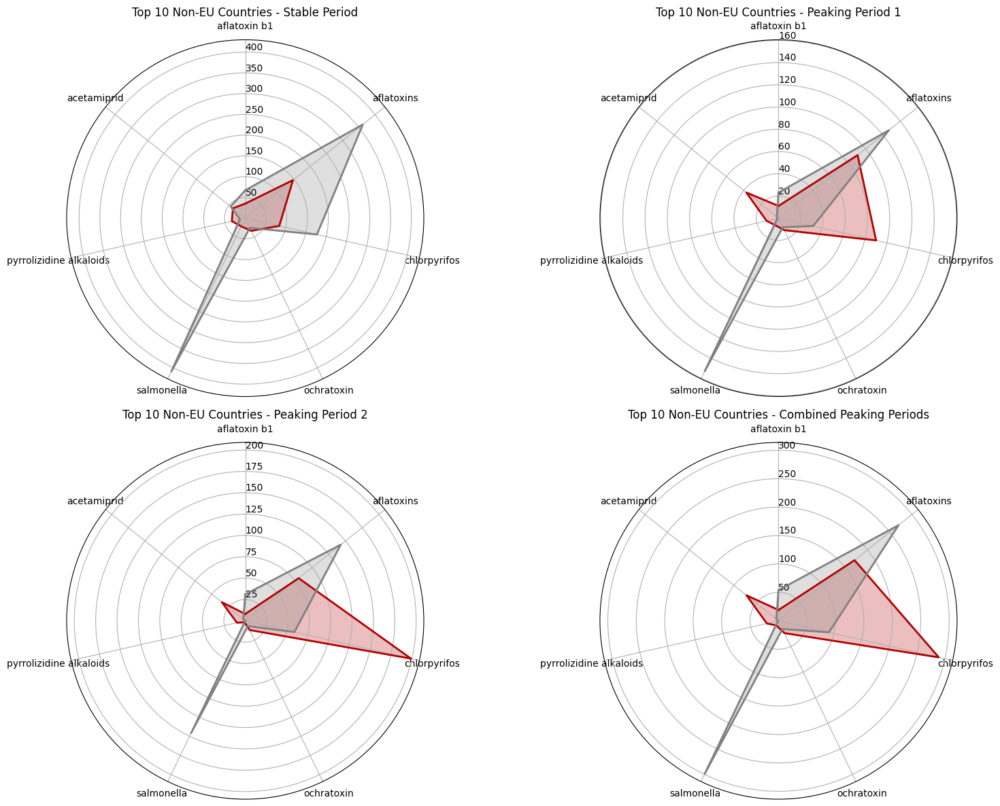

In [103]:
# Function to create a radar chart
def create_radar_chart(ax, data, labels, title, color):
    num_vars = len(labels)

    # Compute angle for each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # The plot is a circular graph, so we need to "close the circle" by duplicating the first value
    data = data.tolist()
    data += data[:1]
    angles += angles[:1]

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels
    ax.set_rlabel_position(0)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, data, color=color, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.set_title(title)

# Labels for the radar chart
labels = stable_hazard_distribution.index.tolist()

# Create a figure with 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw=dict(polar=True))

# Plot 1: Comparison of Hazard Distributions in Border Rejection Notifications During Stable Period
create_radar_chart(axs[0, 0], stable_hazard_distribution.values, labels, 'Turkey - Stable Period', '#b30000')
create_radar_chart(axs[0, 0], stable_hazard_distribution_top10.values, labels, 'Top 10 Non-EU Countries - Stable Period', 'grey')

# Plot 2: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 1
create_radar_chart(axs[0, 1], hazard_distribution_peaking_1.values, labels, 'Turkey - Peaking Period 1', '#b30000')
create_radar_chart(axs[0, 1], peaking_hazard_distribution_1_top10.values, labels, 'Top 10 Non-EU Countries - Peaking Period 1', 'grey')

# Plot 3: Comparison of Hazard Distributions in Border Rejection Notifications During Peaking Period 2
create_radar_chart(axs[1, 0], hazard_distribution_peaking_2.values, labels, 'Turkey - Peaking Period 2', '#b30000')
create_radar_chart(axs[1, 0], peaking_hazard_distribution_2_top10.values, labels, 'Top 10 Non-EU Countries - Peaking Period 2', 'grey')

# Plot 4: Comparison of Hazard Distributions in Border Rejection Notifications During Combined Peaking Periods
create_radar_chart(axs[1, 1], combined_peaking_turkey.values, labels, 'Turkey - Combined Peaking Periods', '#b30000')
create_radar_chart(axs[1, 1], combined_peaking_top10.values, labels, 'Top 10 Non-EU Countries - Combined Peaking Periods', 'grey')

# Adjust layout
plt.tight_layout()
plt.show()


### **7.Chlorpyrifos case: Did Türkiye improved upon its pesticide procedures?**

Upon the findings about the pesticide contribution on the Türkiye's notification upbringings, as well as the following decrease, further analysis on the products related to the chlorpyrifos were made to deduce the nature of this decrease. The most notable of those products are: [**lemon , pepper, grapefruit, mandarin, orange**]


##### Overall Trends:
- The charts shows two distinct peaks corresponding to **Peaking Period 1** and **Peaking Period 2**, followed by a significant decline in notifications in the subsequent stable period.
- The composition of notifications during these peaks shows some variation, with different products contributing more or less to the total number of notifications over time.

##### Peppers:
- **Dominance During Peaks:** Peppers (represented by the blue area) consistently contribute a significant proportion of notifications during both Peaking Period 1 and Peaking Period 2. This suggests that peppers were a major source of chlorpyrifos-related issues during these periods.
- **Decline After Peaks:** There is a noticeable decline in the proportion of pepper-related notifications after the peaks, particularly in the stable period following Peaking Period 2. This could indicate either an improvement in how peppers are managed (leading to fewer issues with chlorpyrifos) or a decrease in the export volume of peppers.

##### Lemons and Other Products:
- **Fluctuations in Proportions:** Lemons (orange area), along with mandarins and grapefruits, show fluctuations in their contributions across the periods. These products seem to have had less of a role in the overall notification count during the stable periods compared to the peaks.
- **Stability Post-Peak:** After the peaks, these products continue to contribute to the notifications, but at a reduced rate, suggesting a possible improvement in how these products are handled or a decrease in their exports.

##### Proportional Shifts:
- **Stable Period:** During the stable period, the relative proportions of notifications are more evenly distributed among the different products, and the total number of notifications is lower, which may indicate improved practices across all product types.

##### Deduction Regarding Chlorpyrifos Notifications:

###### Improvement in Turkey's Practices:
- The significant reduction in the total number of notifications after Peaking Period 2, coupled with the more balanced distribution of notifications among the products, could indicate that Turkey has improved its practices, particularly for peppers, which were a major contributor during the peaks.

###### Reduction in Exports:
- The proportional reductions and the overall decline in notifications could also suggest that the EU has reduced its imports of these products from Turkey, particularly if the improvement in practices was not the sole factor.

###### Conclusion:
The chart suggests that the decrease in chlorpyrifos notifications could be attributed to both factors:

1. **Improved handling practices in Turkey:** This is particularly evident for peppers, which saw a notable reduction after Peaking Period 2.
2. **Possible reduction in EU imports:** The overall decline in notifications and the more evenly distributed proportions among products during the stable period suggest that the reduction in imports may have also played a role.

##### Strengthened Case for Improvement:

###### **Increased Exports vs. Decreased Notifications:**

According to the EU Agri Food data-provided at the start of the analysis-, if Turkey's export capacity has increased, yet the number of notifications has decreased, this suggests that the reduction in notifications is not due to a reduction in exports but rather due to better management or handling practices, particularly concerning chlorpyrifos levels.
This implies that Turkey is exporting more or maintaining its export levels while simultaneously reducing the number of products flagged for chlorpyrifos, which points towards improvements in agricultural practices, pesticide management, or compliance with EU regulations.

###### **Comparison with Other Countries:**

The fact that other top exporters to the EU are showing decreases in export volumes could mean that any decrease in notifications for these countries might be partially attributed to reduced export volumes. In contrast, Turkey’s slight increase in exports alongside a reduction in notifications indicates a stronger case for genuine improvement.

###### **Market Confidence:**

An increase in exports might also indicate that the EU has more confidence in the safety and quality of Turkish agricultural products, possibly due to the improved management practices that are leading to fewer chlorpyrifos-related issues.

###### **Conclusion:**
Given the context of increased export capacity, the reduction in chlorpyrifos notifications from Turkey is more likely due to improved practices rather than a reduction in exports to the EU. This aligns with the trends observed in the visualization, where certain products (like peppers) show a significant reduction in notifications over time, suggesting that Turkey has made progress in addressing chlorpyrifos-related issues.

#### Timeline of notifications for fruit and vegetables from Türkiye

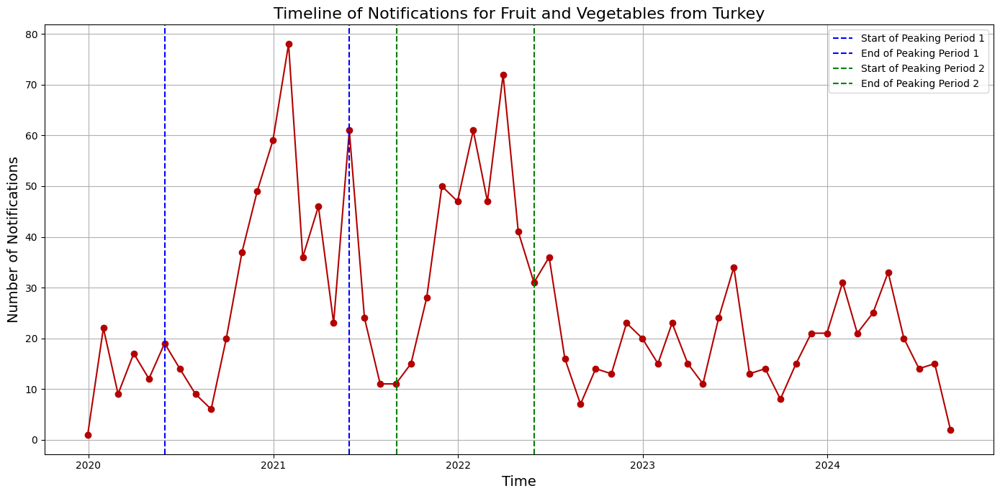

In [104]:
# Filter the data for the fruit and vegetable category specific to Turkey
turkey_fruit_veg_df = filtered_df_copy[(filtered_df_copy['Product Category'] == 'Fruits and Vegetables') & 
                                       (filtered_df_copy['Origin Country'] == 'Türkiye')]

# Set the 'Validation Date' as the index for easy plotting
turkey_fruit_veg_df.set_index('Validation Date', inplace=True)

# Resample the data by month and count the notifications
monthly_notifications_turkey = turkey_fruit_veg_df.resample('ME').size()

# Plot the timeline of notifications
plt.figure(figsize=(14, 7))
plt.plot(monthly_notifications_turkey, color='#b30000', marker='o')
plt.title('Timeline of Notifications for Fruit and Vegetables from Turkey', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Number of Notifications', fontsize=14)
plt.grid(True)
plt.axvline(pd.Timestamp('2020-06-01'), color='blue', linestyle='--', label='Start of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-05-31'), color='blue', linestyle='--', label='End of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-09-01'), color='green', linestyle='--', label='Start of Peaking Period 2')
plt.axvline(pd.Timestamp('2022-05-31'), color='green', linestyle='--', label='End of Peaking Period 2')
plt.legend()
plt.tight_layout()
plt.show()

#### Product occurance distributions by periods

In [105]:
# Ensure 'Aggregated Keywords' is clean and all entries are strings
turkey_fruit_veg_df['Aggregated Keywords'] = turkey_fruit_veg_df['Aggregated Keywords'].apply(lambda x: [str(i) for i in x] if isinstance(x, list) else [])

# Re-define the periods using the index, since 'Validation Date' is the index
stable_period = (turkey_fruit_veg_df.index < '2020-06-01') | (turkey_fruit_veg_df.index > '2022-05-31')
peaking_period_1 = turkey_fruit_veg_df.index.to_series().between('2020-06-01', '2021-05-31')
peaking_period_2 = turkey_fruit_veg_df.index.to_series().between('2021-09-01', '2022-05-31')

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\2789027533.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
# Define the product names of interest
product_names_of_interest = ['lemon', 'pepper', 'grapefruit', 'mandarin', 'orange']

# Function to filter and count occurrences of product names as substrings during a specific period
def count_product_names(df, product_names):
    exploded_df = df.explode('Aggregated Keywords')
    
    # Ensure all entries in 'Aggregated Keywords' are strings
    exploded_df['Aggregated Keywords'] = exploded_df['Aggregated Keywords'].astype(str).fillna('')

    counts = {}
    for name in product_names:
        # Count occurrences where the product name is found within the keyword
        counts[name] = exploded_df['Aggregated Keywords'].str.contains(name, case=False, na=False).sum()
    
    return pd.Series(counts)


# Count product names during each period using the updated method
product_distribution_peaking_1 = count_product_names(turkey_fruit_veg_df[peaking_period_1], product_names_of_interest)
product_distribution_peaking_2 = count_product_names(turkey_fruit_veg_df[peaking_period_2], product_names_of_interest)
product_distribution_stable = count_product_names(turkey_fruit_veg_df[stable_period], product_names_of_interest)

# Display the distributions
print("Product Distribution during Peaking Period 1 (2020-06 to 2021-05):")
print(product_distribution_peaking_1)

print("\nProduct Distribution during Peaking Period 2 (2021-09 to 2022-05):")
print(product_distribution_peaking_2)

print("\nProduct Distribution during Stable Period:")
print(product_distribution_stable)


Product Distribution during Peaking Period 1 (2020-06 to 2021-05):
lemon          35
pepper        167
grapefruit     31
mandarin       59
orange         25
dtype: int64

Product Distribution during Peaking Period 2 (2021-09 to 2022-05):
lemon         63
pepper        71
grapefruit    67
mandarin      54
orange        15
dtype: int64

Product Distribution during Stable Period:
lemon          97
pepper        135
grapefruit     28
mandarin       20
orange         14
dtype: int64


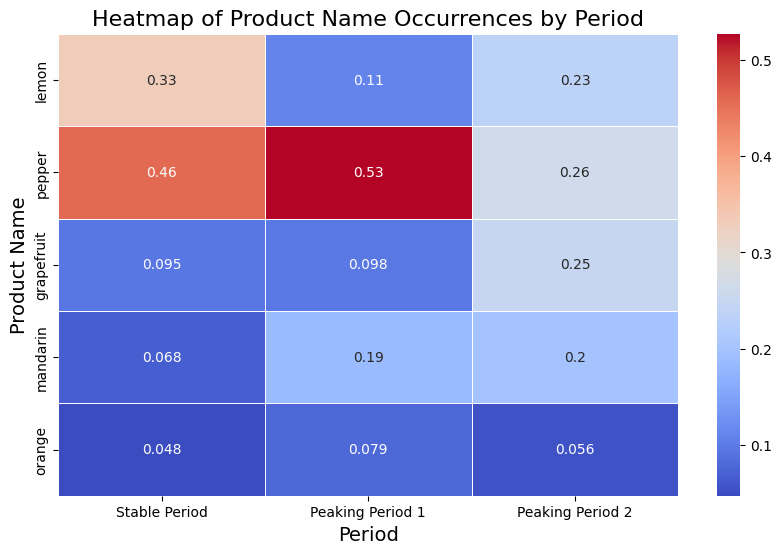

In [107]:
# Combine the product distributions into a DataFrame
product_distributions = pd.DataFrame({
    'Stable Period': product_distribution_stable,
    'Peaking Period 1': product_distribution_peaking_1,
    'Peaking Period 2': product_distribution_peaking_2
})

# Normalize the data by dividing by the total occurrences to make the heatmap easier to interpret
product_distributions_normalized = product_distributions.div(product_distributions.sum(axis=0), axis=1)

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(product_distributions_normalized, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Product Name Occurrences by Period', fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Product Name', fontsize=14)
plt.show()

#### Timeline of notifications by product name for fruit and vegetables from Türkiye

C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\2292811112.py:9: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



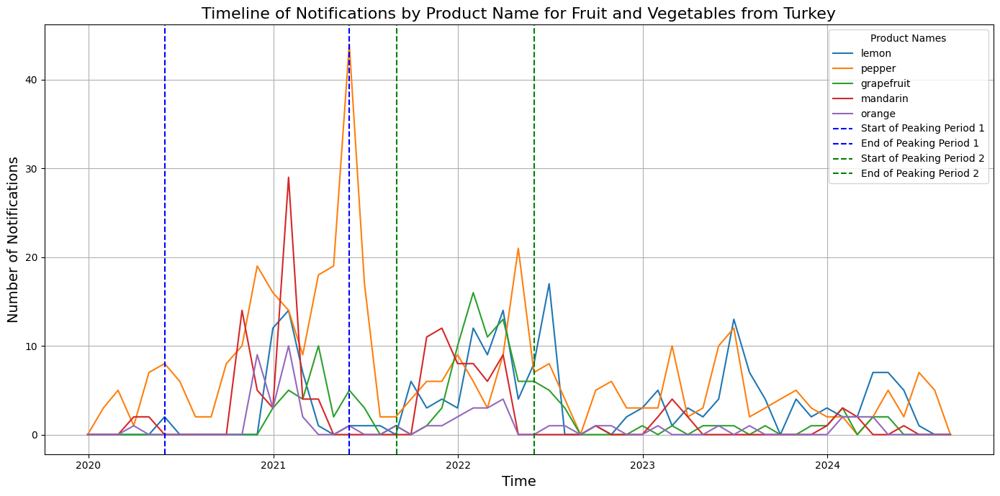

In [108]:
# Create a DataFrame to store the time series for each product
product_time_series = pd.DataFrame(index=turkey_fruit_veg_df.index)

# Calculate the occurrence of each product over time
for product in product_names_of_interest:
    product_time_series[product] = turkey_fruit_veg_df['Aggregated Keywords'].apply(lambda x: product in ' '.join(x).lower()).astype(int)

# Resample to monthly data to smooth the time series
monthly_product_time_series = product_time_series.resample('M').sum()

# Plotting
plt.figure(figsize=(14, 7))

for product in product_names_of_interest:
    plt.plot(monthly_product_time_series.index, monthly_product_time_series[product],label=product)

# Highlight the periods with vertical lines
plt.axvline(pd.Timestamp('2020-06-01'), color='blue', linestyle='--', label='Start of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-05-31'), color='blue', linestyle='--', label='End of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-09-01'), color='green', linestyle='--', label='Start of Peaking Period 2')
plt.axvline(pd.Timestamp('2022-05-31'), color='green', linestyle='--', label='End of Peaking Period 2')

plt.title('Timeline of Notifications by Product Name for Fruit and Vegetables from Turkey', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Number of Notifications', fontsize=14)
plt.legend(title='Product Names')
plt.grid(True)
plt.tight_layout()
plt.show()

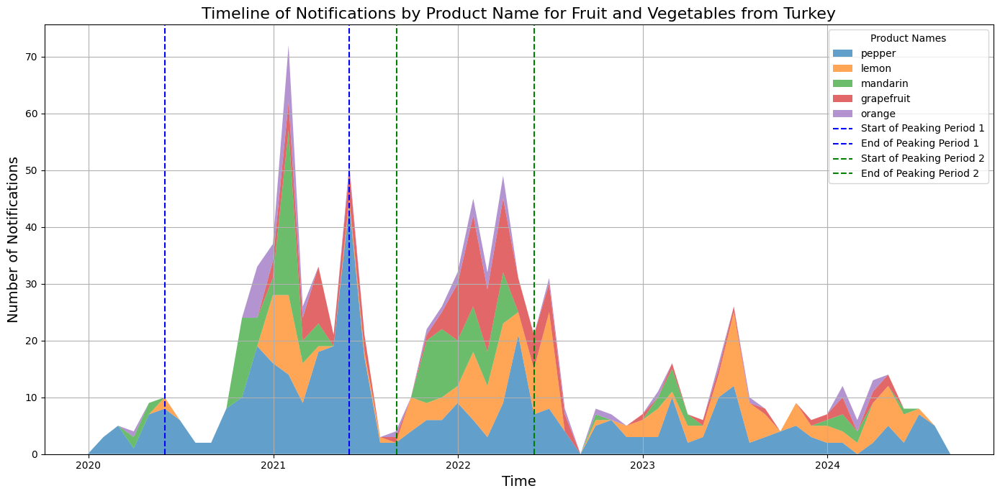

In [109]:
# Fill missing values with zeros to ensure proper stacking
monthly_product_time_series_filled = monthly_product_time_series.fillna(0)

# Sort products by total occurrences to stack them in a logical order
total_occurrences = monthly_product_time_series_filled.sum(axis=0)
sorted_products = total_occurrences.sort_values(ascending=False).index
monthly_product_time_series_sorted = monthly_product_time_series_filled[sorted_products]

# Plotting
plt.figure(figsize=(14, 7))

# Plot a stacked area chart
plt.stackplot(monthly_product_time_series_sorted.index, 
              [monthly_product_time_series_sorted[product] for product in sorted_products], 
              labels=sorted_products, 
              alpha=0.7)

# Highlight the periods with vertical lines
plt.axvline(pd.Timestamp('2020-06-01'), color='blue', linestyle='--', label='Start of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-05-31'), color='blue', linestyle='--', label='End of Peaking Period 1')
plt.axvline(pd.Timestamp('2021-09-01'), color='green', linestyle='--', label='Start of Peaking Period 2')
plt.axvline(pd.Timestamp('2022-05-31'), color='green', linestyle='--', label='End of Peaking Period 2')

plt.title('Timeline of Notifications by Product Name for Fruit and Vegetables from Turkey', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Number of Notifications', fontsize=14)
plt.legend(title='Product Names')
plt.grid(True)
plt.tight_layout()
plt.show()

### **8.Inevitable fate for figs and pistachios: Aflatoxin case - A comparison between top pistachio exporters**

Aflatoxin contamination is a significant issue in food safety, particularly in dried fruits and nuts, where it poses serious health risks due to its carcinogenic nature. Among the prevalent contributors to food safety notifications, aflatoxin is notably associated with products like dried figs and pistachios, both of which undergo traditional harvesting, drying, and storage methods that can predispose them to contamination.

Turkey stands out as the sole exporter of dried figs, making comparisons in this category non-viable. However, in the context of pistachios, Turkey shares aflatoxin-related concerns with other major exporters, specifically the United States and Iran. Given that these three countries are the top pistachio exporters globally, they provide the most viable metrics for comparison regarding aflatoxin occurrences.

To ensure a fair comparison, the occurrences of aflatoxin-related notifications have been normalized based on the export revenues of these countries for 2022 and 2023. This normalization allows for a more accurate analysis of aflatoxin hazards across different export volumes, aiming to identify patterns and potential risks associated with pistachio production in these leading exporters.

#### Insights and Findings from the Graphs

1. **Normalized Aflatoxin Cases for Pistachios (2022 vs. 2023):**
   - In 2022, Turkey had the highest normalized aflatoxin cases among the three countries, followed by Iran and the United States. This suggests that, despite Turkey's significant pistachio exports, it faced a disproportionate number of aflatoxin-related notifications compared to its competitors.
   - By 2023, there was a notable shift. Iran exhibited a substantial increase in normalized aflatoxin cases, surpassing Turkey, which saw a reduction in its cases. The United States maintained the lowest levels of aflatoxin notifications across both years, indicating better control over aflatoxin contamination in its pistachio exports.

2. **Normalized All-Time Aflatoxin Cases (using 2022 weights):**
   - When considering the all-time data using 2022 export weights, Iran slightly leads in the total normalized aflatoxin cases, closely followed by Turkey. The United States continues to have significantly fewer aflatoxin notifications, reinforcing its relative strength in managing aflatoxin risks.
   - This overall view suggests that Iran and Turkey have comparable challenges with aflatoxin in pistachios, with both countries experiencing higher contamination levels than the United States over time.

3. **Normalized Aflatoxin Cases Over Time (using 2022 weights):**
   - The time series analysis reveals a fluctuating pattern of aflatoxin cases for both Turkey and Iran, with noticeable peaks and troughs. Turkey saw a peak in 2021, followed by a sharp decline in 2023, and then a recovery towards 2024. Iran, on the other hand, experienced a more gradual decline in cases until 2023, when it saw a significant resurgence.
   - The United States remained relatively stable, with only minor fluctuations in aflatoxin cases, further indicating its consistent control measures.

These findings highlight the dynamic nature of aflatoxin contamination in pistachio exports and underscore the importance of continuous monitoring and improvement in harvesting, drying, and storage practices, particularly for countries like Turkey and Iran, which face higher contamination risks. The differences in aflatoxin occurrences also point to potential variations in agricultural practices, climate conditions, and regulatory frameworks between these countries.

In [110]:
# Define the aflatoxin-related keywords of interest
aflatoxin_keywords_of_interest = ['aflatoxin', 'aflatoxin b1']

# Function to filter and count occurrences of aflatoxin keywords during a specific period
def count_aflatoxin_keywords(df, keywords):
    exploded_df = df.explode('Aggregated Keywords')
    
    # Ensure all entries in 'Aggregated Keywords' are strings
    exploded_df['Aggregated Keywords'] = exploded_df['Aggregated Keywords'].astype(str).fillna('')

    counts = {}
    for keyword in keywords:
        # Count occurrences where the aflatoxin keyword is found within the aggregated keyword
        counts[keyword] = exploded_df['Aggregated Keywords'].str.contains(keyword, case=False, na=False).sum()
    
    return pd.Series(counts)

# Aggregate aflatoxin notifications by country and product type
aflatoxin_counts = filtered_df_copy.groupby(['Origin Country', 'Product Type']).apply(lambda x: count_aflatoxin_keywords(x, aflatoxin_keywords_of_interest))

# Unstack the result to get a clearer view
aflatoxin_country_product = aflatoxin_counts.unstack(fill_value=0)

# Display the top countries contributing to aflatoxin issues
top_aflatoxin_countries = aflatoxin_country_product.sum(axis=1).sort_values(ascending=False)
print(top_aflatoxin_countries)


C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\4089114076.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Origin Country
Türkiye                              460.0
United States                        347.0
India                                169.0
Iran, Islamic Republic of            157.0
Egypt                                150.0
                                     ...  
Uruguay                                0.0
Uzbekistan                             0.0
Venezuela, Bolivarian Republic of      0.0
Yemen                                  0.0
Zimbabwe                               0.0
Length: 155, dtype: float64


C:\Users\MONSTER\AppData\Local\Temp\ipykernel_12896\4089114076.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



#### Keyword co-occurance analysis for the top 8

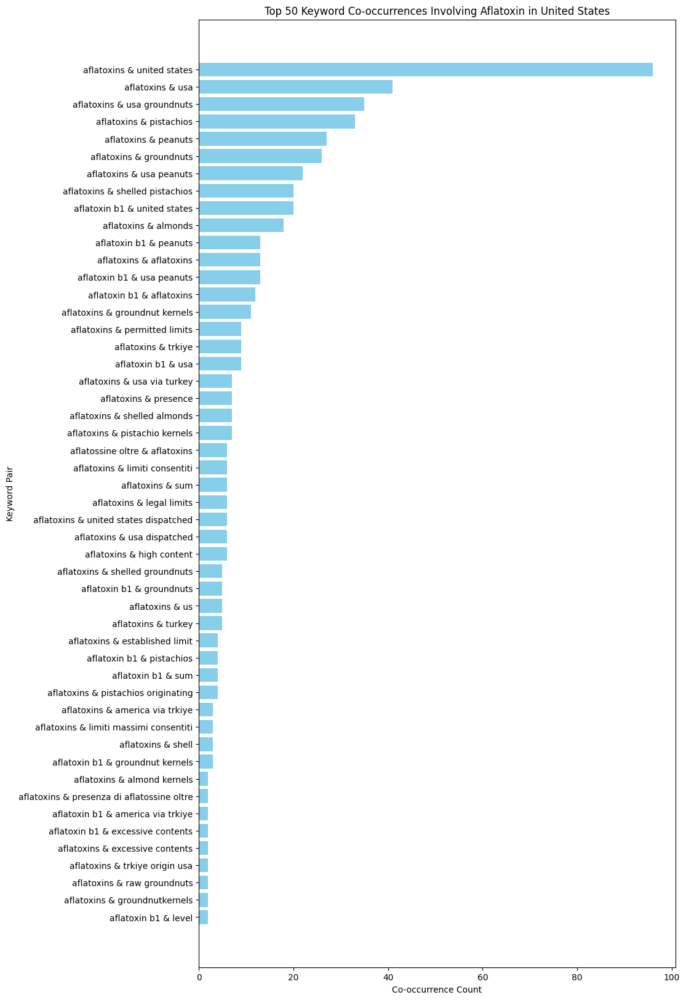

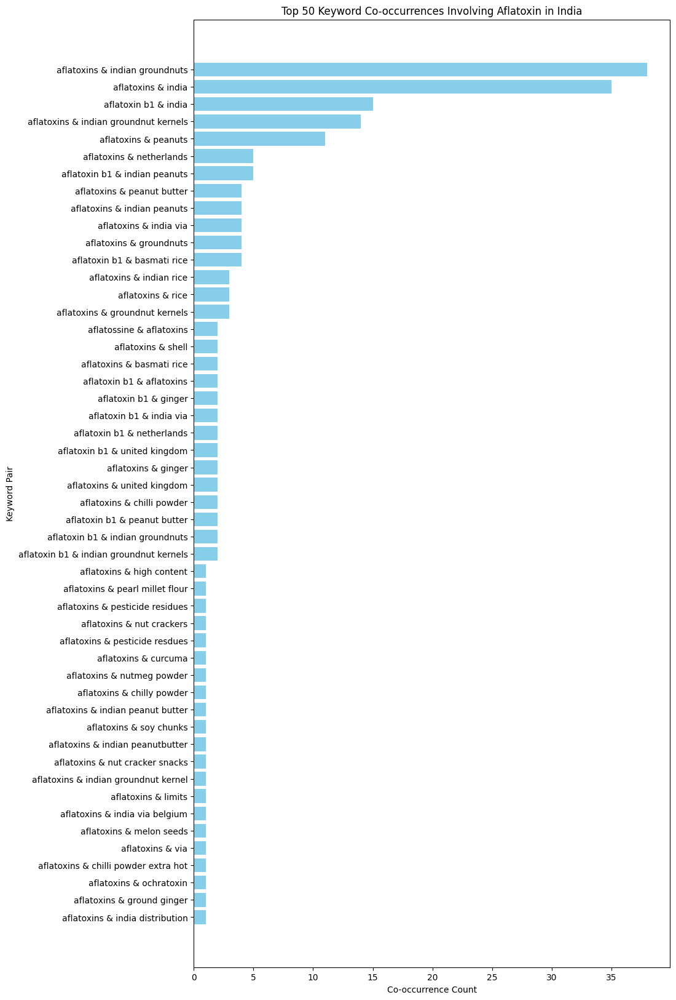

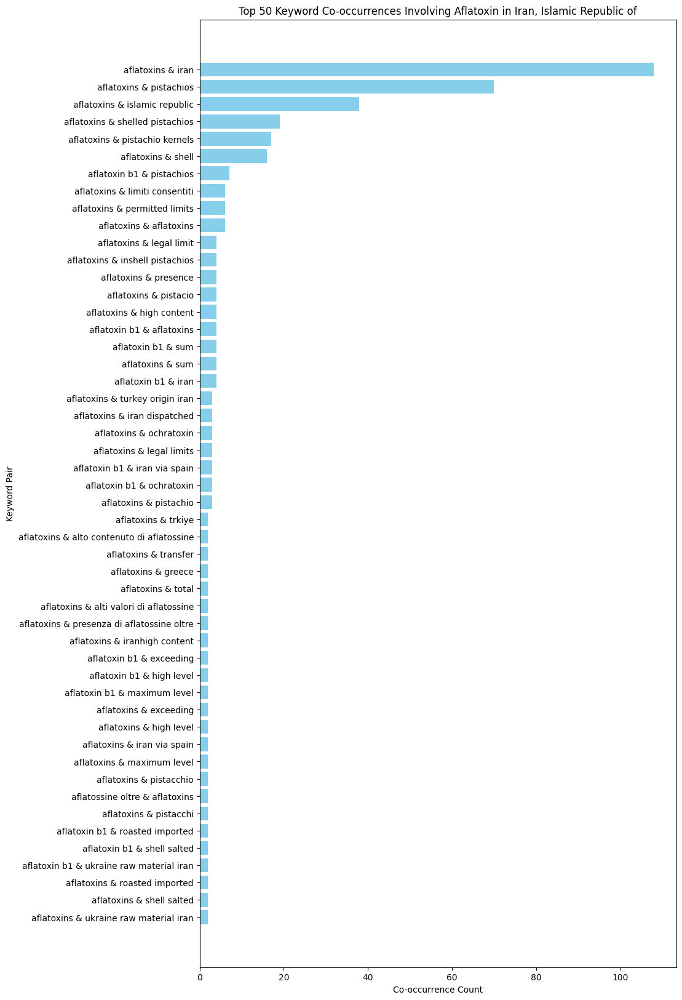

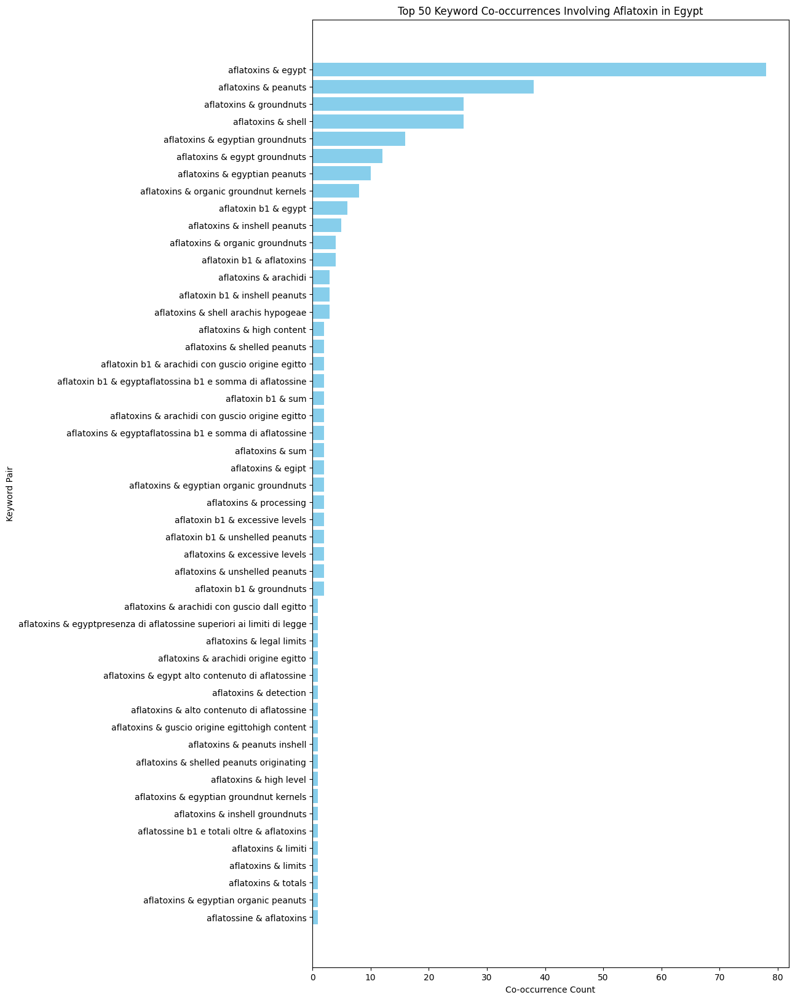

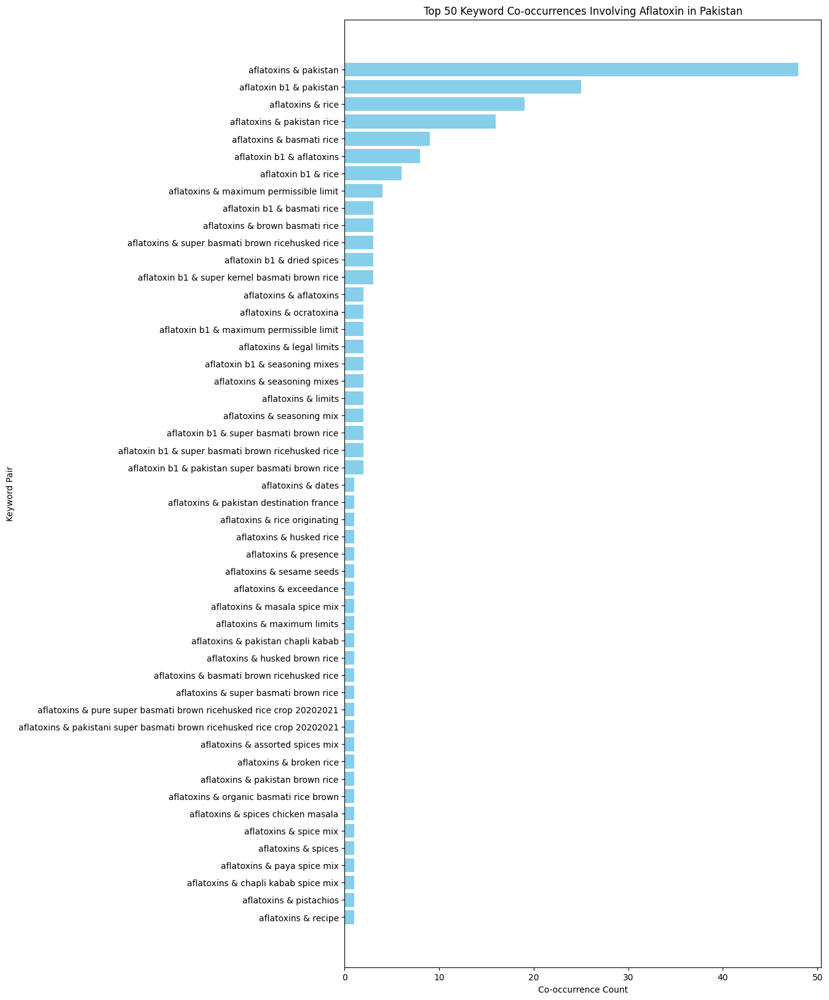

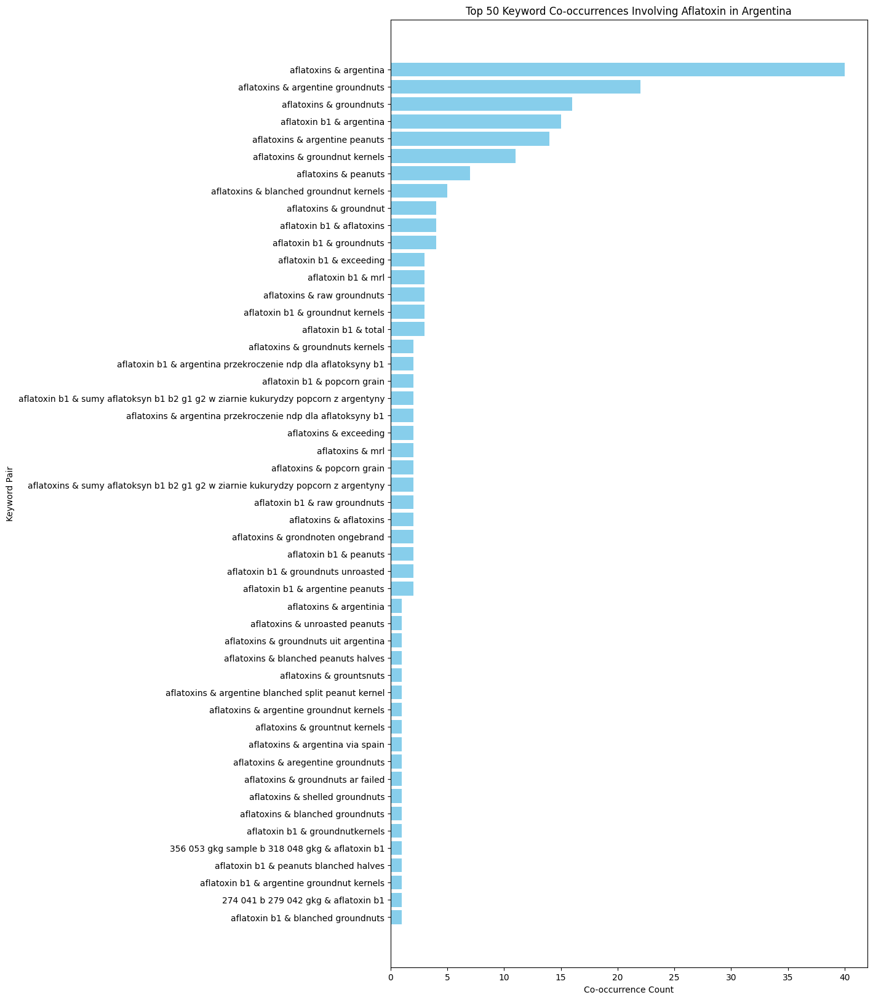

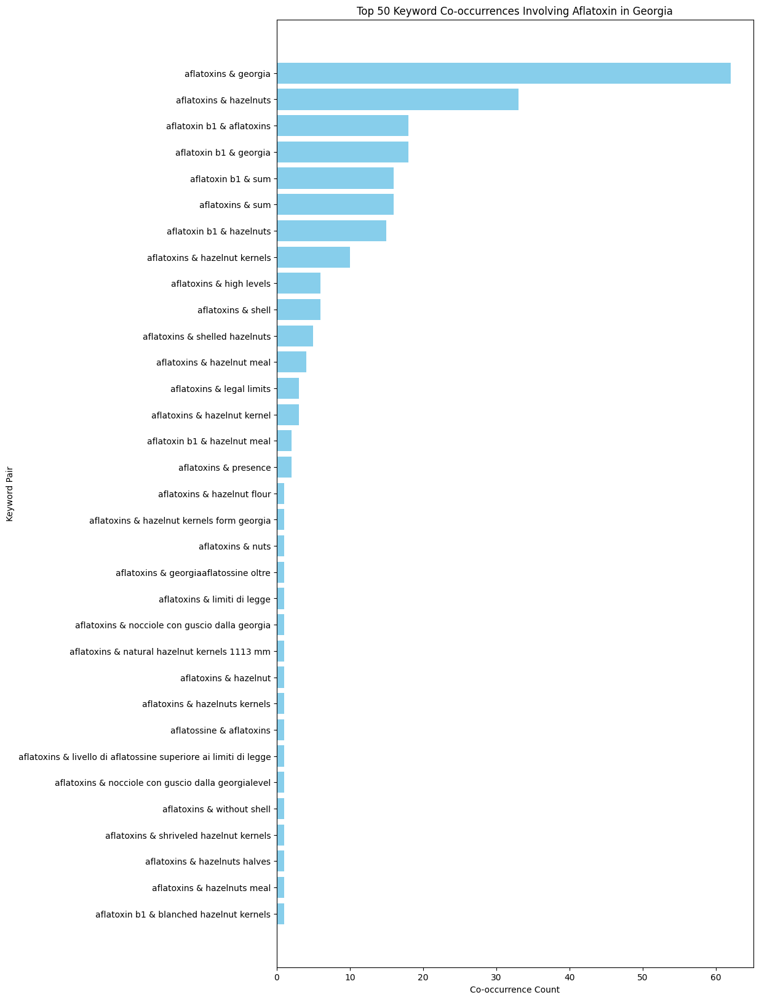

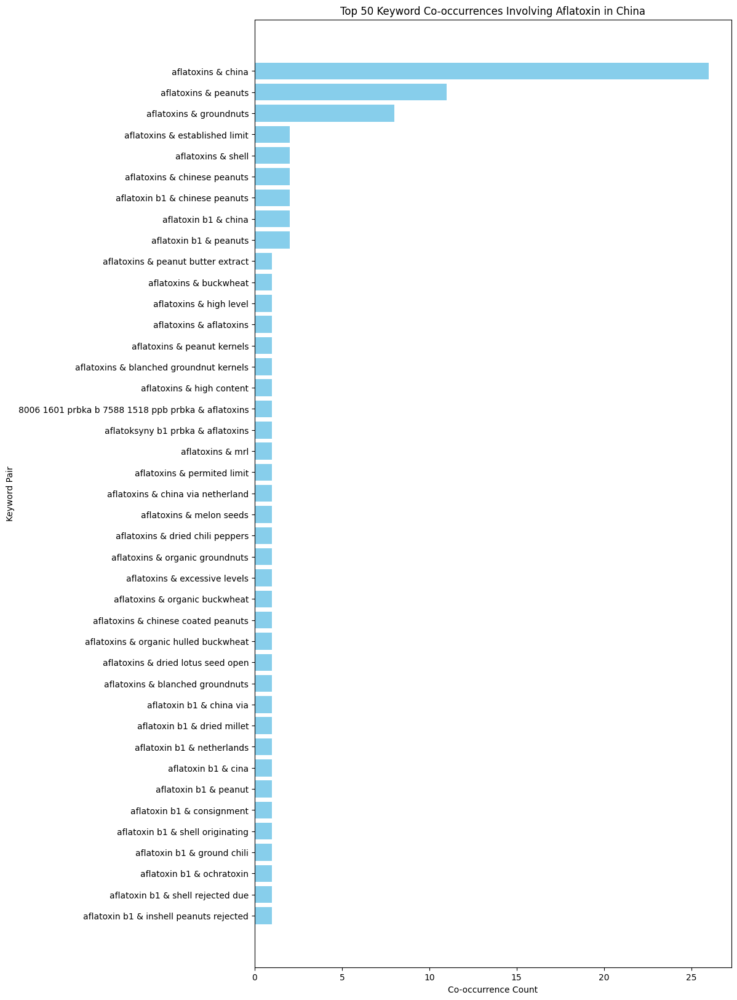

In [111]:
# Define the aflatoxin-related keywords of interest
aflatoxin_keywords_of_interest = ['aflatoxins', 'aflatoxin b1']

# Get the top 8 countries excluding Turkey
top_countries_excluding_turkey = top_aflatoxin_countries[top_aflatoxin_countries.index != 'Türkiye'].head(8).index

# Step 1: Create a DataFrame of co-occurrences for each country
aflatoxin_product_cooccurrences = {}

for country in top_countries_excluding_turkey:
    # Filter the DataFrame for the current country
    country_df = filtered_df_copy[filtered_df_copy['Origin Country'] == country]
    
    # Initialize a counter for co-occurrences
    co_occurrence_counts = Counter()
    
    # Iterate through the aflatoxin keywords
    for hazard in aflatoxin_keywords_of_interest:
        # Create a list of keyword combinations where the hazard is present
        keyword_combinations = [
            list(combinations(sorted(kw_list), 2)) 
            for kw_list in country_df['Aggregated Keywords'] 
            if any(term in kw_list for term in [hazard])
        ]
        
        # Flatten the list of co-occurrences and count them
        co_occurrence_counts.update([item for sublist in keyword_combinations for item in sublist])
    
    # Filter for co-occurrences that involve any aflatoxin keyword
    filtered_co_occurrences = {
        k: v for k, v in co_occurrence_counts.items() 
        if any(term in k for term in aflatoxin_keywords_of_interest)
    }
    
    # Get the top 50 co-occurrences for the current country
    top_50_co_occurrences = dict(sorted(filtered_co_occurrences.items(), key=lambda x: x[1], reverse=True)[:50])
    
    # Save the results for the current country
    aflatoxin_product_cooccurrences[country] = top_50_co_occurrences

# Step 2: Visualize the top co-occurrences for each country
for country, co_occurrences in aflatoxin_product_cooccurrences.items():
    terms = [' & '.join(k) for k in co_occurrences.keys()]
    counts = list(co_occurrences.values())
    
    plt.figure(figsize=(10, 20))
    plt.barh(terms, counts, color='skyblue')
    plt.xlabel('Co-occurrence Count')
    plt.ylabel('Keyword Pair')
    plt.title(f'Top 50 Keyword Co-occurrences Involving Aflatoxin in {country}')
    plt.gca().invert_yaxis()  # Highest count on top
    plt.show()

#### Normalized Aflatoxin comparison between top 3 pistachio exporters

In [112]:
# Define the countries and keywords of interest
countries_of_interest = ['United States', 'Iran, Islamic Republic of', 'Türkiye']
aflatoxin_keywords = ['aflatoxins', 'aflatoxin b1']
product_keyword = 'pistachio'

# Filter the DataFrame for aflatoxin-related cases and pistachios
filtered_aflatoxin_df = filtered_df_copy[
    (filtered_df_copy['Origin Country'].isin(countries_of_interest)) &
    (filtered_df_copy['Aggregated Keywords'].apply(lambda x: any(kw in aflatoxin_keywords for kw in x))) &
    (filtered_df_copy['Aggregated Keywords'].apply(lambda x: any(product_keyword in kw.lower() for kw in x)))
]

# Display the filtered DataFrame to ensure it's correct
print(filtered_aflatoxin_df.head())

     Reference              Product Category Product Type  \
4    2024.6074  Nuts, Nut Products and Seeds         food   
33   2024.6005  Nuts, Nut Products and Seeds         food   
206  2024.5671  Nuts, Nut Products and Seeds         food   
209  2024.5612  Nuts, Nut Products and Seeds         food   
271  2024.5491  Nuts, Nut Products and Seeds         food   

                                               Subject Validation Date  \
4    Aflatoxins in pistachios from the Islamic Repu...      2024-08-07   
33   Aflatoxins in pistachios from the Islamic Repu...      2024-08-06   
206        Aflatoxins in pistachios from United States      2024-07-23   
209                 Aflatoxins in pistachios from Iran      2024-07-23   
271  Partita pistacchi con guscio con valori di afl...      2024-07-18   

                Origin Country Notifying Country  \
4    Iran, Islamic Republic of           Germany   
33   Iran, Islamic Republic of           Germany   
206              United States  

In [113]:
# Group by Origin Country and Year to aggregate the number of aflatoxin cases related to pistachios
aflatoxin_pistachio_counts = filtered_aflatoxin_df.groupby(
    [filtered_aflatoxin_df['Validation Date'].dt.year, 'Origin Country']
).size().unstack(fill_value=0)

# Filter for the years 2022 and 2023
aflatoxin_pistachio_counts = aflatoxin_pistachio_counts.loc[[2022, 2023]]

# Display the aggregated counts
print(aflatoxin_pistachio_counts)

Origin Country   Iran, Islamic Republic of  Türkiye  United States
Validation Date                                                   
2022                                    21       20             22
2023                                    17        3             19


Normalized Aflatoxin Cases for 2022:
Iran, Islamic Republic of    179.487179
Türkiye                      238.095238
United States                 27.534418
dtype: float64

Normalized Aflatoxin Cases for 2023:
Iran, Islamic Republic of    144.067797
Türkiye                       46.153846
United States                 23.255814
dtype: float64


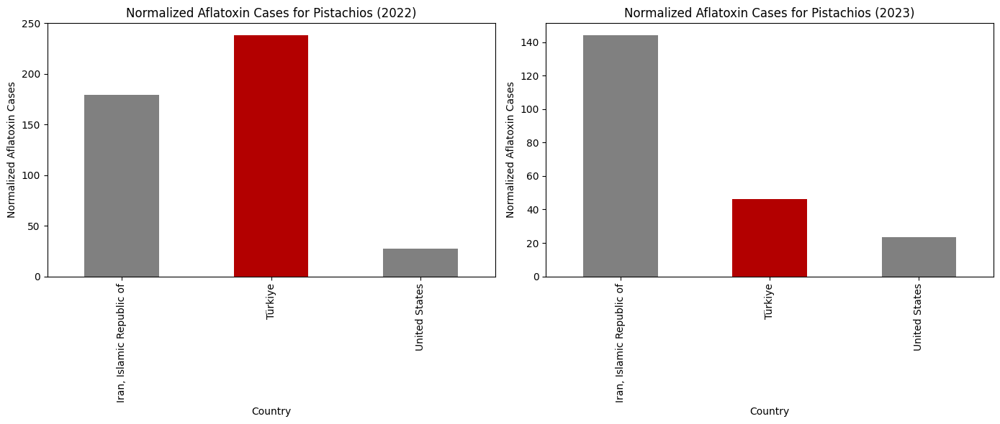

In [114]:
# Define the weights for each year
weights_2022 = {'United States': 0.799, 'Iran, Islamic Republic of': 0.117, 'Türkiye': 0.084}
weights_2023 = {'United States': 0.817, 'Iran, Islamic Republic of': 0.118, 'Türkiye': 0.065}

# Function to apply weights and normalize the counts
def normalize_counts(counts, weights):
    # Normalize by dividing each count by the corresponding weight
    normalized = counts.div(pd.Series(weights), axis=0)
    return normalized

# Normalize the aflatoxin counts for 2022 and 2023
aflatoxin_normalized_2022 = normalize_counts(aflatoxin_pistachio_counts.loc[2022], weights_2022)
aflatoxin_normalized_2023 = normalize_counts(aflatoxin_pistachio_counts.loc[2023], weights_2023)

# Display the normalized results
print("Normalized Aflatoxin Cases for 2022:")
print(aflatoxin_normalized_2022)

print("\nNormalized Aflatoxin Cases for 2023:")
print(aflatoxin_normalized_2023)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
aflatoxin_normalized_2022.plot(kind='bar', ax=plt.gca(), color=['grey', '#b30000', 'grey'])
plt.title('Normalized Aflatoxin Cases for Pistachios (2022)')
plt.ylabel('Normalized Aflatoxin Cases')
plt.xlabel('Country')

plt.subplot(1, 2, 2)
aflatoxin_normalized_2023.plot(kind='bar', ax=plt.gca(), color=['grey', '#b30000', 'grey'])
plt.title('Normalized Aflatoxin Cases for Pistachios (2023)')
plt.ylabel('Normalized Aflatoxin Cases')
plt.xlabel('Country')

plt.tight_layout()
plt.show()

In [115]:
# Group by Origin Country to aggregate the total number of aflatoxin cases related to pistachios
aflatoxin_pistachio_all_time_counts = filtered_aflatoxin_df.groupby('Origin Country').size()   

# Display the aggregated counts
print(aflatoxin_pistachio_all_time_counts)

Origin Country
Iran, Islamic Republic of    125
Türkiye                       83
United States                 73
dtype: int64


In [116]:
# Normalize the all-time aflatoxin counts using 2022 weights
aflatoxin_normalized_all_time = normalize_counts(aflatoxin_pistachio_all_time_counts, weights_2022)

# Display the normalized results
print("Normalized All-Time Aflatoxin Cases for Pistachios (using 2022 weights):")
print(aflatoxin_normalized_all_time)

Normalized All-Time Aflatoxin Cases for Pistachios (using 2022 weights):
Iran, Islamic Republic of    1068.376068
Türkiye                       988.095238
United States                  91.364205
dtype: float64


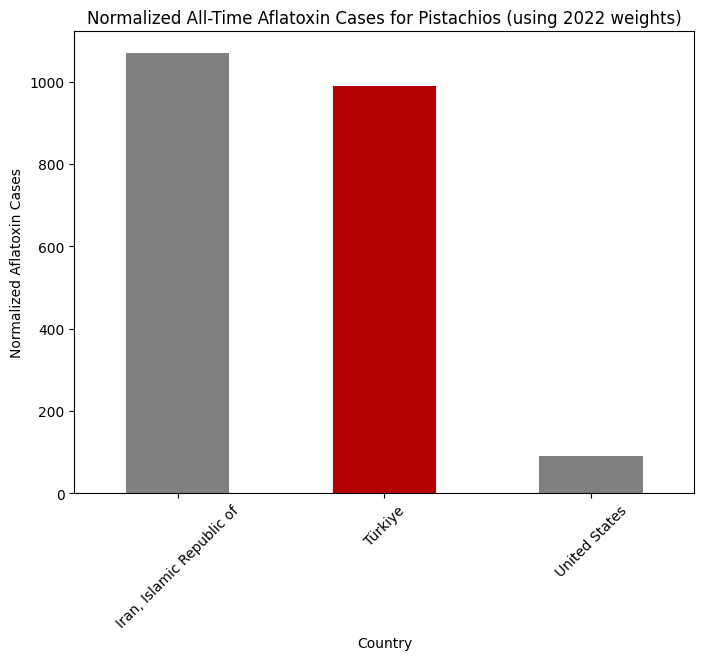

In [117]:
# Plot the normalized all-time aflatoxin cases
plt.figure(figsize=(8, 6))
aflatoxin_normalized_all_time.plot(kind='bar', color=['grey', '#b30000', 'grey'])
plt.title('Normalized All-Time Aflatoxin Cases for Pistachios (using 2022 weights)')
plt.ylabel('Normalized Aflatoxin Cases')
plt.xlabel('Country')
plt.xticks(rotation=45)
plt.show()

#### Normalized Aflatoxin cases for pistachios over each year via using 2022 weights

In [118]:
# Aggregate aflatoxin cases by year and country
aflatoxin_pistachio_yearly_counts = filtered_aflatoxin_df.groupby(
    [filtered_aflatoxin_df['Validation Date'].dt.year, 'Origin Country']
).size().unstack(fill_value=0)

# Display the aggregated counts to ensure correctness
print(aflatoxin_pistachio_yearly_counts)

Origin Country   Iran, Islamic Republic of  Türkiye  United States
Validation Date                                                   
2020                                    25       17             10
2021                                    31       26             11
2022                                    21       20             22
2023                                    17        3             19
2024                                    31       17             11


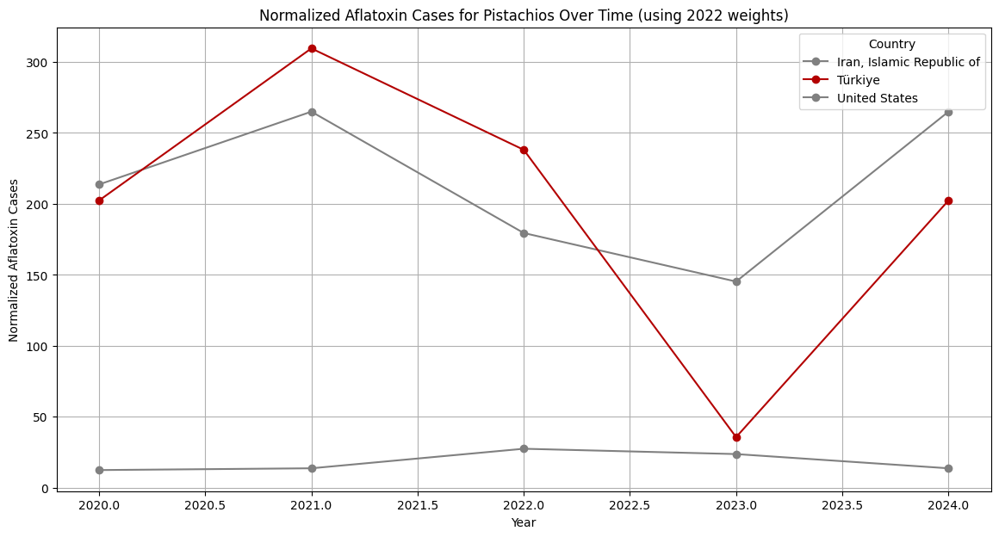

In [119]:
# Normalize the aflatoxin counts over time using the 2022 weights
aflatoxin_normalized_over_time = aflatoxin_pistachio_yearly_counts.div(pd.Series(weights_2022), axis=1)

# Plot the normalized aflatoxin cases over time using a line chart
plt.figure(figsize=(14, 7))

country_colors = {
    'Türkiye': '#b30000',       
    'Iran, Islamic Republic of': 'grey',  
    'United States': 'grey'  
}

# Loop through each country and plot its normalized cases over time
for country in aflatoxin_normalized_over_time.columns:
    plt.plot(aflatoxin_normalized_over_time.index, aflatoxin_normalized_over_time[country], marker='o', label=country,color = country_colors[country])

plt.title('Normalized Aflatoxin Cases for Pistachios Over Time (using 2022 weights)')
plt.xlabel('Year')
plt.ylabel('Normalized Aflatoxin Cases')
plt.legend(title='Country')
plt.grid(True)
plt.show()

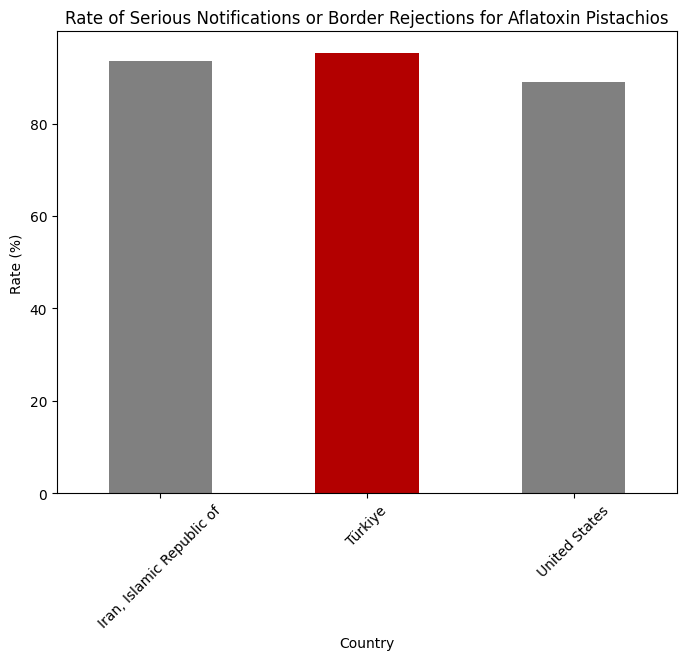

In [120]:
# Step 1: Filter for serious notifications or border rejections
serious_notifications_df = filtered_aflatoxin_df[
    (filtered_aflatoxin_df['Risk Decision'] == 'serious') &
    (filtered_aflatoxin_df['Notification Classification'] == 'border rejection notification')
]

# Step 2: Calculate the rate of serious notifications or border rejections
serious_notification_counts = serious_notifications_df.groupby('Origin Country').size()
total_aflatoxin_counts = filtered_aflatoxin_df.groupby('Origin Country').size()

serious_notification_rate = (serious_notification_counts / total_aflatoxin_counts) * 100

# Step 3: Visualize the comparison
plt.figure(figsize=(8, 6))
serious_notification_rate.plot(kind='bar', color=['grey', '#b30000', 'grey'])
plt.title('Rate of Serious Notifications or Border Rejections for Aflatoxin Pistachios')
plt.ylabel('Rate (%)')
plt.xlabel('Country')
plt.xticks(rotation=45)
plt.show()

# **Concluding Remarks**

#### Speculative Analysis: Why Turkey and Iran Show Similar Aflatoxin Results in Pistachios

Given the similar levels of aflatoxin contamination in pistachios from Turkey and Iran, it's crucial to delve deeper into the potential factors that may contribute to these comparable outcomes. Below are several speculative reasons that could explain why these two countries exhibit similar results:

##### 1. **Climate and Environmental Factors**
   - **Similar Climates:** Turkey and Iran share comparable climate zones, particularly in the regions where pistachios are cultivated. Both countries experience hot, dry summers and mild, wet winters, creating an environment conducive to the growth of *Aspergillus* molds, which produce aflatoxins. The dry and warm conditions during the harvesting and storage periods may further exacerbate the risk of mold growth if not carefully managed.
   - **Soil Conditions:** The soil types in the pistachio-growing regions of both countries may have similar properties, such as moisture retention and nutrient composition, which could influence the susceptibility of pistachios to aflatoxin contamination.

##### 2. **Agricultural Practices**
   - **Traditional Harvesting and Drying Methods:** Both Turkey and Iran predominantly use traditional methods for harvesting, drying, and storing pistachios. These methods, while cost-effective, might not always meet the stringent standards required to minimize aflatoxin contamination. For example, sun-drying pistachios on open fields without proper moisture control can increase the risk of mold formation.
   - **Pest Management:** The practices related to pest management might also play a role. If both countries rely on similar pesticides or have comparable levels of pest infestation, this could indirectly affect the levels of aflatoxins. Pests can damage the pistachio shells, making them more susceptible to mold contamination.

##### 3. **Supply Chain and Storage Practices**
   - **Post-Harvest Handling:** The way pistachios are handled after harvest, including transportation, sorting, and packaging, might be similar in Turkey and Iran. Any delays or inefficiencies in these processes could lead to increased exposure to conditions that favor aflatoxin production.
   - **Storage Conditions:** In both countries, pistachios might be stored in facilities that do not fully control temperature and humidity, creating an environment where aflatoxins can thrive. Given that pistachios are often stored for extended periods before export, the risk of contamination can increase over time.

##### 4. **Economic and Market Factors**
   - **Cost Constraints:** Both countries are major exporters of pistachios and may face similar economic pressures to keep production costs low. This could result in less investment in modern drying, storage, and monitoring technologies that could reduce aflatoxin levels.
   - **Market Demand and Export Focus:** The high global demand for pistachios might drive both countries to prioritize quantity over quality, leading to shortcuts in processes that could otherwise reduce aflatoxin contamination. The pressure to meet export deadlines might also contribute to insufficient drying or inadequate storage.

##### 5. **Regulatory and Monitoring Differences**
   - **Variations in Enforcement:** While both Turkey and Iran have regulations in place to control aflatoxin levels, the rigor with which these regulations are enforced could vary. This could lead to similar outcomes in aflatoxin levels if enforcement is less stringent or if there are gaps in the monitoring processes.
   - **Differences in Testing Standards:** There might be differences in how aflatoxin testing is conducted, with both countries potentially relying on similar testing methodologies that may not be as sensitive or thorough as those used in other countries, such as the United States.

##### 6. **Cultural and Social Factors**
   - **Cultural Importance of Traditional Methods:** In both Turkey and Iran, there might be a strong cultural attachment to traditional agricultural practices, which could lead to resistance to adopting new methods that might reduce aflatoxin contamination but are seen as less authentic or traditional.
   - **Farmer Education and Awareness:** The level of awareness and education among farmers regarding the risks of aflatoxin contamination and the best practices to prevent it could be similar in both countries. If there is a lack of widespread knowledge or training, it could result in similar contamination levels.

##### Conclusion

The similarity in aflatoxin contamination levels in pistachios from Turkey and Iran likely results from a combination of environmental, agricultural, economic, and cultural factors. Both countries face similar challenges due to their climates, traditional practices, and market pressures. Addressing these challenges would require a multi-faceted approach, including better education for farmers, investment in modern agricultural technologies, and more stringent enforcement of regulations.

Ultimately, understanding these underlying factors can help both Turkey and Iran improve their pistachio production processes, reducing aflatoxin levels and enhancing the safety and quality of their exports.

-----------------------------------------------


#### Speculative Analysis: Why the U.S. Performs Much Better in Controlling Aflatoxin in Pistachios

The United States consistently demonstrates lower levels of aflatoxin contamination in pistachios compared to Turkey and Iran. This disparity can be attributed to several factors that reflect differences in agricultural practices, regulatory frameworks, technological advancements, and economic conditions. Below are some key reasons why the U.S. might be performing significantly better:

##### 1. **Advanced Agricultural Practices**
   - **Modernized Farming Techniques:** U.S. pistachio farming benefits from highly advanced agricultural technologies and practices. The use of mechanized harvesting, precision agriculture, and controlled-environment drying significantly reduces the risk of aflatoxin contamination. These methods allow for better control over the conditions that can lead to mold growth, such as moisture levels and temperature during post-harvest processing.
   - **Integrated Pest Management (IPM):** The U.S. has robust Integrated Pest Management (IPM) programs that minimize crop damage and reduce the risk of mold contamination. IPM strategies are scientifically informed and often include biological controls, resistant varieties, and precise application of pesticides, which collectively contribute to healthier crops less prone to aflatoxin contamination.

##### 2. **Stringent Regulatory Framework**
   - **Rigorous Standards and Enforcement:** The U.S. Food and Drug Administration (FDA) enforces stringent aflatoxin standards for both domestic consumption and exports. These regulations are rigorously monitored and enforced, with severe penalties for non-compliance. The U.S. also has well-established protocols for aflatoxin testing at multiple stages of the supply chain, ensuring that contaminated products are detected and removed before reaching consumers.
   - **Mandatory Testing and Traceability:** The U.S. requires extensive testing of pistachios for aflatoxins, often using highly sensitive and advanced methods like High-Performance Liquid Chromatography (HPLC). Additionally, the U.S. agricultural system has robust traceability mechanisms that allow for the rapid identification and isolation of contaminated batches, reducing the likelihood of widespread contamination.

##### 3. **Technological Advancements**
   - **Advanced Drying and Storage Facilities:** U.S. pistachio processors often use state-of-the-art drying and storage facilities equipped with climate control technologies that regulate humidity and temperature. These facilities minimize the conditions that favor aflatoxin production, ensuring that pistachios are stored in an optimal environment.
   - **Real-Time Monitoring Systems:** The U.S. agricultural industry increasingly employs real-time monitoring systems that track the moisture content, temperature, and other critical factors throughout the storage and transportation phases. These systems help detect and mitigate potential aflatoxin risks before they escalate.

##### 4. **Economic Factors and Industry Structure**
   - **Investment in Quality Control:** The U.S. pistachio industry is characterized by significant investment in quality control measures. This includes funding for research and development aimed at improving farming practices and reducing contamination risks. The industry’s focus on maintaining a reputation for high-quality products incentivizes continuous improvement in aflatoxin management.
   - **Industry Consolidation:** The U.S. pistachio industry is more consolidated compared to those in Turkey and Iran. A smaller number of large, well-capitalized producers dominate the market, allowing for uniform implementation of best practices across large production areas. This consolidation enables economies of scale in quality control and ensures consistent adherence to high standards.

##### 5. **Education and Extension Services**
   - **Farmer Education and Training:** The U.S. has a strong tradition of agricultural extension services that provide farmers with up-to-date information and training on best practices for reducing aflatoxin risk. These services are often supported by land-grant universities and government agencies, ensuring that farmers have access to the latest research and technologies.
   - **Awareness Campaigns:** There are ongoing awareness campaigns in the U.S. focused on aflatoxin risks and mitigation strategies. These campaigns help ensure that all stakeholders, from farmers to processors, are informed about the importance of controlling aflatoxin levels and the methods for doing so.

##### 6. **Research and Development**
   - **Continuous Innovation:** The U.S. invests heavily in agricultural research and development, particularly in the area of food safety. Ongoing research into aflatoxin prevention, detection, and management has led to the development of innovative solutions that are widely adopted within the industry.
   - **Collaboration with Universities and Research Institutions:** U.S. pistachio growers often collaborate with leading research institutions to develop and implement new methods for aflatoxin control. This collaboration ensures that the latest scientific advancements are quickly translated into practical applications in the field.

##### Conclusion

The U.S.'s superior performance in controlling aflatoxin contamination in pistachios can be attributed to a combination of advanced agricultural practices, stringent regulatory frameworks, significant investment in technology and quality control, and a well-organized industry structure. These factors collectively create an environment where aflatoxin risks are minimized at every stage of the production process, from farm to table.

By contrast, countries like Turkey and Iran, where traditional practices are more prevalent and regulatory enforcement may be less rigorous, face greater challenges in managing aflatoxin contamination. The U.S. model offers valuable lessons in the importance of modernization, regulation, and education in achieving high food safety standards.

-----------------------------


#### An Explanation: Why Aflatoxins Are Highly Relevant for Dried Figs

Aflatoxins are particularly relevant for dried figs due to several factors related to the biology of figs, their cultivation, and the drying process. Here’s a detailed look at why aflatoxin contamination is a significant concern for dried figs:

##### 1. **Susceptibility of Figs to Fungal Infections**
   - **Natural Openings in Figs:** Figs have natural openings, known as ostioles, which can allow insects, water, and fungal spores to enter the fruit. This makes figs more susceptible to infection by *Aspergillus* fungi, the main producers of aflatoxins. These fungi can colonize the fig's interior, particularly in the presence of moisture or damage.
   - **Sugar Content:** Figs are rich in sugars, which provide an excellent nutrient source for *Aspergillus* fungi. This high sugar content, combined with the natural openings, creates a conducive environment for the growth of molds, which can lead to aflatoxin production.

##### 2. **Environmental Conditions During Growth and Harvest**
   - **Climate and Humidity:** Figs are typically grown in warm, Mediterranean climates, which are also favorable for the growth of *Aspergillus* species. The combination of high temperatures and humidity during the ripening period increases the risk of mold growth, especially if the figs are not harvested promptly.
   - **Late Harvesting:** In some regions, figs are left to partially dry on the tree before harvesting, which can increase the likelihood of *Aspergillus* colonization. The longer figs remain on the tree, the more they are exposed to environmental factors that can promote mold growth.

##### 3. **Traditional Drying Methods**
   - **Sun Drying:** Traditional drying methods for figs often involve sun drying, where the figs are spread out on mats or trays in the open air. This method, while cost-effective, exposes the figs to fluctuating environmental conditions, including changes in humidity and temperature, which can promote mold growth if the drying process is not carefully controlled.
   - **Inadequate Drying:** If figs are not dried thoroughly, they may retain moisture levels that are conducive to the growth of *Aspergillus* fungi. Even after drying, if figs are stored in humid conditions or if the drying process is interrupted (e.g., by rain), the risk of aflatoxin contamination remains high.

##### 4. **Post-Harvest Handling and Storage**
   - **Improper Storage:** After drying, figs need to be stored in conditions that prevent moisture absorption. Improper storage, such as in poorly ventilated or humid environments, can lead to rehydration of the figs, creating conditions where aflatoxin-producing fungi can thrive.
   - **Insect Damage:** Insects, particularly fig wasps, can damage the figs, making them more susceptible to fungal infections. This damage can occur both in the field and during storage, increasing the risk of aflatoxin contamination.

##### 5. **High Sensitivity to Fungal Contamination**
   - **Vulnerability During Packaging and Transportation:** Dried figs, even when properly dried, remain vulnerable to aflatoxin contamination during packaging and transportation. Any exposure to moisture or fluctuations in temperature during these stages can trigger the growth of aflatoxin-producing fungi.
   - **Fungal Spores in the Environment:** The environments where figs are dried, processed, and stored can harbor fungal spores that can easily contaminate the figs. Without stringent controls and cleanliness, these spores can infect figs at any point from harvest to consumer.

##### 6. **Economic and Health Impact**
   - **High Economic Value of Figs:** Dried figs are a valuable export product for countries like Turkey, making any contamination by aflatoxins a significant economic concern. Exporting contaminated figs can lead to rejections, financial losses, and damage to the country's reputation in international markets.
   - **Health Risks:** Aflatoxins are potent carcinogens, and their presence in food products like dried figs poses serious health risks to consumers. Long-term exposure to aflatoxins, even at low levels, can lead to liver cancer and other health issues, making it crucial to minimize their presence in the food supply.

##### Conclusion

Aflatoxins are particularly relevant for dried figs due to a combination of the fruit's biological characteristics, traditional drying methods, environmental conditions, and post-harvest handling practices. The high susceptibility of figs to fungal contamination, coupled with the serious health risks posed by aflatoxins, makes it essential to implement strict controls throughout the fig production process—from the field to the final product. Addressing these risks requires a combination of modern drying techniques, proper storage, and vigilant monitoring to ensure that dried figs remain safe for consumption.

---------------------------------------------

### Speculative Analysis and Remarks on the Chlorpyrifos Case

#### **What is Chlorpyrifos?**

Chlorpyrifos is a widely used organophosphate pesticide that has been employed globally for over half a century. It was first introduced in the 1960s by Dow Chemical Company and has been used extensively in agriculture to control a broad spectrum of pests, including insects that damage crops such as fruits, vegetables, and nuts.

**Chemical Properties and Mechanism of Action:**
- **Mechanism:** Chlorpyrifos works by inhibiting acetylcholinesterase, an enzyme essential for proper nervous system function in insects. By disrupting the transmission of nerve impulses, chlorpyrifos effectively kills pests.
- **Persistence:** Chlorpyrifos is known for its persistence in the environment, meaning it can remain active in soil and water for extended periods. This persistence contributes to its effectiveness but also raises concerns about its long-term environmental impact and potential health risks.

#### **Uses of Chlorpyrifos in Agriculture:**

Chlorpyrifos is applied to a wide range of crops, including:
- **Fruits:** Citrus fruits like oranges, lemons, and grapefruits.
- **Vegetables:** Peppers, tomatoes, and leafy greens.
- **Nuts:** Pistachios and almonds.

The pesticide is commonly used to combat pests such as aphids, caterpillars, and beetles that can cause significant damage to crops. In the context of Turkey, chlorpyrifos has been particularly important for controlling pests in citrus fruits (like lemons and oranges) and vegetables (like peppers).

#### **Regulation of Chlorpyrifos Across the World:**

Chlorpyrifos has been the subject of increasing scrutiny due to concerns about its potential impact on human health, particularly regarding neurodevelopmental effects in children and its classification as a potential endocrine disruptor. This has led to varying levels of regulation and even bans in different regions.

1. **United States:**
   - The Environmental Protection Agency (EPA) announced a phased ban on chlorpyrifos for food uses, which became effective in February 2022. This decision was driven by concerns about the pesticide’s potential to cause harm to children’s developing brains.
   - Non-food uses of chlorpyrifos, such as for mosquito control, are still permitted, but under strict guidelines.

2. **European Union:**
   - The European Union has taken a stringent stance on chlorpyrifos, banning its use across member states since January 2020. The EU’s decision was based on studies indicating the potential for developmental neurotoxicity and other harmful effects.
   - This ban applies to all uses of chlorpyrifos, including on imported products, which must comply with maximum residue limits (MRLs) set by the EU.

3. **Other Regions:**
   - **Australia:** Has restricted the use of chlorpyrifos, with tighter regulations on its application and stricter limits on residue levels in food products.
   - **India:** Continues to allow the use of chlorpyrifos, although there are ongoing discussions about its safety and the need for further regulation.

#### **Speculative Analysis: Why the Decrease in Chlorpyrifos Notifications from Turkey?**

1. **Improved Agricultural Practices:**
   - **Enhanced Pest Management:** Turkey may have improved its Integrated Pest Management (IPM) strategies, leading to more targeted and reduced use of chlorpyrifos. This would include better timing of pesticide application, use of biological controls, and adoption of less toxic alternatives.
   - **Regulatory Compliance:** The decrease in chlorpyrifos notifications could also be the result of stricter compliance with EU regulations. As Turkey seeks to maintain and expand its export markets in the EU, it likely invested in ensuring that its agricultural products meet the EU’s stringent pesticide residue limits.

2. **Market-Driven Changes:**
   - **Consumer Preferences:** Growing consumer demand for safer and pesticide-free food may have pressured Turkish producers to reduce chlorpyrifos usage, shifting towards more organic or low-pesticide farming methods.
   - **Supply Chain Improvements:** The decline in notifications could also be attributed to better post-harvest handling and storage practices that reduce the likelihood of pesticide residues being detected at the point of export.

3. **Impact of EU Regulations:**
   - **Reduced Use:** The EU’s ban on chlorpyrifos likely pushed Turkish exporters to either stop using the pesticide or to implement more rigorous testing and quality control measures before exporting products to the EU.
   - **Diversification of Markets:** Turkish producers may have also diversified their export markets to regions with less stringent regulations on chlorpyrifos, thus reducing the proportion of products subjected to EU-level scrutiny.

4. **Potential Shifts in Crop Cultivation:**
   - **Product Substitution:** In response to regulatory pressures, Turkish farmers might have shifted their focus to crops less reliant on chlorpyrifos or adopted crop varieties that are more resistant to pests, reducing the need for pesticide applications.

#### **Conclusion:**

The decrease in chlorpyrifos notifications from Turkey likely results from a combination of improved agricultural practices, regulatory compliance, and market-driven changes. As global awareness of pesticide risks continues to grow, Turkey’s ability to adapt to stricter international standards will be crucial in maintaining its position in global markets. Further analysis and ongoing monitoring are necessary to determine whether these improvements are sustained and how they compare with trends in other major exporting countries.

Moreover, the case of chlorpyrifos highlights the broader challenge of balancing effective pest control with the need to protect public health and the environment. As the global regulatory landscape continues to evolve, the future of pesticides like chlorpyrifos will likely involve a shift towards safer alternatives and more sustainable agricultural practices.

---------------------------------------------------

### Speculative Analysis: Why Chlorpyrifos Detection Might Be More Prevalent in Peppers (Beyond Trade Volume)

The prevalence of chlorpyrifos detection in peppers could be attributed to several factors beyond just the trade volume. These factors include the biology of the pepper plant, pest pressures, agricultural practices, and the sensitivity of testing methods. Here are some potential explanations:

#### 1. **Pest Pressure and Chlorpyrifos Usage**
   - **High Susceptibility to Pests:** Peppers are particularly susceptible to a wide range of pests, including aphids, whiteflies, and thrips. These pests not only damage the crop but can also act as vectors for plant diseases. Due to this high pest pressure, farmers may rely more heavily on chlorpyrifos as a broad-spectrum insecticide to protect their pepper crops.
   - **Frequent Applications:** The need to control persistent pest problems in peppers might lead to more frequent applications of chlorpyrifos compared to other crops. This could result in higher residues on peppers, increasing the likelihood of detection during testing.

#### 2. **Application Method and Residue Retention**
   - **Surface Area and Absorption:** Peppers have a relatively large surface area, and their skin can absorb pesticides more readily than other crops. If chlorpyrifos is applied as a foliar spray, it may adhere more to the surface of peppers, leading to higher residues. Additionally, the waxy surface of peppers can trap pesticides, making them more difficult to wash off and more likely to be detected during testing.
   - **Growth Stages and Residue Persistence:** Chlorpyrifos might be applied at multiple stages of the pepper plant's growth, from seedling to harvest. Depending on when the pesticide is applied, residues might persist until harvest, especially if the interval between the last application and harvesting is short. This persistence increases the chances of chlorpyrifos being present in the final product.

#### 3. **Agricultural Practices and Compliance**
   - **Variability in Farming Practices:** In regions where peppers are grown, there might be variability in how chlorpyrifos is used, including differences in application rates, timing, and adherence to recommended practices. Some farmers might not strictly follow pre-harvest intervals (PHI) or might apply higher doses to ensure pest control, leading to higher residue levels.
   - **Less Stringent Compliance:** In some cases, there might be less stringent compliance with regulations regarding pesticide usage, particularly in smaller farms or regions with limited access to agricultural extension services. This could result in higher chlorpyrifos residues on peppers.

#### 4. **Detection Sensitivity and Testing Frequency**
   - **Increased Testing Frequency:** Given the known issues with chlorpyrifos residues, authorities might conduct more frequent testing on crops like peppers that are known to have higher risk profiles. This increased scrutiny could lead to more frequent detections of chlorpyrifos, even if the actual residue levels are not significantly higher than in other crops.
   - **High Sensitivity of Detection Methods:** The methods used to test for chlorpyrifos residues might be particularly sensitive, especially for crops like peppers that are regularly flagged for pesticide residues. Advances in testing technology can detect even trace amounts of chlorpyrifos, leading to a higher reported prevalence in peppers.

#### 5. **Cultural Practices and Crop Characteristics**
   - **Harvesting and Handling:** Peppers are often harvested multiple times throughout the growing season. Each harvest could expose the crops to additional pesticide applications, leading to cumulative residues. Moreover, the way peppers are handled post-harvest, such as washing and packaging practices, might not be sufficient to remove all residues.
   - **Growth Environment:** Peppers are often grown in conditions that may require more intensive pest management, such as greenhouses or under plastic covers. These controlled environments can create humid and warm conditions that favor pest proliferation, necessitating more frequent pesticide applications.

#### Conclusion

The higher prevalence of chlorpyrifos detection in peppers is likely due to a combination of factors including the plant's susceptibility to pests, the application methods of chlorpyrifos, agricultural practices, and the sensitivity of detection methods. While trade volume plays a role, these other factors can contribute significantly to the likelihood of chlorpyrifos being detected in peppers compared to other crops. Addressing these issues may require targeted interventions, such as promoting integrated pest management (IPM) practices, ensuring proper application techniques, and improving compliance with pesticide regulations among pepper growers.

---------------------------------------------

## **Wrap up**

In summary, Turkey's standing in food safety notifications, particularly regarding serious risks and border rejections, reveals a complex picture of progress and persistent challenges. The analyses highlight several key findings:

1. **Turkey's Risk Profile:**
   - Turkey consistently ranks at the top of the notification list, particularly in serious risk classifications, which suggests that its exported products, especially in the agricultural sector, may have a higher propensity for risks. This is partly due to the nature of the products being exported, such as dried figs and pistachios, which are inherently more prone to aflatoxin contamination.

2. **Aflatoxin Contamination:**
   - The high prevalence of aflatoxin in dried figs is primarily due to the biological characteristics of figs and the traditional drying methods that increase their susceptibility to fungal infections. Similarly, pistachios face aflatoxin risks, especially when storage conditions are less than ideal. The spikes in aflatoxin notifications during the COVID-19 era could be explained by disruptions in the supply chain, leading to prolonged storage in inadequate environments. While there have been improvements in managing aflatoxin contamination, the decrease in cases may also be linked to a reduction in pistachio trade volumes, rather than purely to better practices.

3. **Pesticide Issues:**
   - The problem of pesticide residues, particularly from substances banned in the EU, remains significant. However, after the last observed peak, Turkey seems to have made progress in addressing this issue, moving towards more consistent compliance with international standards. This has helped bring Turkey's notifications more in line with the general distribution trends observed across other countries.

4. **Challenges in Drawing Conclusions:**
   - The absence of detailed trade volume data and tonnage information for each notification makes it difficult to draw statistically robust conclusions. However, by analyzing trends, spikes, and comparing findings across different periods and countries, the analysis suggests that while Turkey is on the right track, particularly in addressing pesticide issues, challenges like aflatoxin contamination remain persistent, albeit at more manageable levels.

5. **Practical Implications:**
   - For consumers concerned about food safety, it may be wise to be cautious about products known to be more prone to hazards, such as dried figs. As the analysis shows, aflatoxins are a recurring issue in such products, and while improvements have been made, they are not entirely resolved. In contrast, pistachios, though also susceptible, may be considered safer, especially when sourced from regions known for better agricultural practices. 

6. **The Bigger Picture:**
   - Looking ahead, the ongoing climate crisis may exacerbate these challenges. Worsening climate conditions could increase the risk of contamination and the need for additives during production, potentially leading to more frequent hazardous occurrences in food products. As such, continued vigilance and adaptation in agricultural practices will be crucial to maintaining and improving food safety standards.

In conclusion, Turkey has made notable strides in addressing some of the critical issues highlighted by food safety notifications, particularly in reducing pesticide residues. However, persistent problems like aflatoxin contamination in dried figs and pistachios underscore the need for ongoing improvements. While Turkey is moving in the right direction, the analysis suggests that there is still work to be done to fully mitigate these risks, both in the domestic and international markets. For consumers, being aware of the risks associated with specific products and making informed choices can be a practical approach to managing food safety concerns in daily life.
